In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns
# from matplotlib.colors import ListedColormap


%matplotlib inline

sns.set_style("whitegrid")
plt.rcParams.update({'font.size': 32})
sns.set_context("poster", rc={"font.size":34,"axes.titlesize":34,"axes.labelsize":34, "lines.linewidth": 2})  
plt.rcParams['figure.figsize'] = 15, 12

pd.options.display.max_columns = 999
pd.options.display.max_rows = 100

In [8]:
import src.DataContainer as DataContainer

### Loading Data:

In [9]:
dc = DataContainer.DataContainer()

loading sites:
CA-NS8


/Users/MarkelovIgor/git/biogeochemistry/upscaling_project/ameriflux/src/DataContainer.py:114: FutureWarning: convert_objects is deprecated.  Use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  df = df.convert_objects(convert_numeric=True)


CA-Qfo
CA-TP1
CA-Qcu
CA-NS2
CA-SF1
CA-SF3
CA-TP2
CA-NS7
CA-NS6
CA-Gro
CA-NS3
CA-TP3
CA-TP4
CA-Man
CA-Obs
CA-NS5
CA-TPD
US-Los
CA-NS1
US-FPe
CA-SF2
CA-Oas
CA-NS4
CA-Ojp


In [10]:
df = dc.df
sites = [a for a in df.site.unique()]; sites.sort()

In [ ]:
sites

In [11]:
df.head()

,index,TIMESTAMP_END,USTAR,TA,WD,WS,NEE_PI,FC,SC,H,SH,LE,SLE,G,TS_1,TS_2,P,RH,PA,CO2_1,CO2_2,VPD_PI,SWC_1,SWC_2,NETRAD,PPFD_IN,SW_IN,SW_DIF,PPFD_OUT,SW_OUT,LW_IN,LW_OUT,H2O,RECO_PI,APAR,PPFD_DIF,FAPAR,ZL,LOCATION_LAT,LOCATION_LONG,site,date
TIMESTAMP_START,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2003-08-31 11:30:00,46679,200308311200,0.231,NaN,316.467,0.130,NaN,5.615,NaN,115.430,NaN,11.032,NaN,NaN,NaN,NaN,NaN,45.204,NaN,378.782,378.782,NaN,NaN,NaN,247.920,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.000,NaN,NaN,NaN,NaN,NaN,55.8981,-98.2161,CA-NS8,2003-08-31 11:30:00
2003-08-31 12:00:00,46680,200308311230,0.178,NaN,299.445,0.101,NaN,2.183,NaN,102.636,NaN,19.293,NaN,NaN,NaN,NaN,NaN,43.901,NaN,381.000,381.000,NaN,NaN,NaN,161.842,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.130,NaN,NaN,NaN,NaN,NaN,55.8981,-98.2161,CA-NS8,2003-08-31 12:00:00
2003-08-31 12:30:00,46681,200308311300,0.182,NaN,318.902,0.117,NaN,1.098,NaN,103.436,NaN,16.979,NaN,NaN,NaN,NaN,NaN,45.535,NaN,381.645,381.645,NaN,NaN,NaN,211.170,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.319,NaN,NaN,NaN,NaN,NaN,55.8981,-98.2161,CA-NS8,2003-08-31 12:30:00
2003-08-31 13:00:00,46682,200308311330,0.277,NaN,270.320,0.104,NaN,4.039,NaN,108.719,NaN,12.070,NaN,NaN,NaN,NaN,NaN,42.172,NaN,382.018,382.018,NaN,NaN,NaN,222.333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.327,NaN,NaN,NaN,NaN,NaN,55.8981,-98.2161,CA-NS8,2003-08-31 13:00:00
2003-08-31 13:30:00,46683,200308311400,0.279,NaN,357.745,0.081,NaN,1.239,NaN,53.818,NaN,14.909,NaN,NaN,NaN,NaN,NaN,45.160,NaN,382.364,382.364,NaN,NaN,NaN,162.435,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.581,NaN,NaN,NaN,NaN,NaN,55.8981,-98.2161,CA-NS8,2003-08-31 13:30:00


In [ ]:
df.shape

In [12]:
save_fig = False

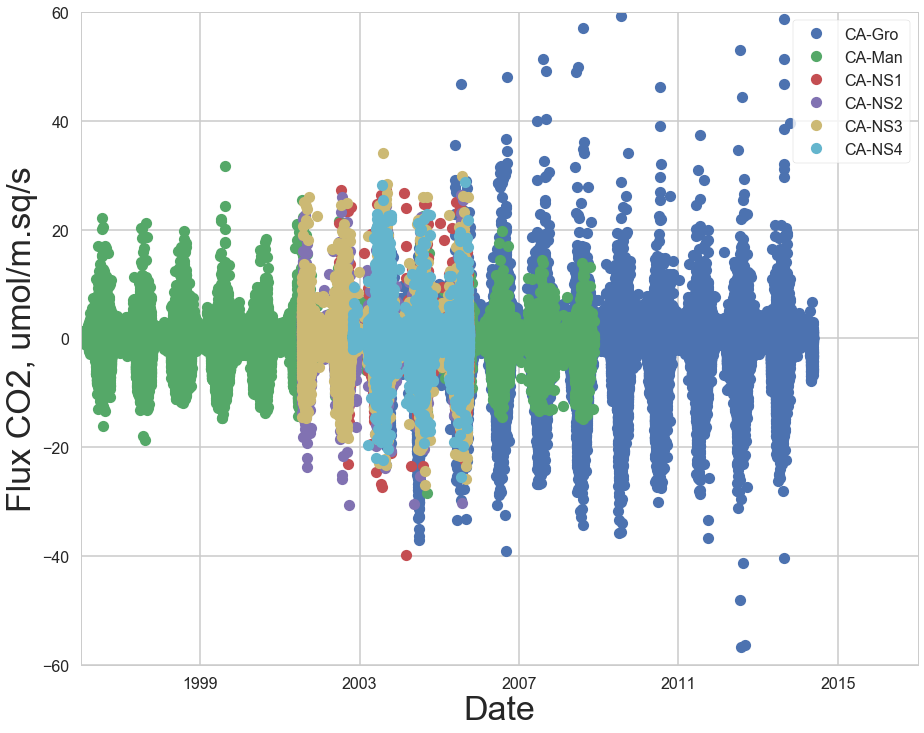

In [13]:
import datetime
for s,c in zip(sites, sns.color_palette()):
    plt.plot_date(df[df['site']==s]['date'],df[df['site']==s]['FC'], label=s, color=c)
    plt.xlabel('Date')
    plt.ylabel('Flux CO2, umol/m.sq/s')
#     plt.xlim([-20,50])
    plt.ylim([-60,60])
plt.legend(frameon=1)
plt.xlim([datetime.date(1996, 1, 1), datetime.date(2017, 1, 1)])
if save_fig:
    plt.savefig('img/FvsTime/all.png', dpi=150)
plt.show()

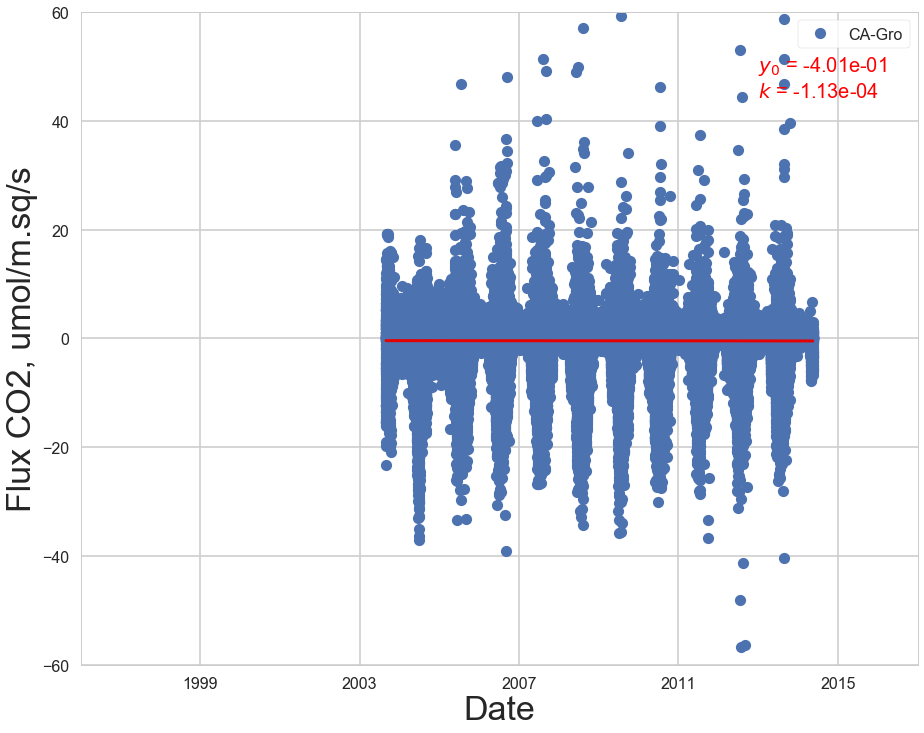

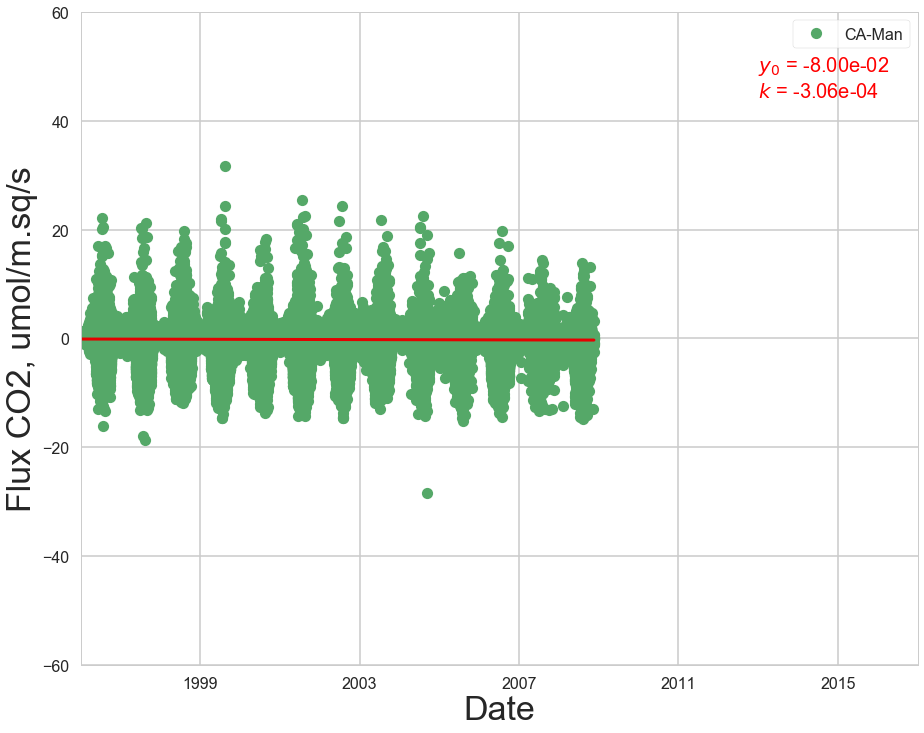

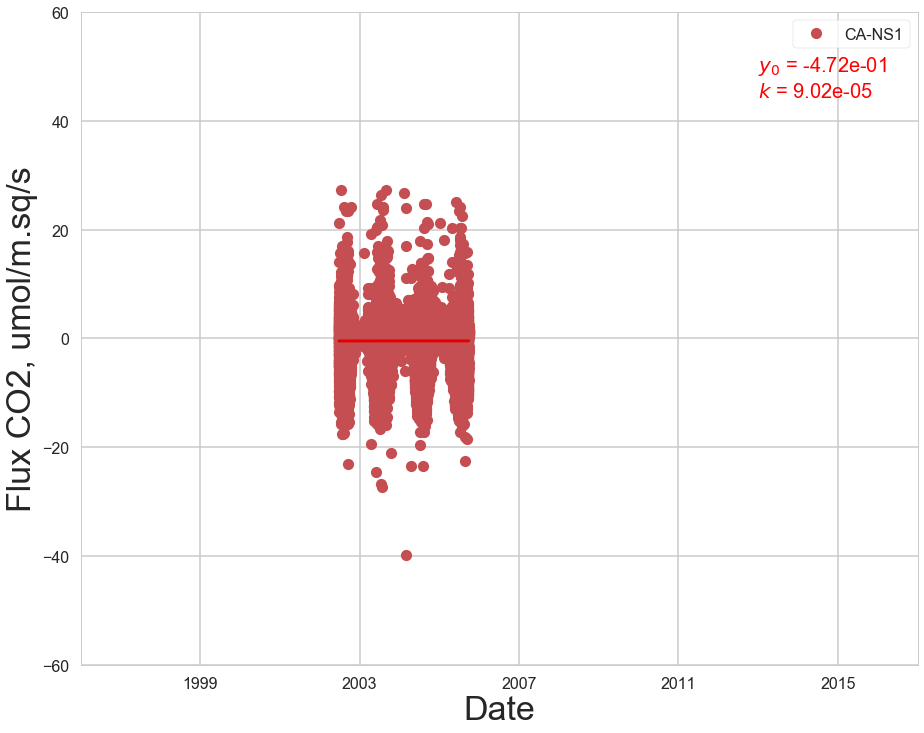

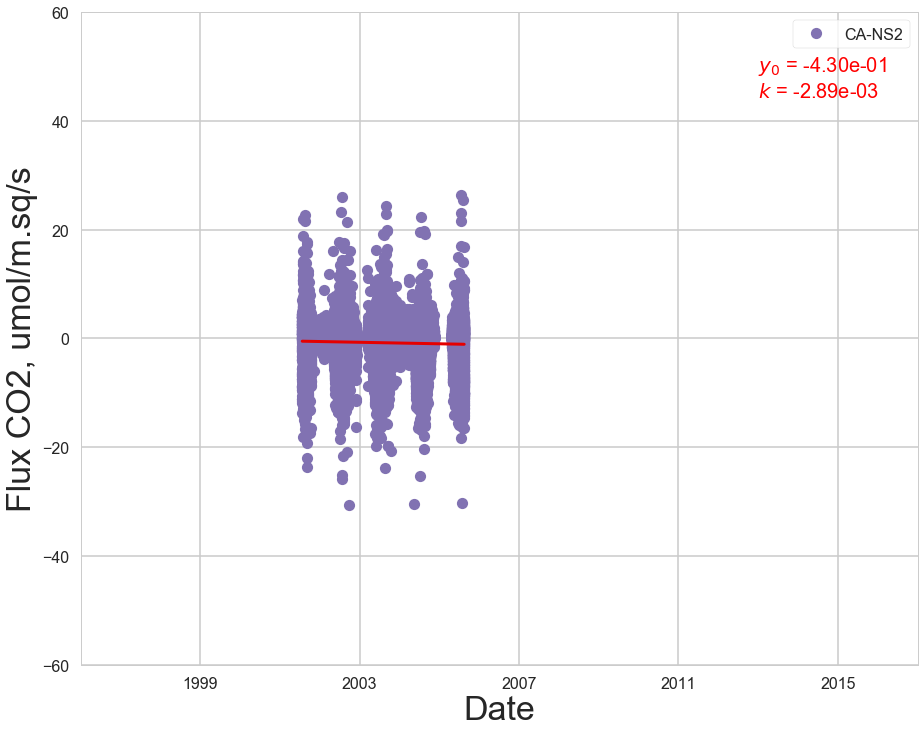

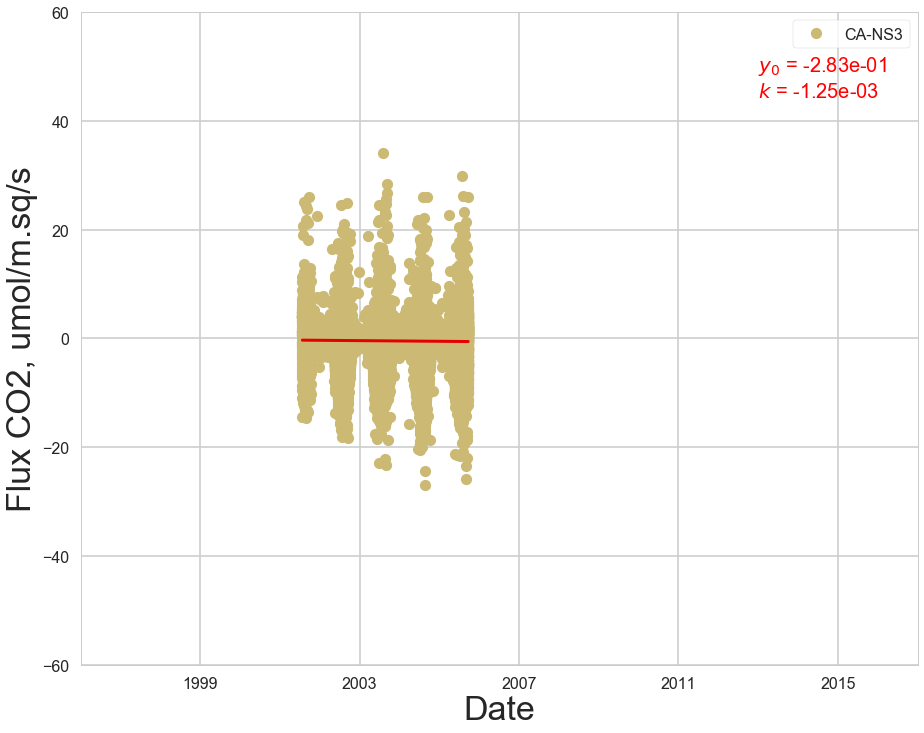

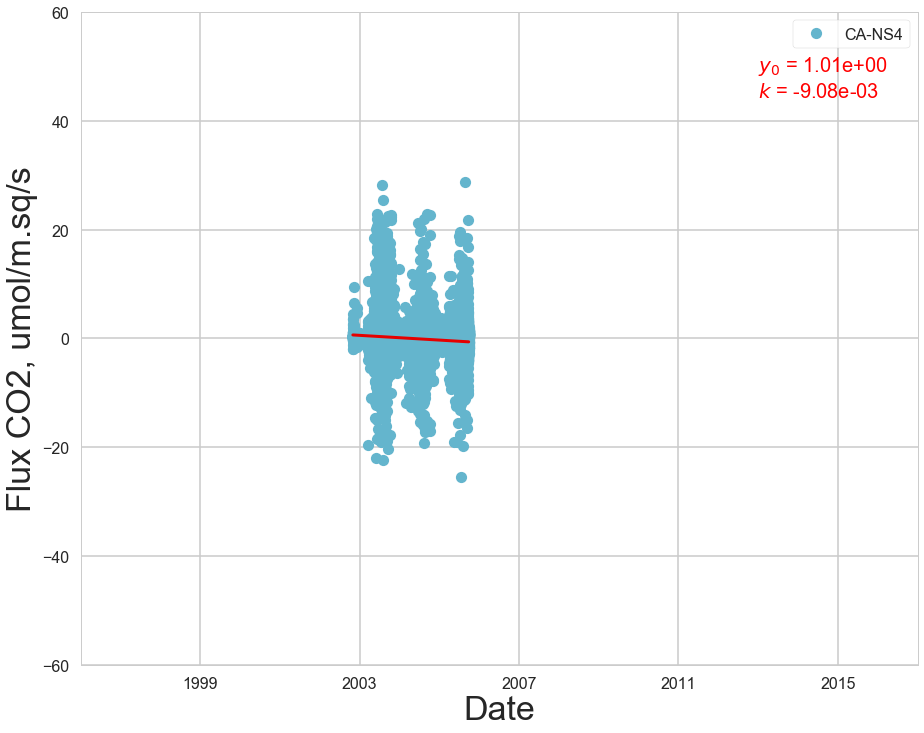

In [14]:
for s,c in zip(sites, sns.color_palette()):
    plt.plot_date(df[df['site']==s]['date'],df[df['site']==s]['FC'], label=s, color=c)

    result = DataContainer.linear_fit(df[df['site']==s], 'FC', 'index')
    plt.plot(df[df['site']==s]['date'].values, result.fittedvalues.values, color=sns.xkcd_rgb["red"], lw=3)
    lin_fit_y0 = r'$y_0$ = %.2e' % (result.params[0])
    lin_fit_k = r'$k$ = %.2e' % (result.params[1] * 365)   
    plt.annotate(lin_fit_y0, xy=(0.81, 0.91), xycoords='axes fraction', color='r', fontsize=20)
    plt.annotate(lin_fit_k, xy=(0.81, 0.87), xycoords='axes fraction', color='r', fontsize=20)    
    plt.xlabel('Date')
    plt.ylabel('Flux CO2, umol/m.sq/s')
#     plt.xlim([-20,50])
    plt.ylim([-60,60])
    plt.xlim([datetime.date(1996, 1, 1), datetime.date(2017, 1, 1)])
    plt.legend(frameon=1)
    if save_fig:
        plt.savefig('img/FvsTime/{}.png'.format(s), dpi=150)
    plt.show()

/Users/MarkelovIgor/anaconda/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


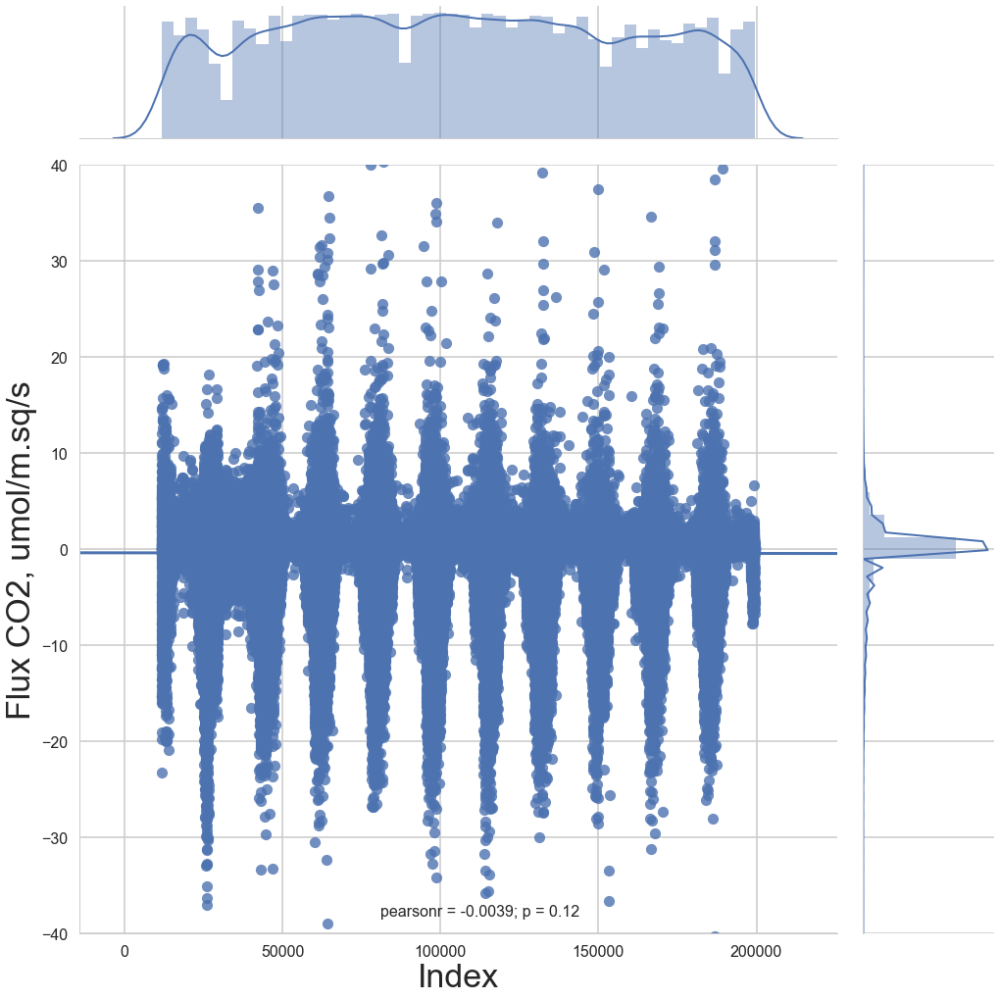

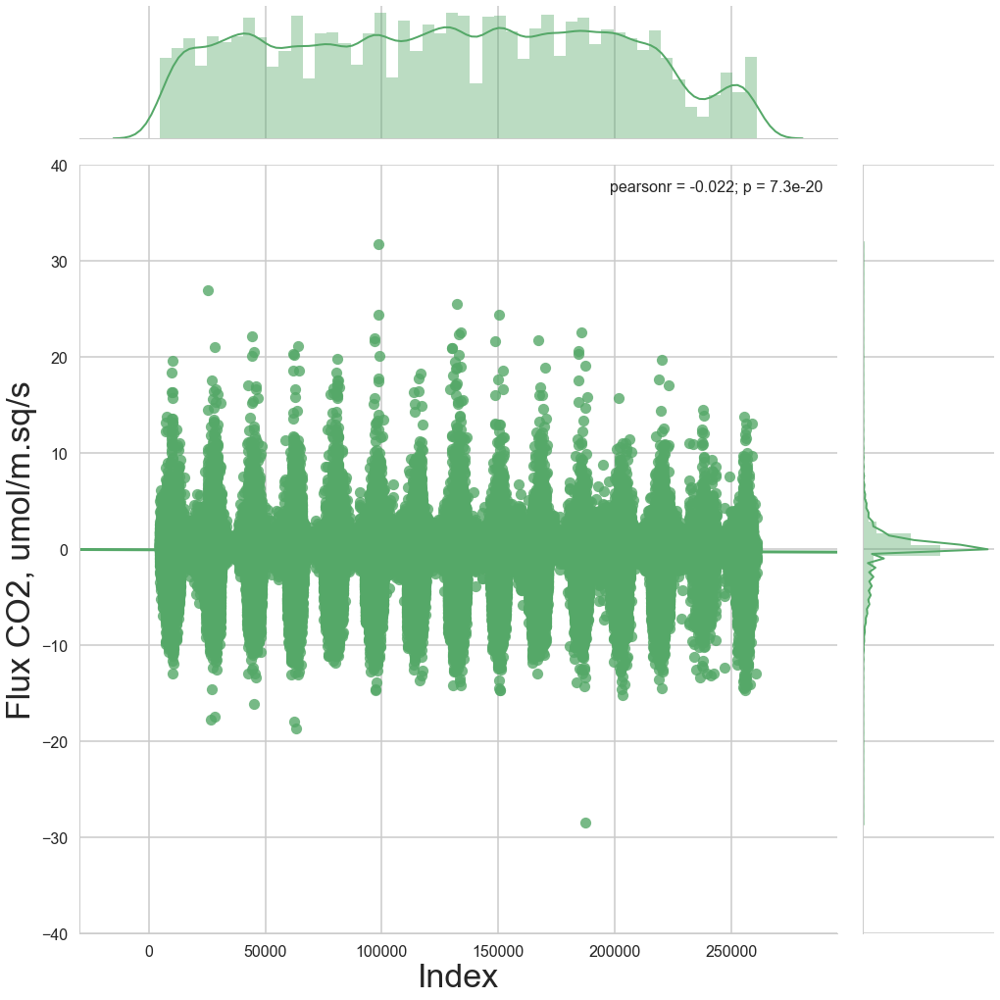

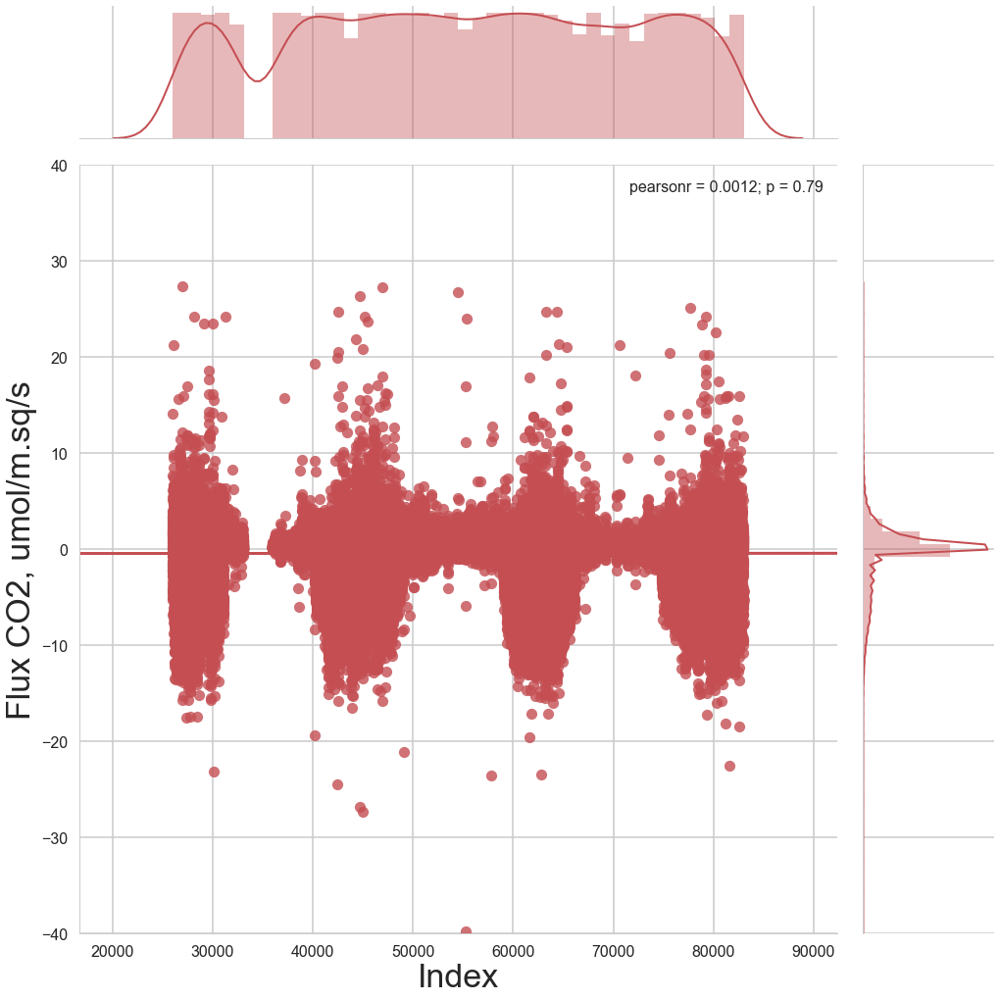

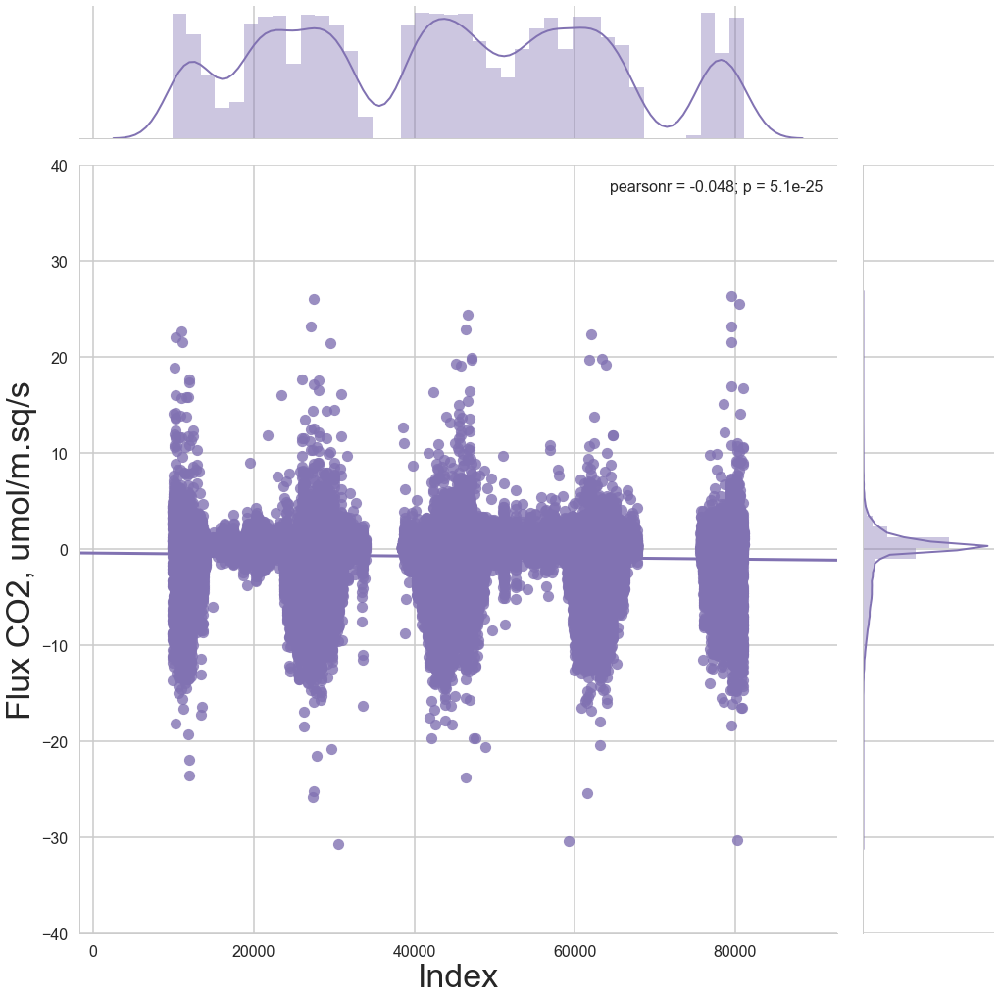

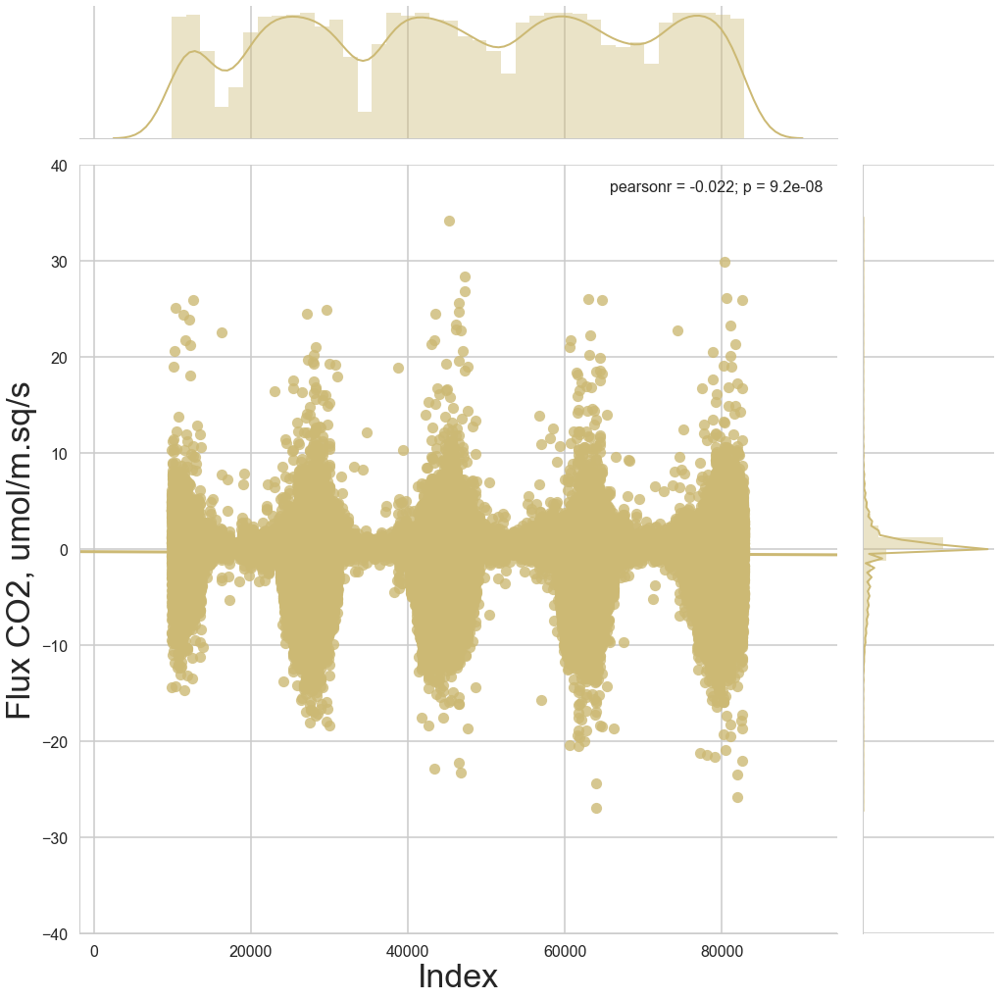

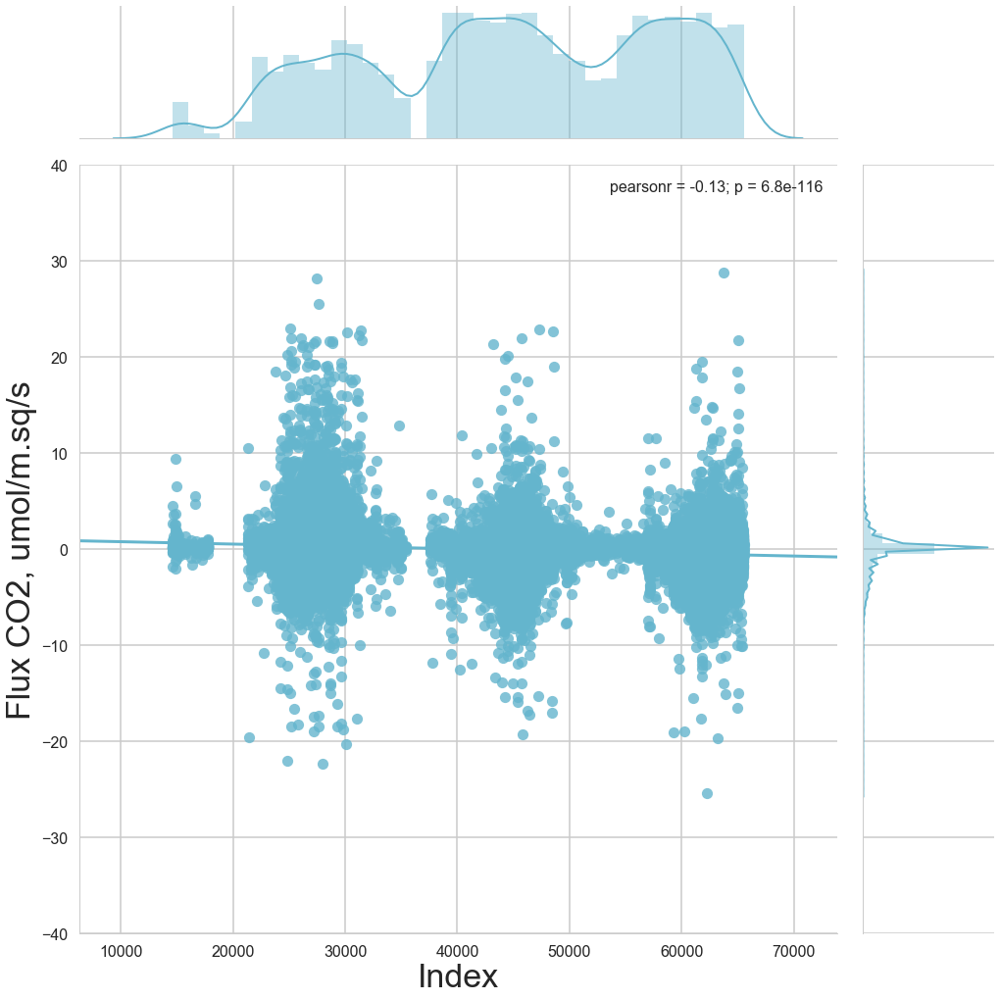

In [15]:
for s,c in zip(sites, sns.color_palette()):
#     plt.scatter(df[df['site']==s]['TS_2'],df[df['site']==s]['FC'], label=s, color=c)
    g = sns.jointplot(df[df['site']==s]['index'], df[df['site']==s]['FC'], label=s, color=c, size=15, kind='reg',dropna=1, ylim=(-40,40))
    g.set_axis_labels('Index', 'Flux CO2, umol/m.sq/s');
#     ax = plt.gca()
#     xticks = ax.get_xticks()
#     xticks_dates = [datetime.datetime.fromtimestamp(x).strftime('%Y') for x in xticks]
#     ax.set_xticklabels(xticks_dates)
#     plt.xlim([datetime.date(1996, 1, 1), datetime.date(2017, 1, 1)])
    if save_fig:
        plt.savefig('img/FvsTimeDen/{}.png'.format(s), dpi=150)
    plt.show()


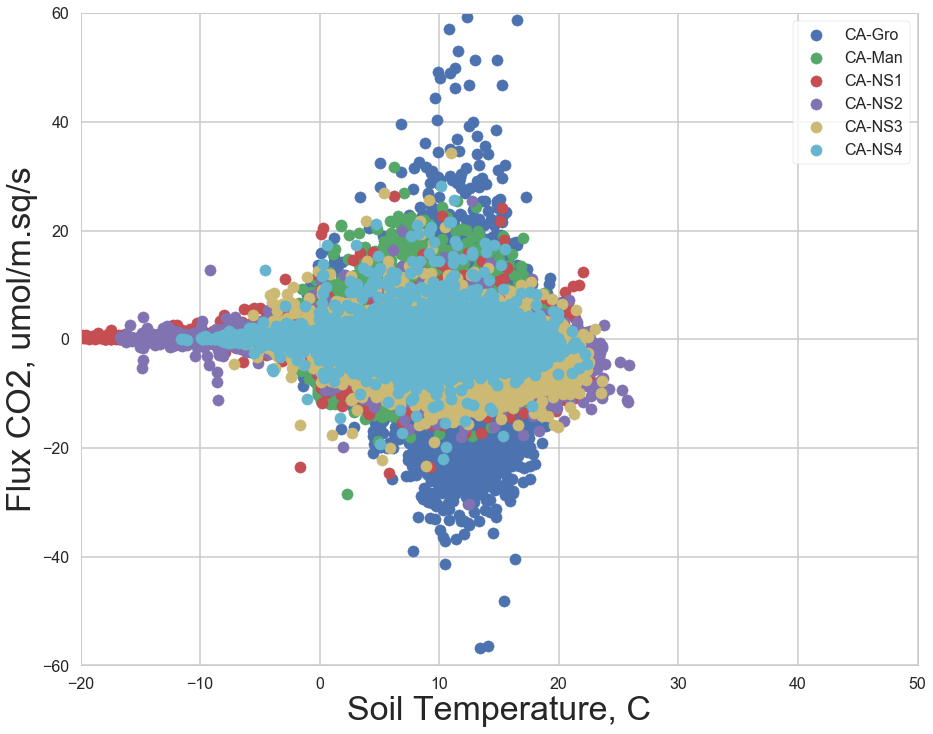

In [16]:
for s,c in zip(sites, sns.color_palette()):
    plt.scatter(df[df['site']==s]['TS_2'],df[df['site']==s]['FC'], label=s, color=c)
    plt.xlabel('Soil Temperature, C')
    plt.ylabel('Flux CO2, umol/m.sq/s')
    plt.xlim([-20,50])
    plt.ylim([-60,60])
plt.legend(frameon=1)
if save_fig:
    plt.savefig('img/FvsT/all.png', dpi=150)
plt.show()

/Users/MarkelovIgor/anaconda/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


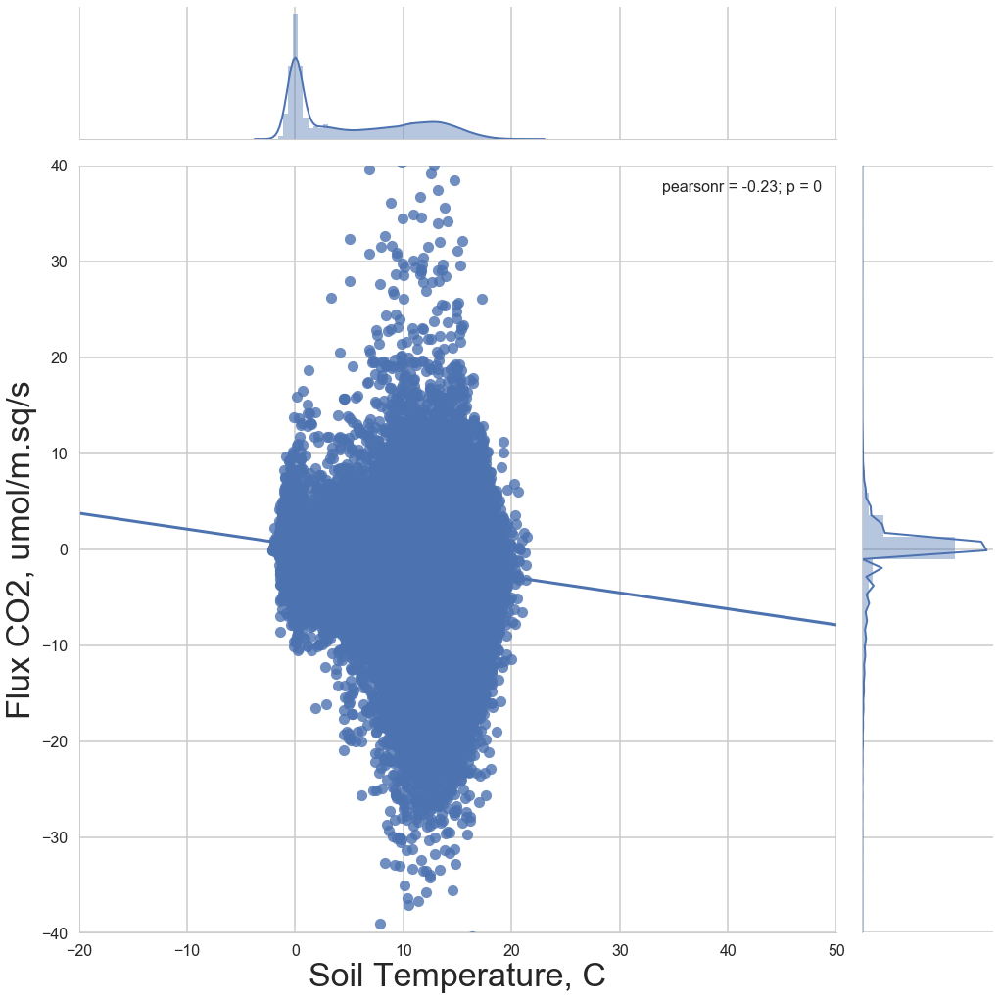

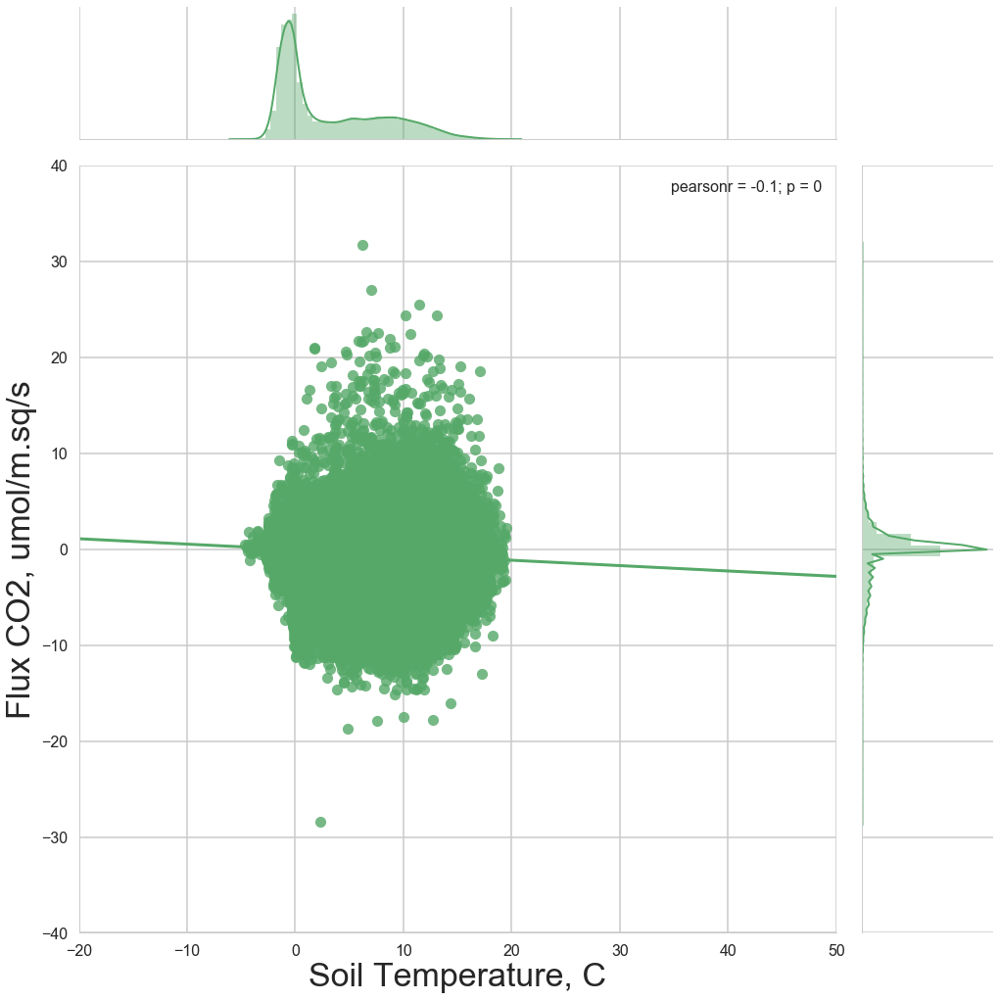

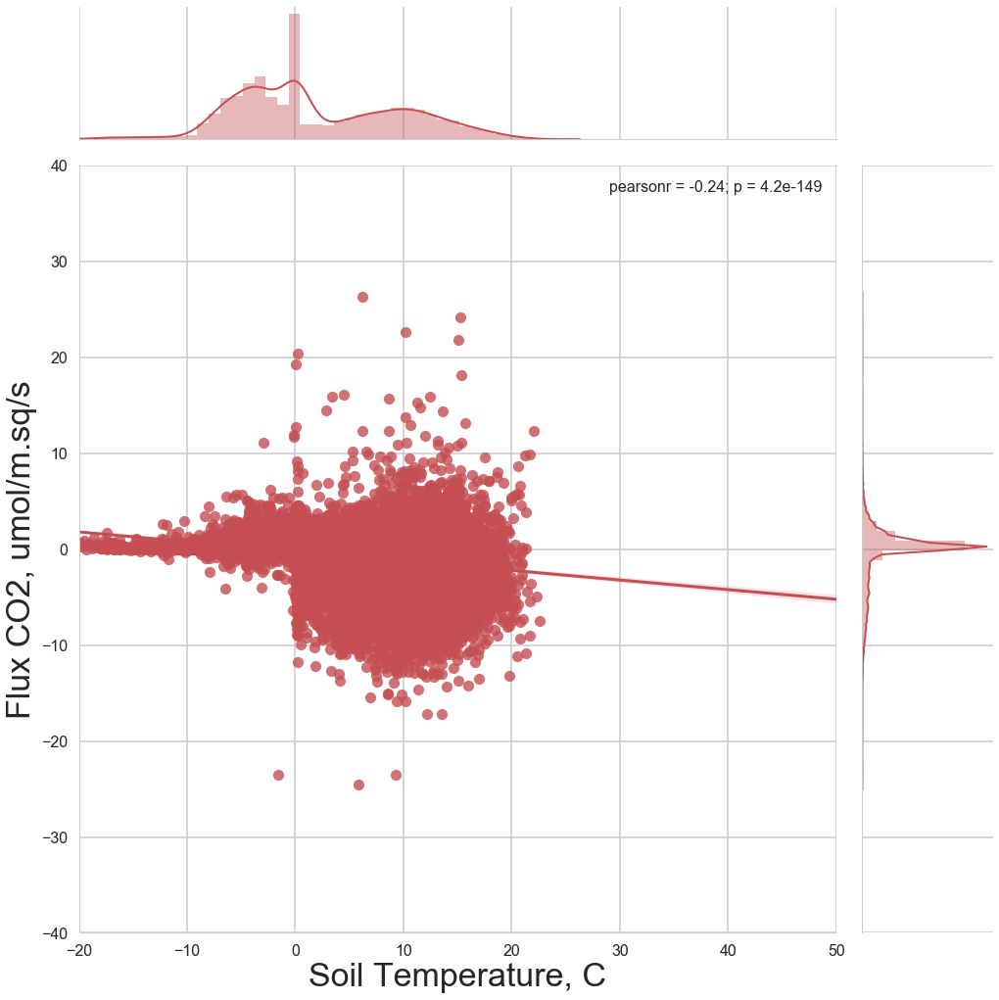

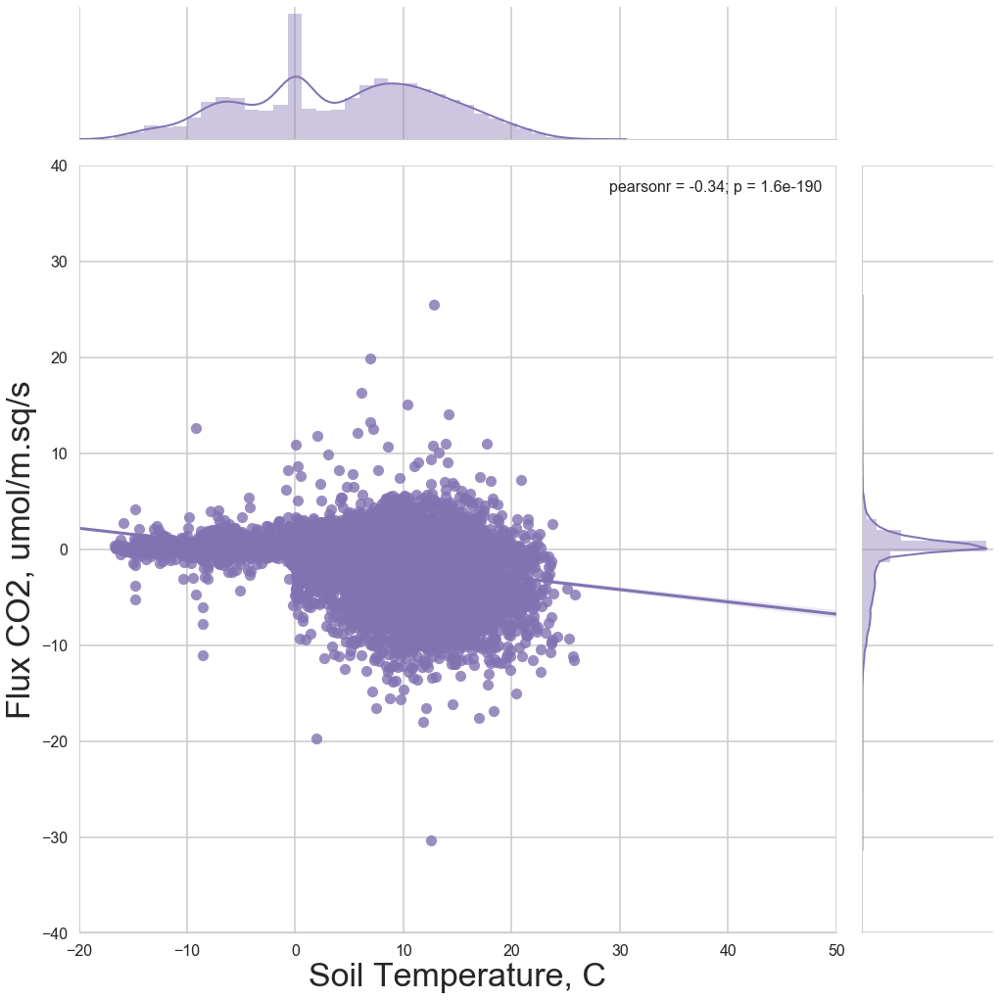

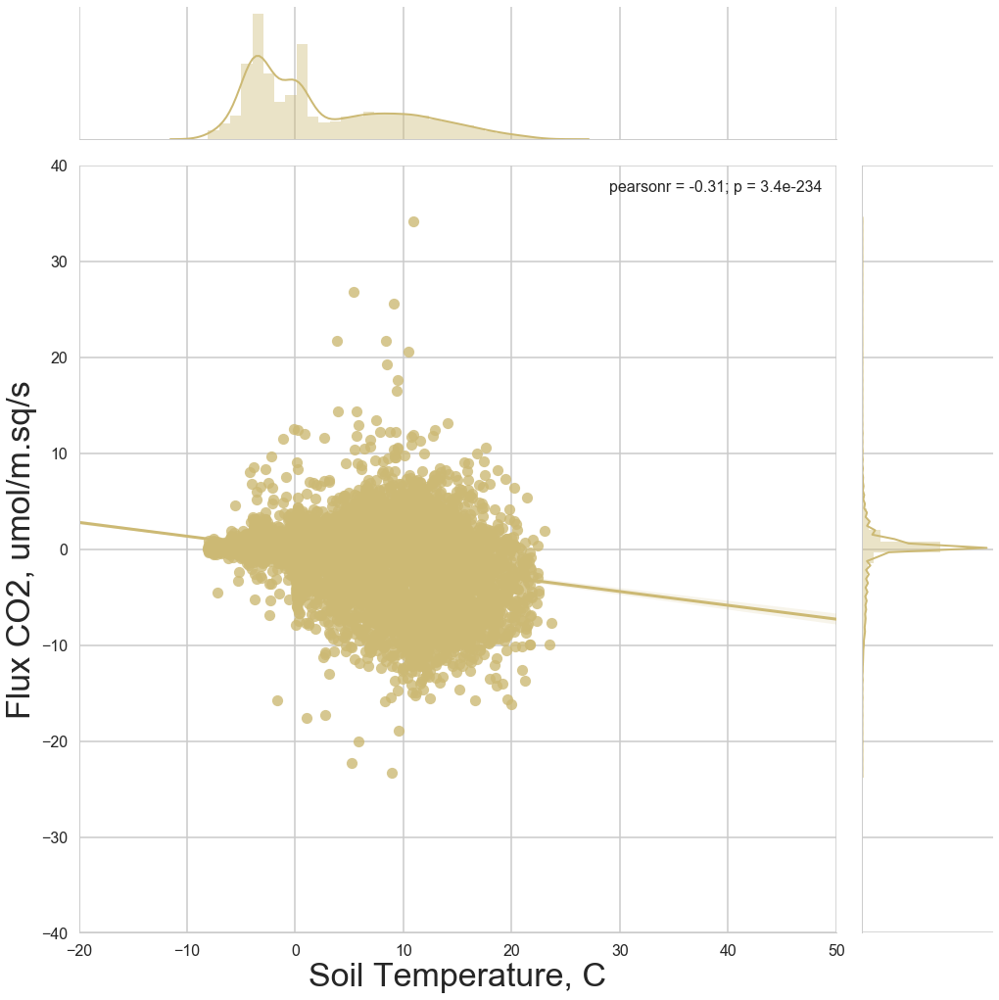

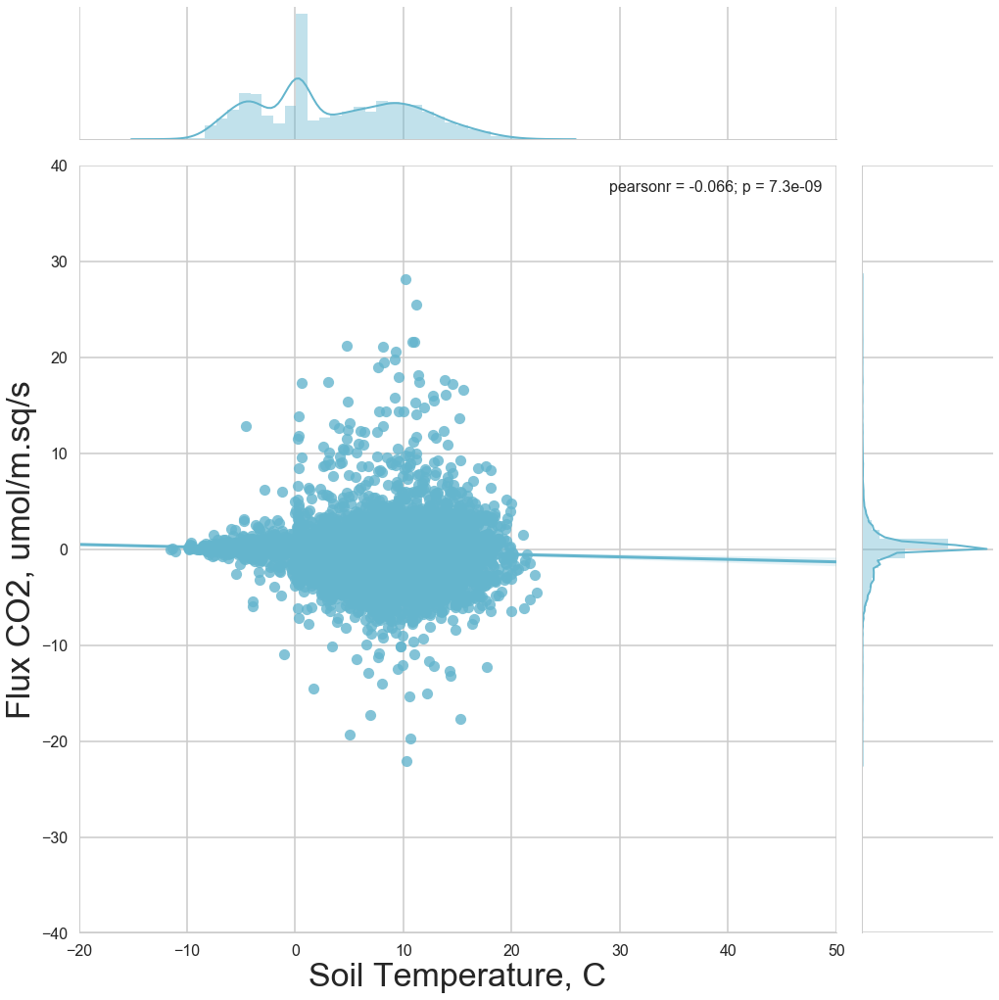

In [17]:
for s,c in zip(sites, sns.color_palette()):
#     plt.scatter(df[df['site']==s]['TS_2'],df[df['site']==s]['FC'], label=s, color=c)
    g = sns.jointplot(df[df['site']==s]['TS_2'],df[df['site']==s]['FC'], label=s, color=c, size=15, kind='reg',dropna=1, xlim=(-20,50), ylim=(-40,40))
    g.set_axis_labels('Soil Temperature, C', 'Flux CO2, umol/m.sq/s');
    if save_fig:
        plt.savefig('img/FvsT/{}.png'.format(s), dpi=150)
    plt.show()


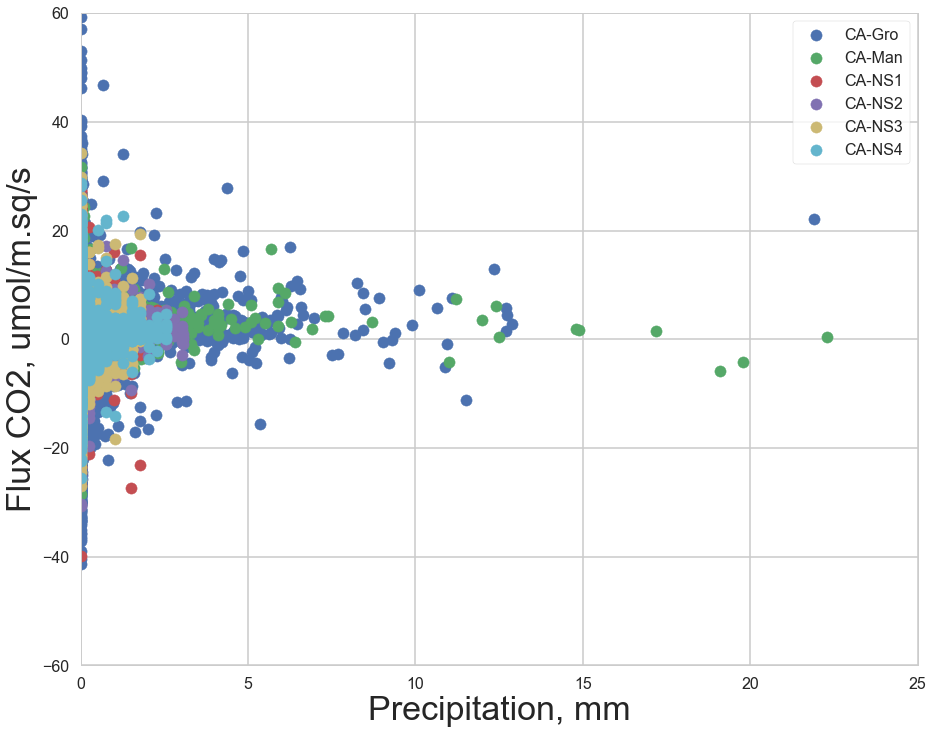

In [18]:
for s,c in zip(sites, sns.color_palette()):
    plt.scatter(df[df['site']==s]['P'],df[df['site']==s]['FC'], label=s, color=c)

plt.xlim([0,25])
plt.ylim([-60,60])
plt.xlabel('Precipitation, mm')
plt.ylabel('Flux CO2, umol/m.sq/s')
plt.legend(frameon=1)
if save_fig:
    plt.savefig('img/FvsP/all.png'.format(s), dpi=150)

plt.show()

/Users/MarkelovIgor/anaconda/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


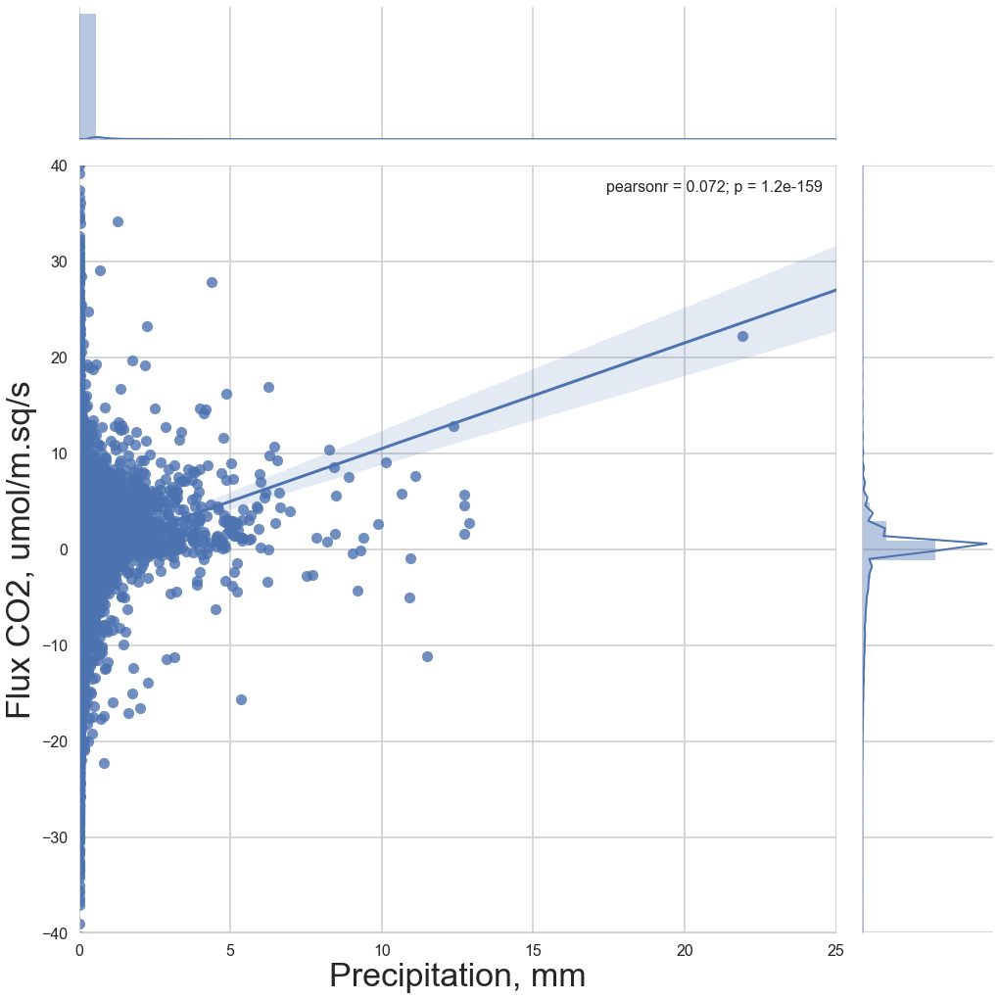

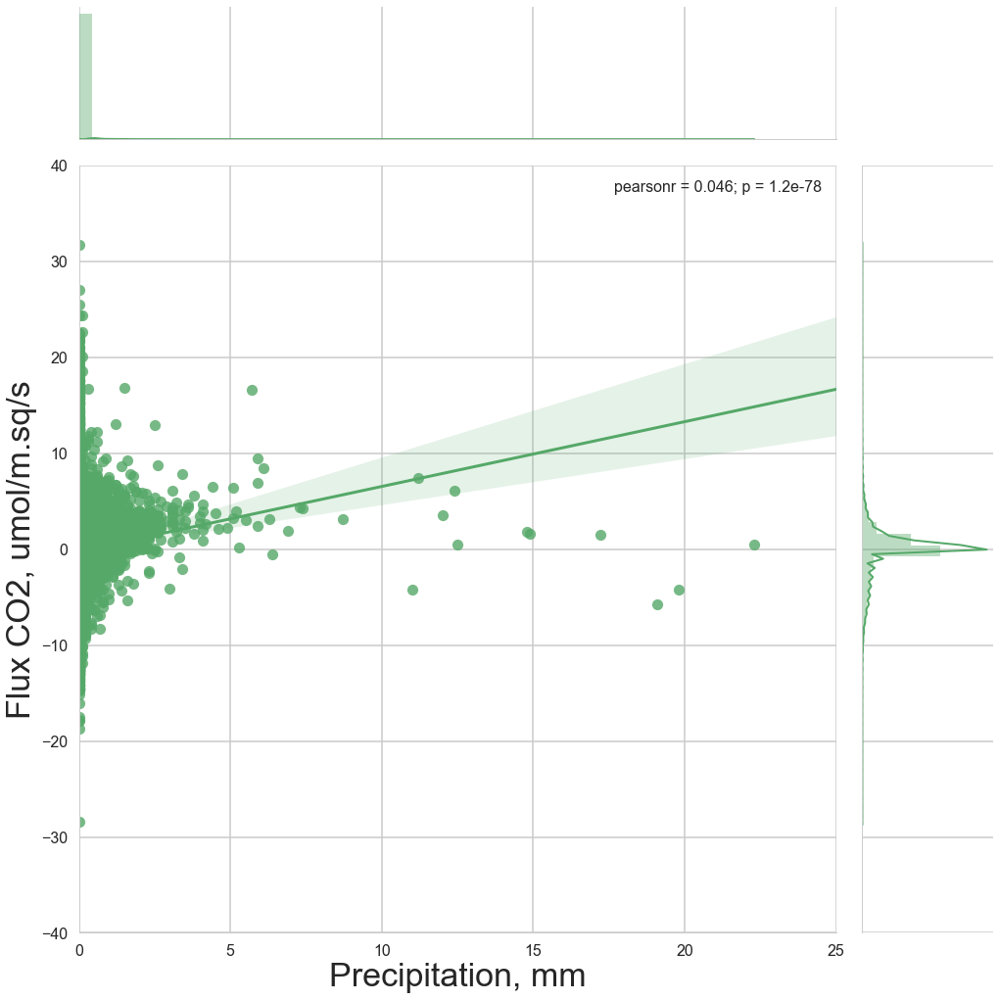

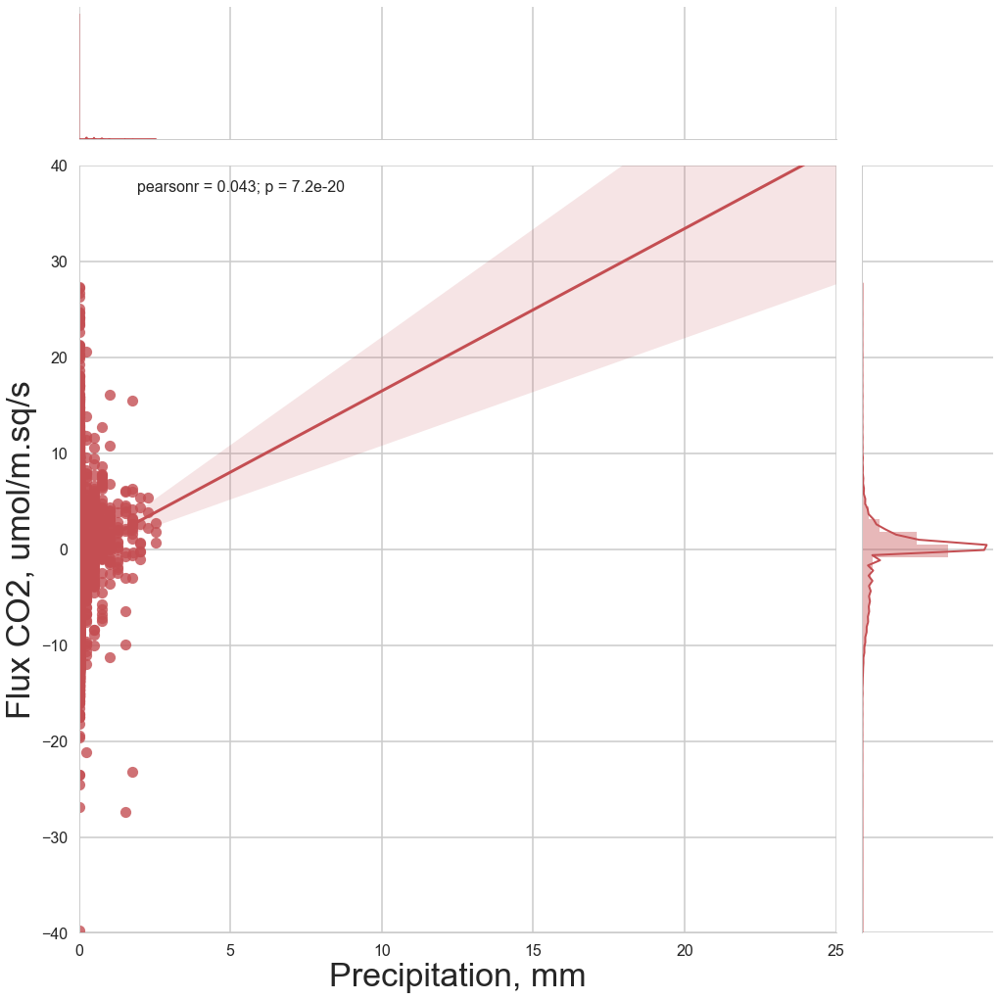

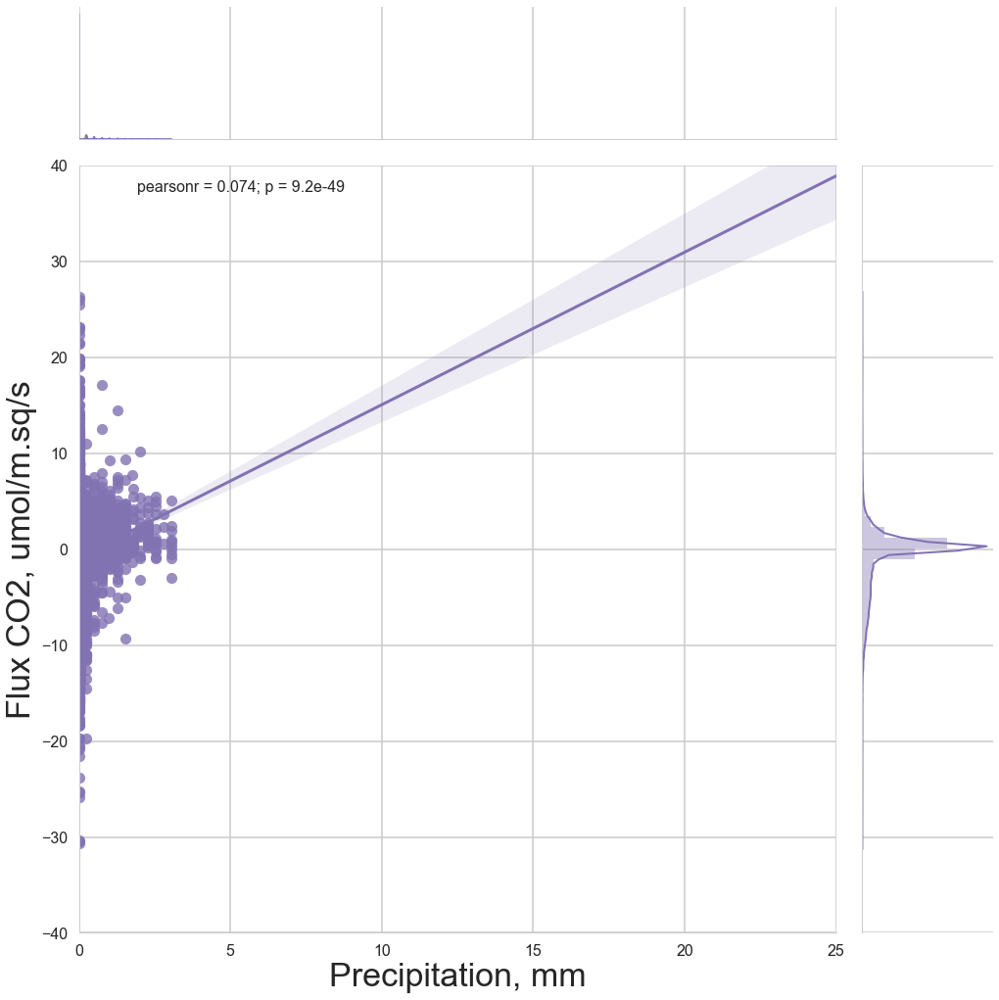

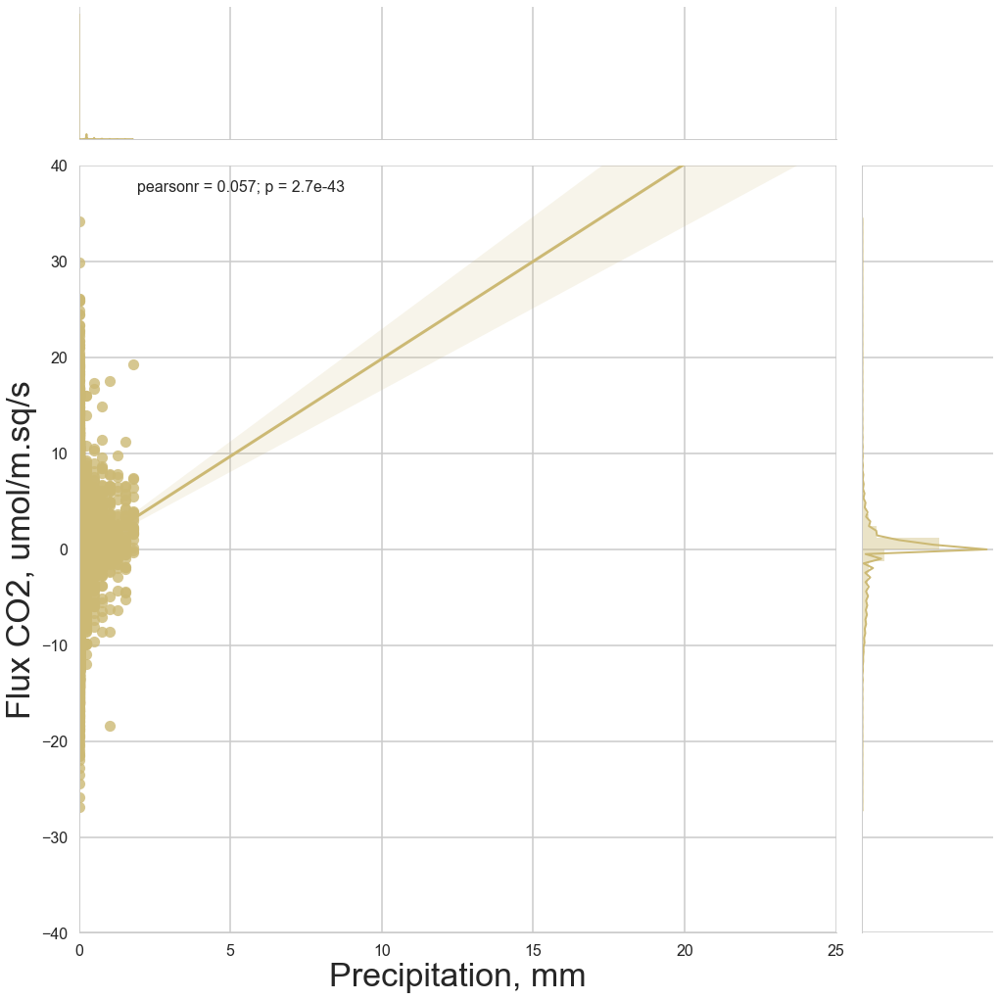

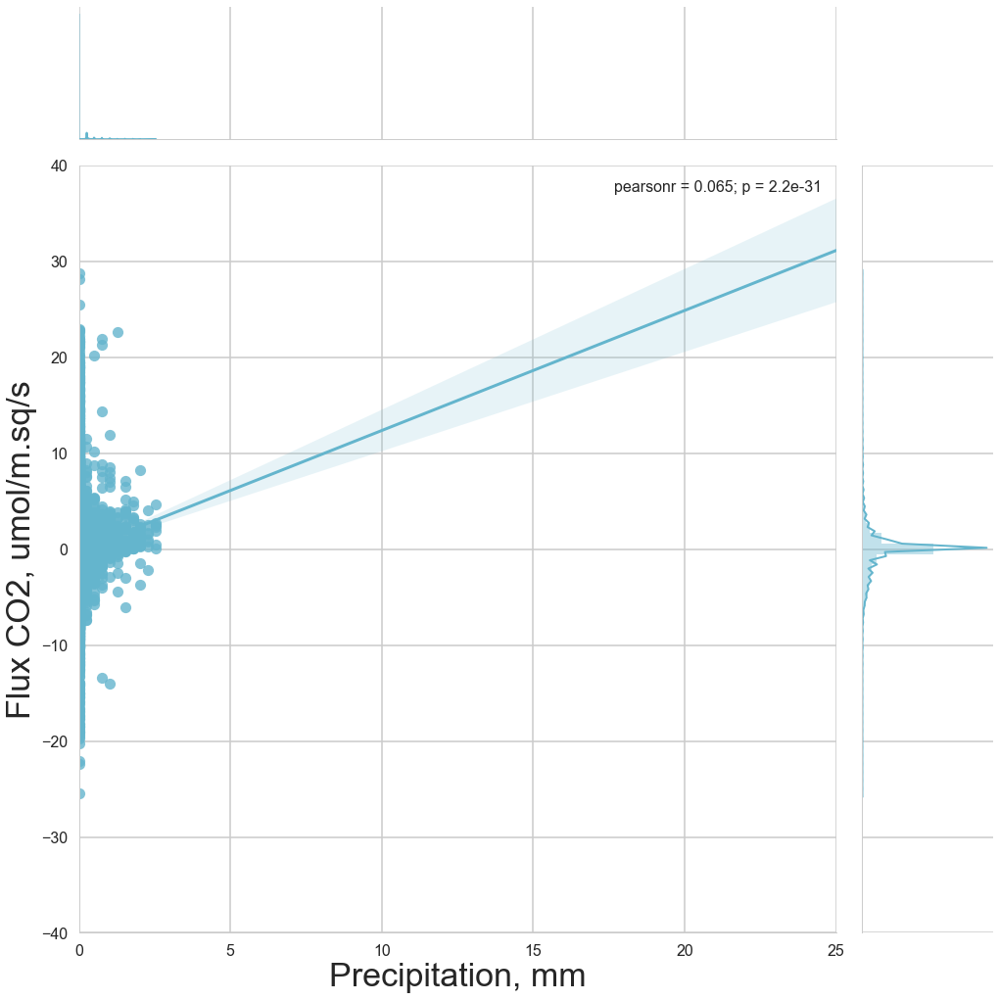

In [19]:
for s,c in zip(sites, sns.color_palette()):
#     plt.scatter(df[df['site']==s]['P'],df[df['site']==s]['FC'], label=s, color=c)
    g = sns.jointplot(df[df['site']==s]['P'],df[df['site']==s]['FC'], label=s, color=c, size=15, kind='reg',dropna=1, xlim=(0,25), ylim=(-40,40))
    g.set_axis_labels('Precipitation, mm', 'Flux CO2, umol/m.sq/s');
    if save_fig:
        plt.savefig('img/FvsP/{}.png'.format(s), dpi=150)
    plt.show()

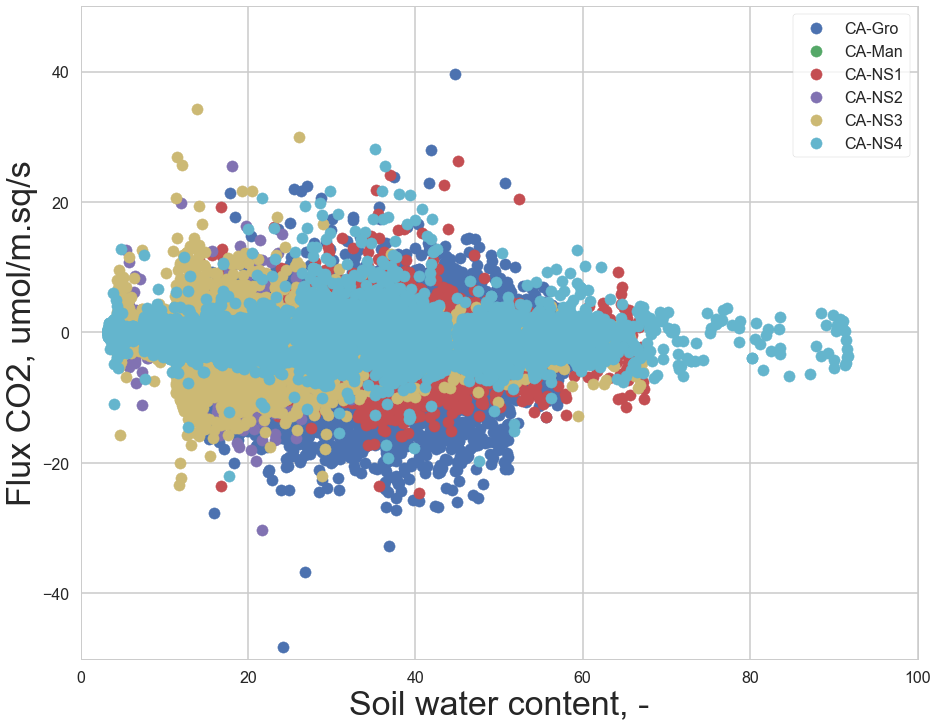

In [20]:
for s,c in zip(sites, sns.color_palette()):
    plt.scatter(df[df['site']==s]['SWC_1'],df[df['site']==s]['FC'], label=s, color=c)
plt.xlabel('Soil water content, -')
plt.ylabel('Flux CO2, umol/m.sq/s')
plt.xlim([0,100])
plt.ylim([-50,50])
plt.legend(frameon=1)
if save_fig:
    plt.savefig('img/FvsSWC/all.png'.format(s), dpi=150)
plt.show()

/Users/MarkelovIgor/anaconda/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


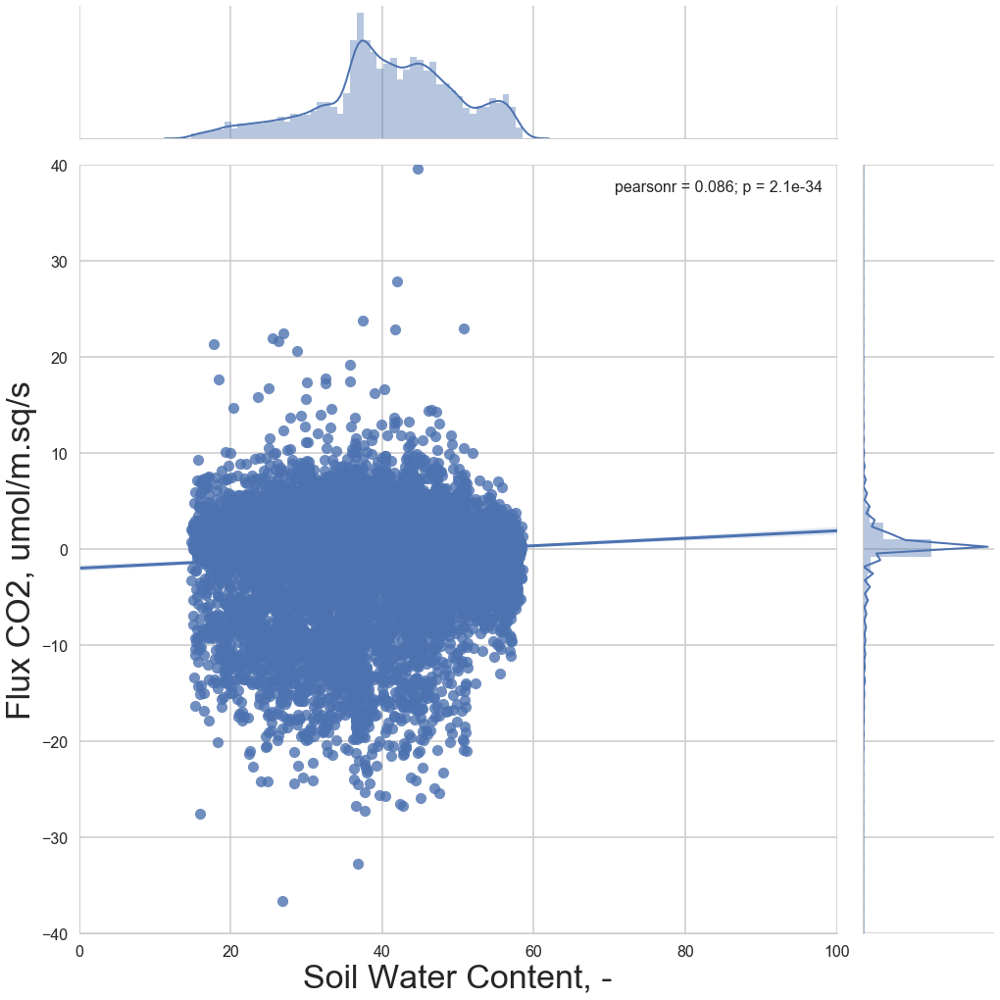

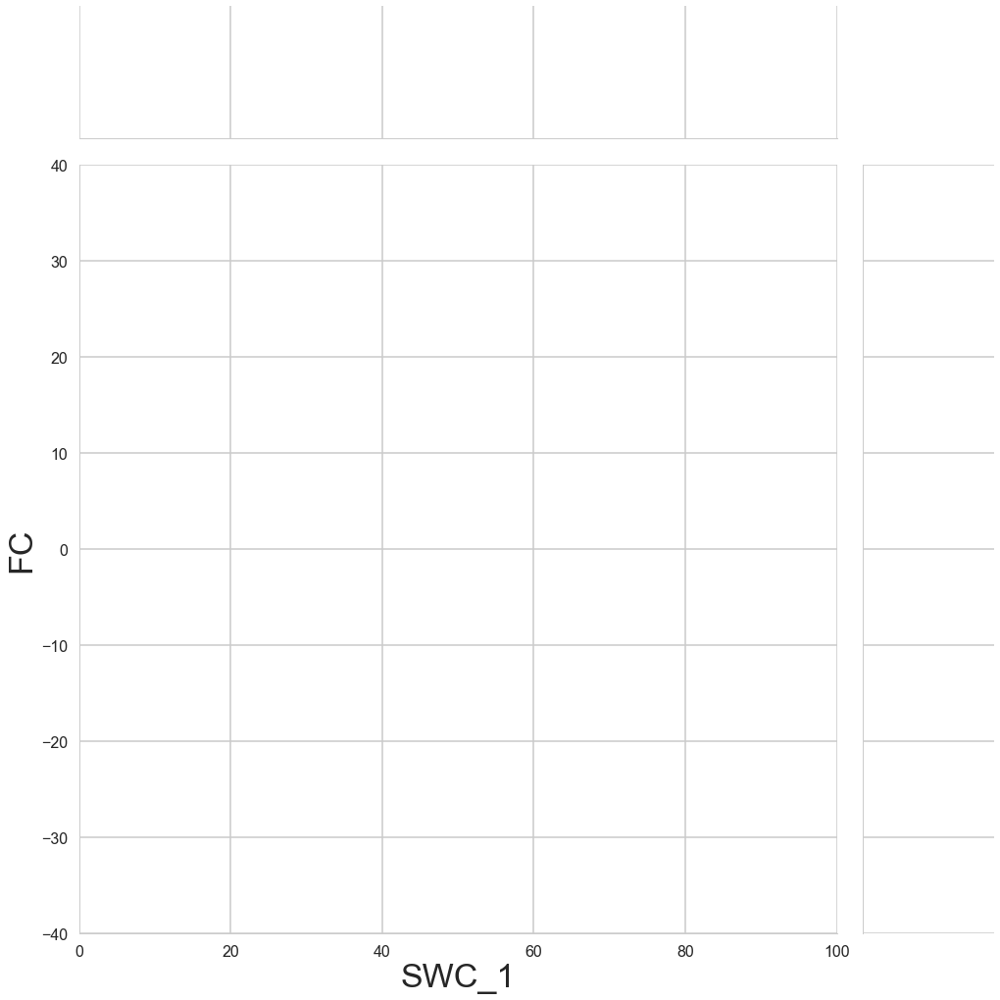

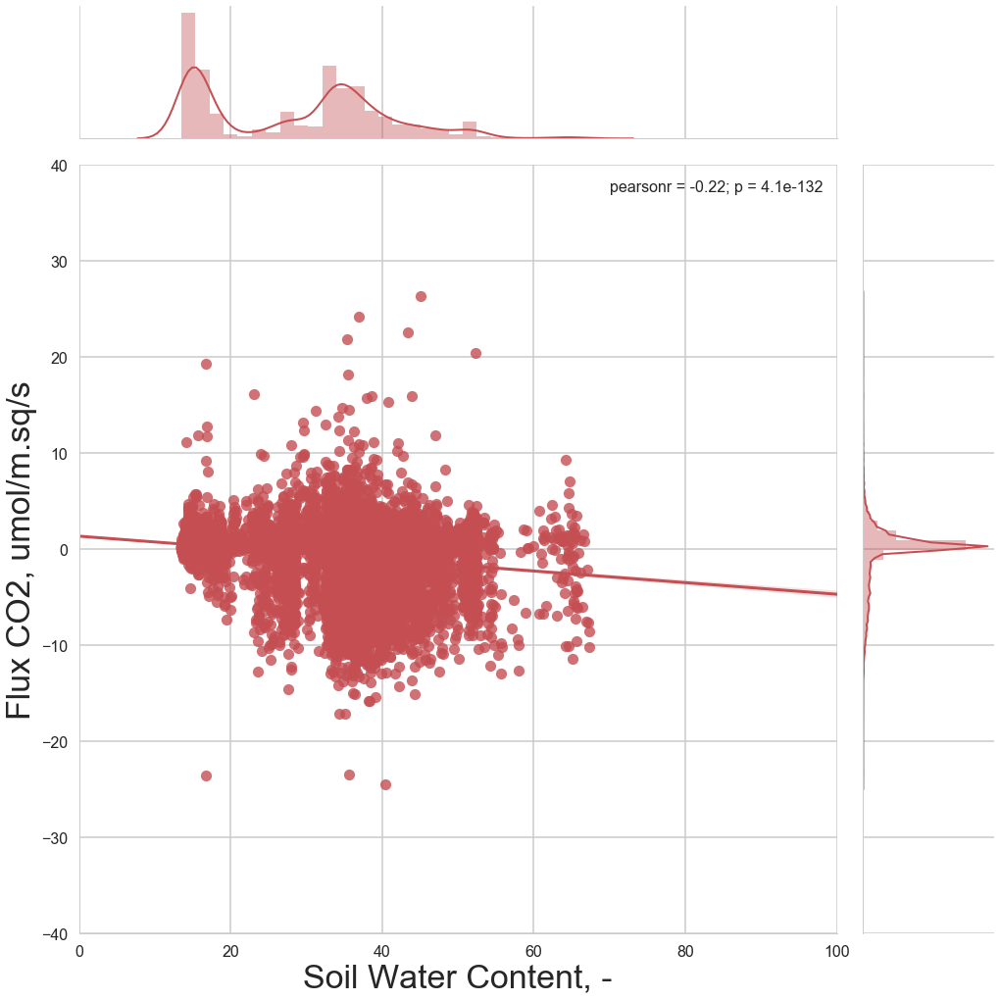

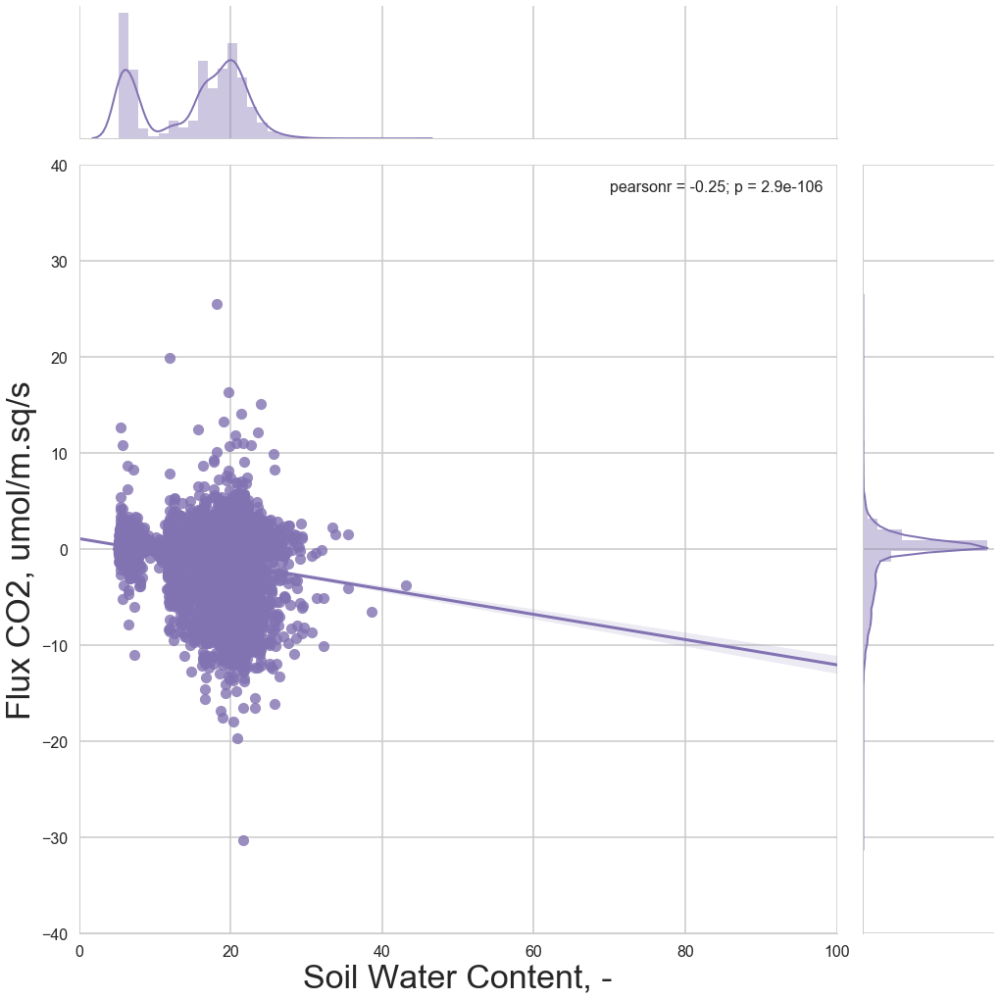

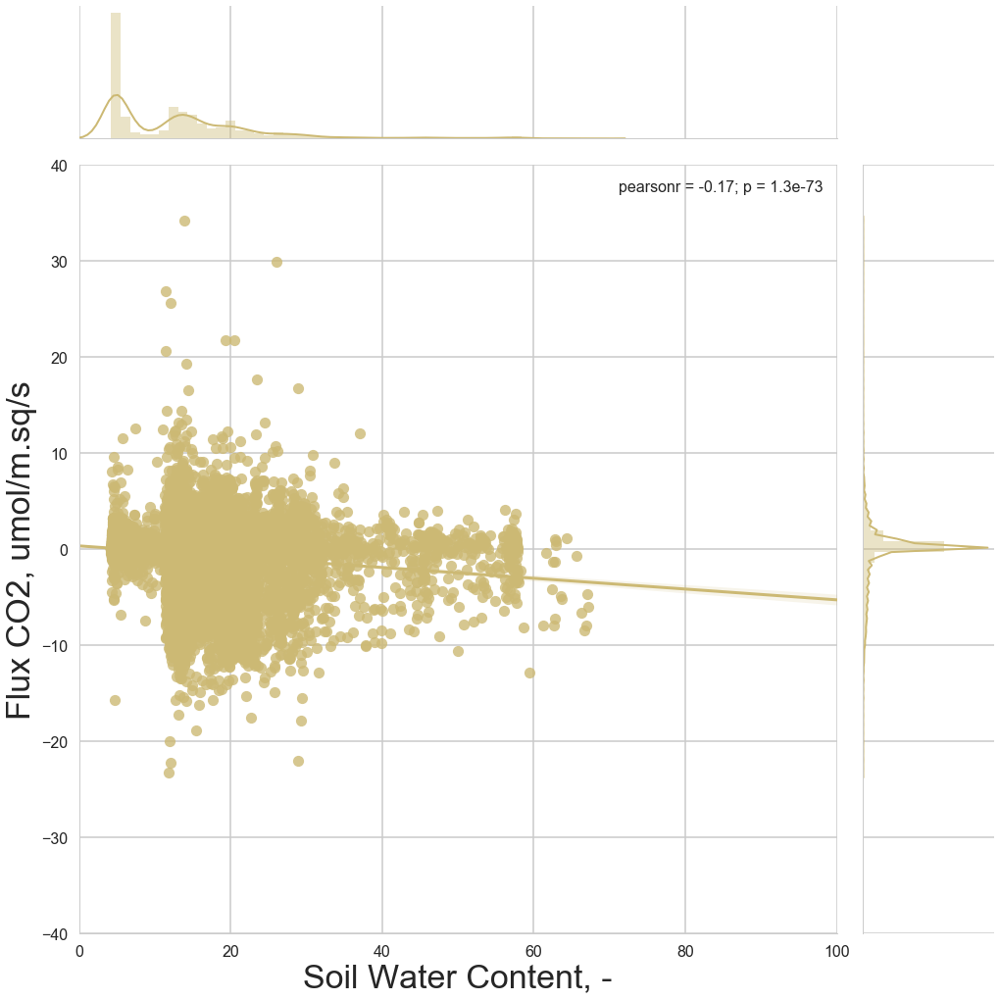

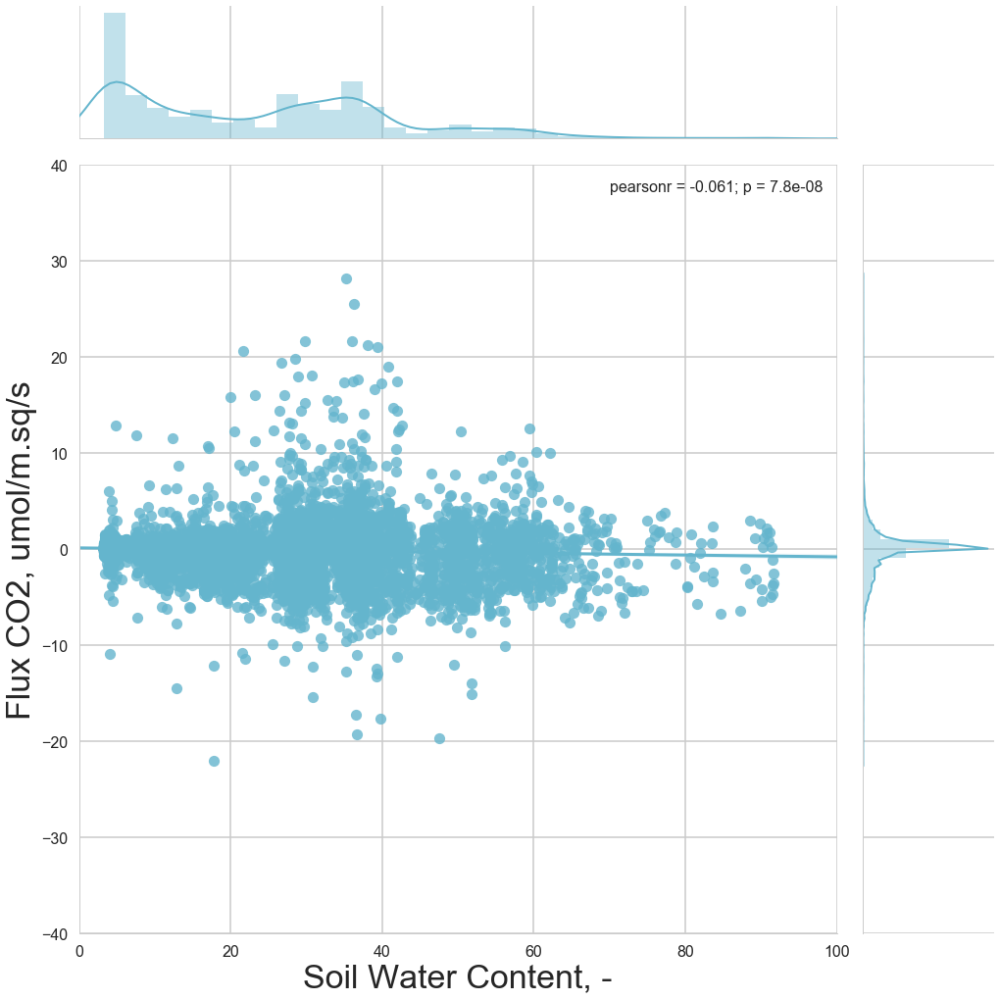

In [21]:
for s,c in zip(sites, sns.color_palette()):
#     plt.scatter(df[df['site']==s]['SWC_1'],df[df['site']==s]['FC'], label=s, color=c)
    try:
        g = sns.jointplot(df[df['site']==s]['SWC_1'],df[df['site']==s]['FC'], label=s, color=c, size=15, kind='reg',dropna=1, xlim=(0,100), ylim=(-40,40))
    except:
        pass
    g.set_axis_labels('Soil Water Content, -', 'Flux CO2, umol/m.sq/s');
    if save_fig:
        plt.savefig('img/FvsSWC/{}.png'.format(s), dpi=150)
    plt.show()

In [22]:
df["dayofyear"] = df.index.map(lambda x: x.dayofyear)

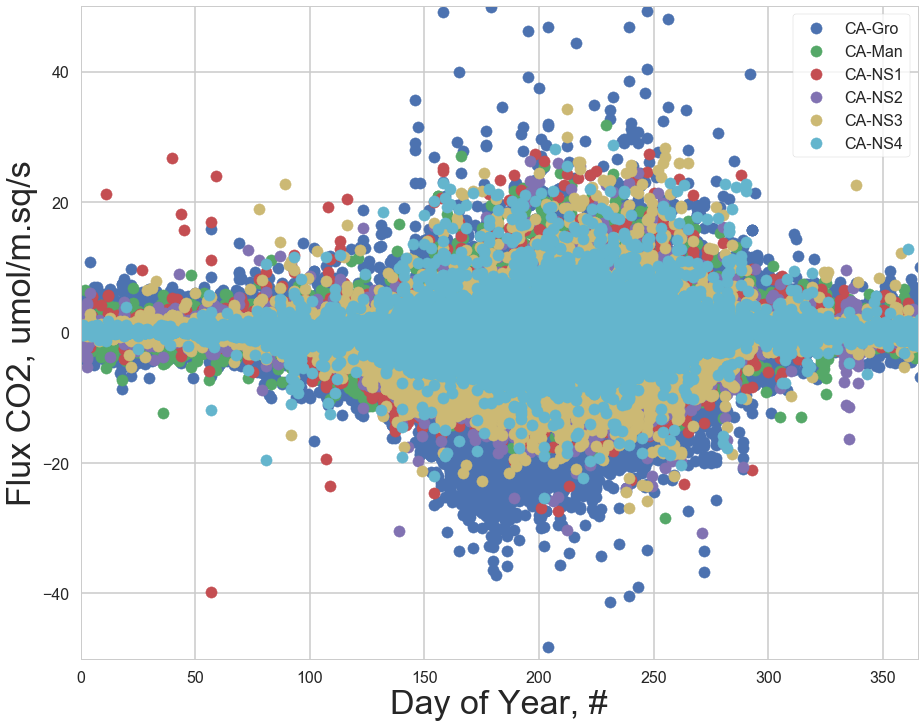

In [23]:
for s,c in zip(sites, sns.color_palette()):
    plt.scatter(df[df['site']==s]['dayofyear'],df[df['site']==s]['FC'], label=s, color=c)
plt.xlabel('Day of Year, #')
plt.ylabel('Flux CO2, umol/m.sq/s')
plt.xlim([0,365])
plt.ylim([-50,50])
plt.legend(frameon=1)
if save_fig:
    plt.savefig('img/FvsY/all.png'.format(s), dpi=150)
plt.show()

(731758.0, 731759.0)

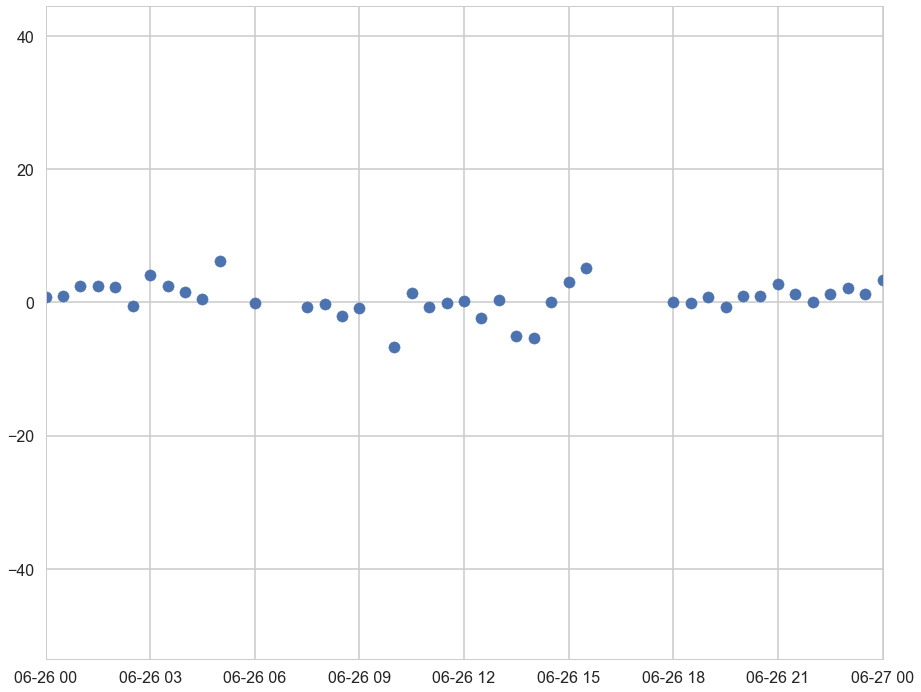

In [24]:
import datetime
plt.scatter(df[df['site']=='US-FPe'].index.to_pydatetime(), df[df['site']=='US-FPe']['FC'].values)
plt.xlim([datetime.date(2004, 6, 26), datetime.date(2004, 6, 27)])

/Users/MarkelovIgor/anaconda/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


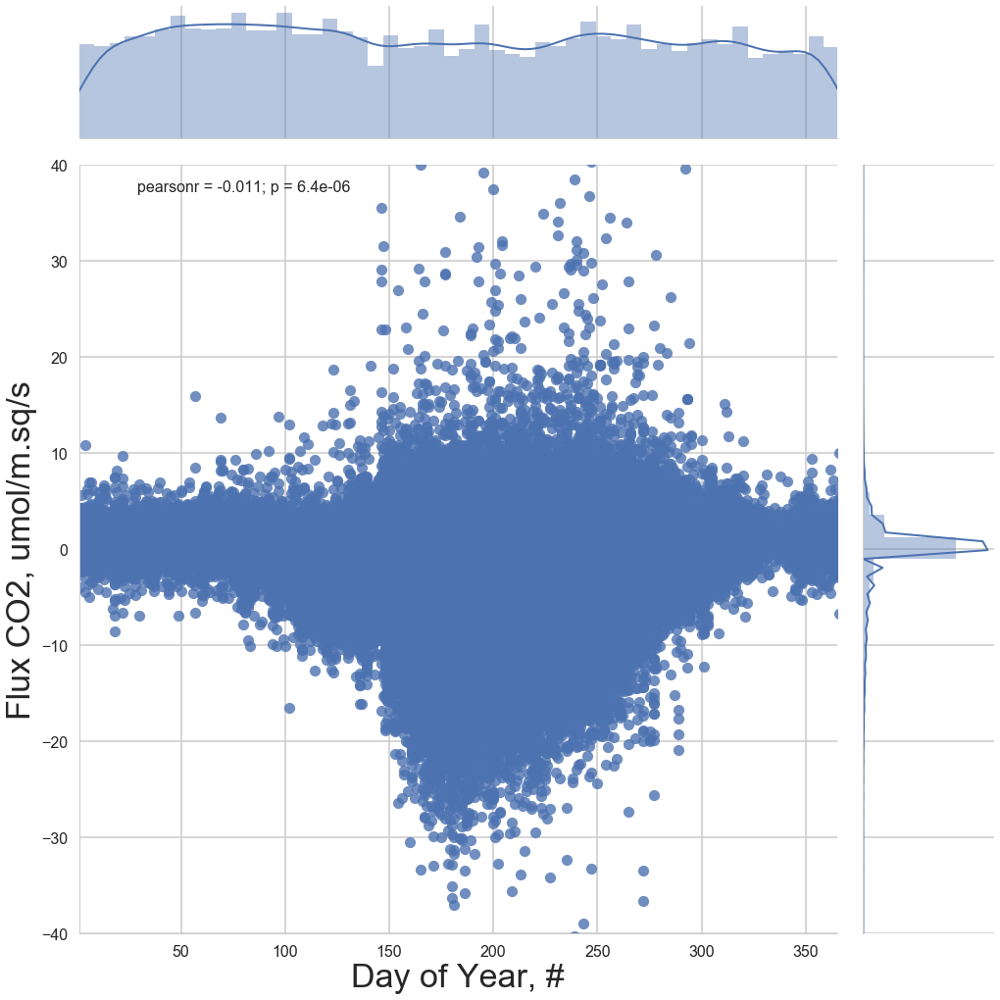

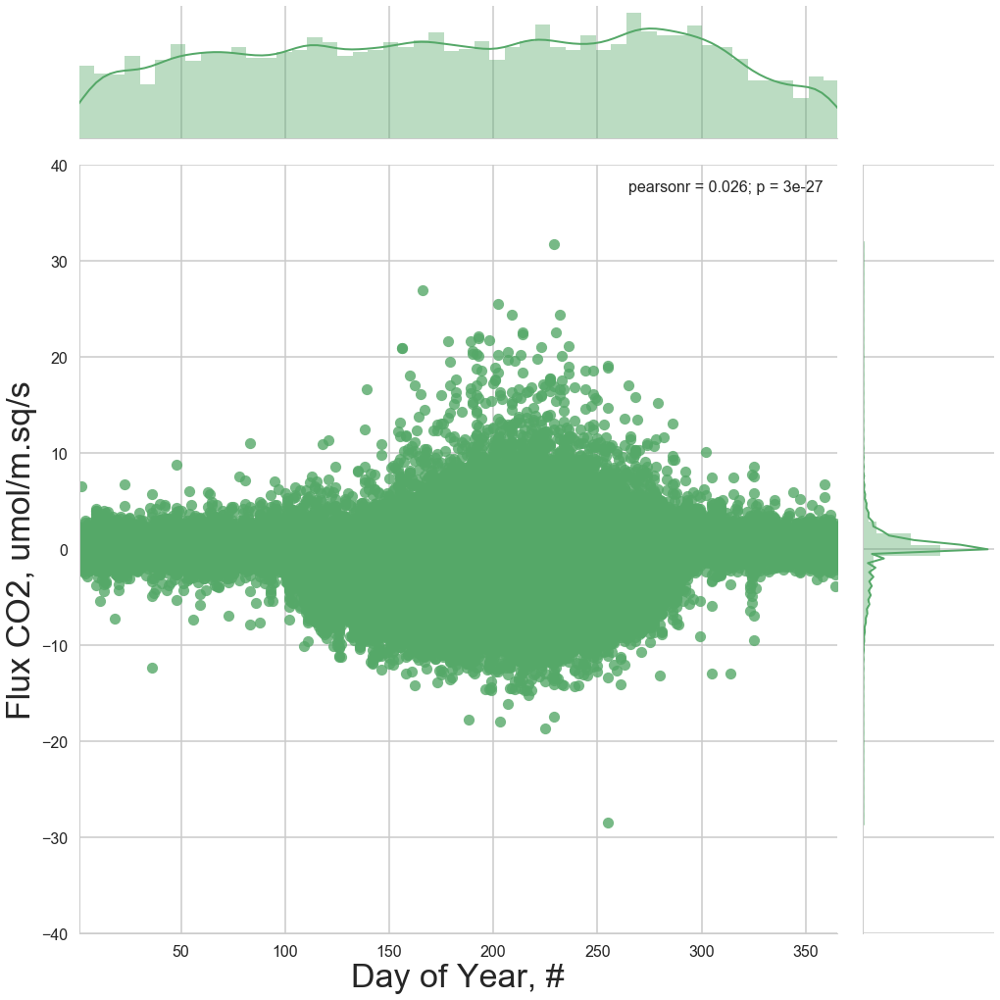

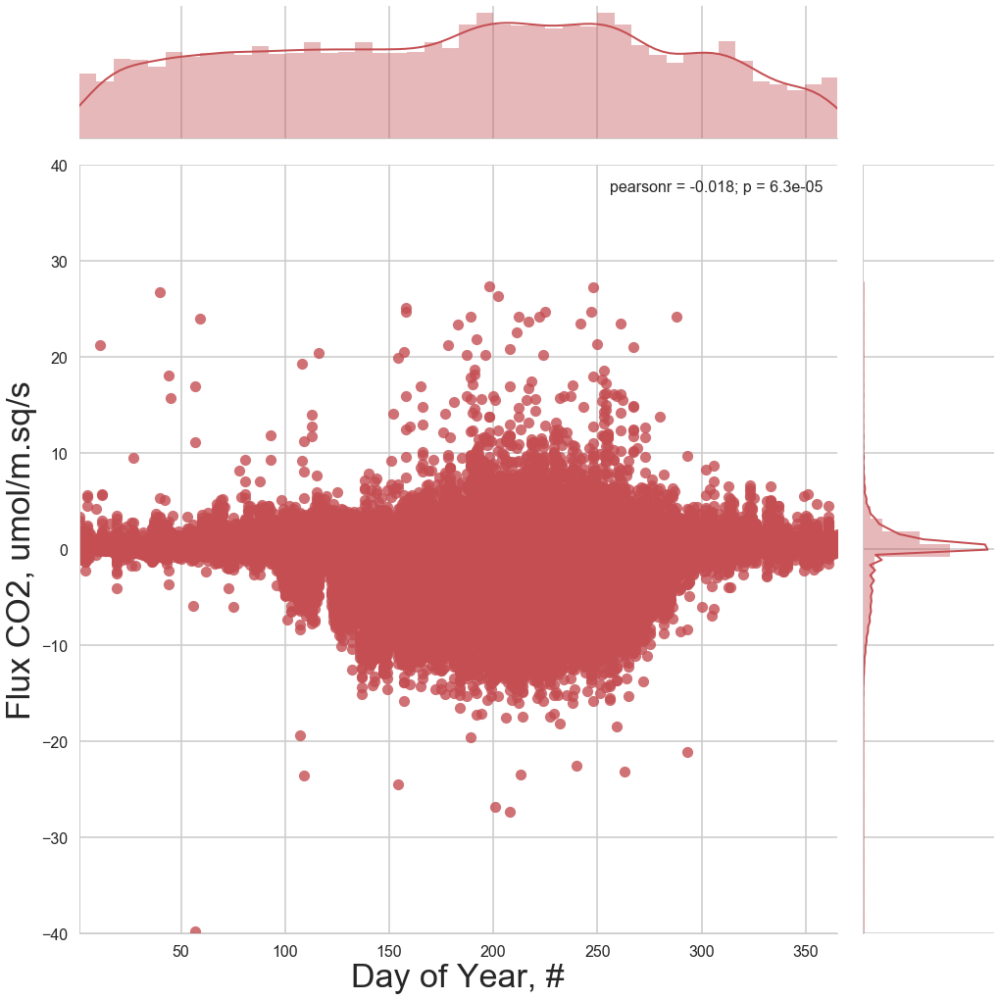

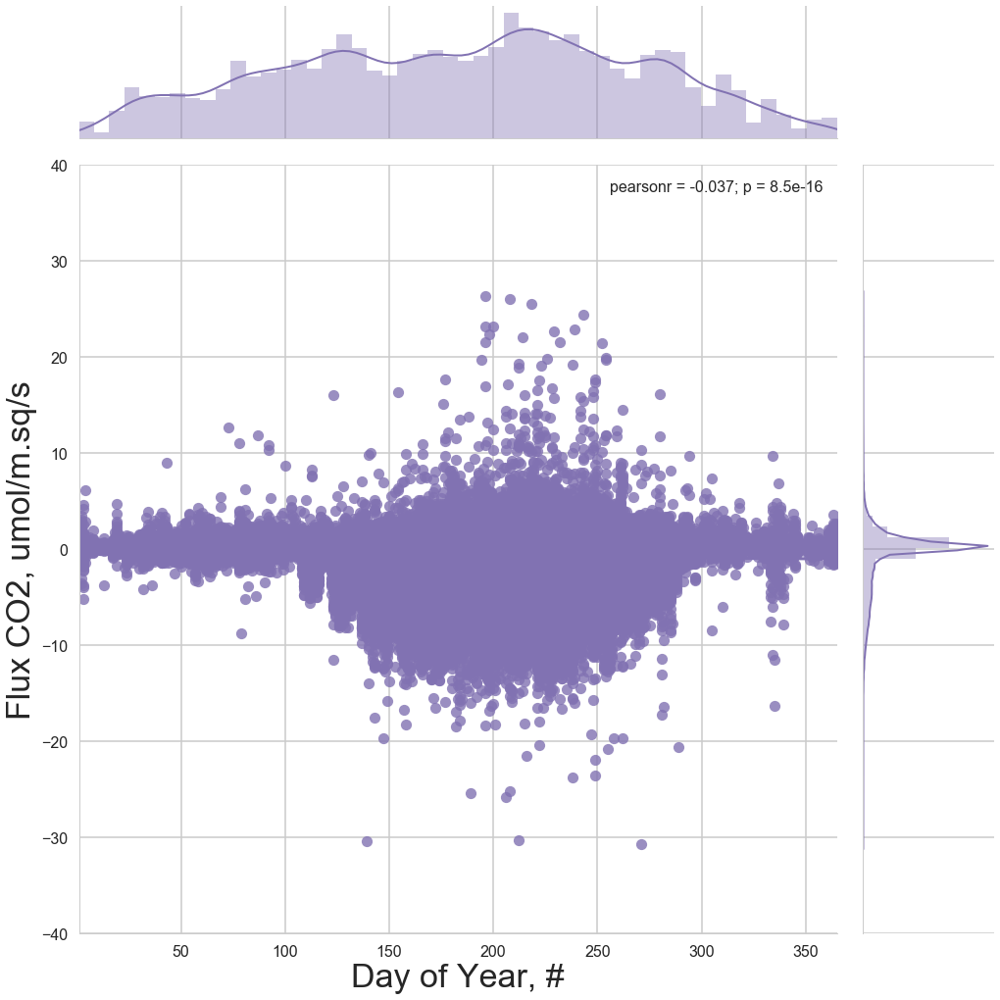

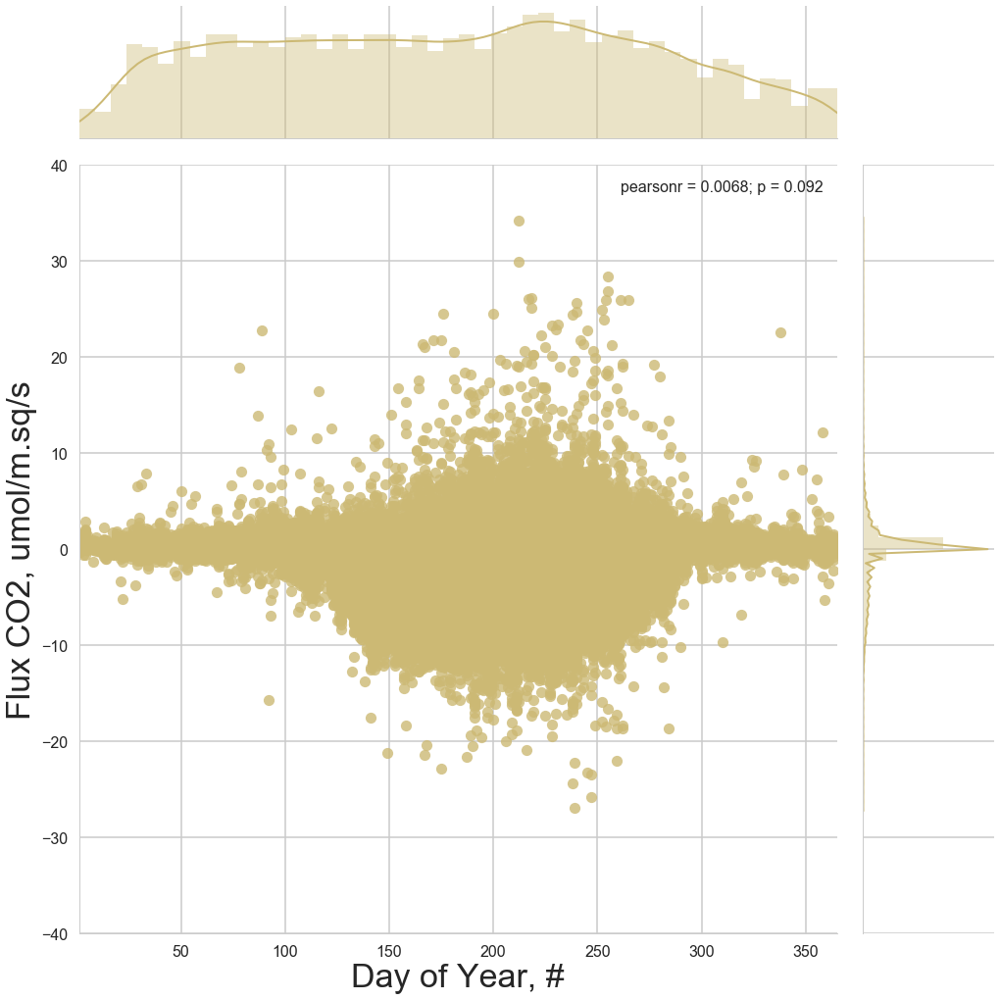

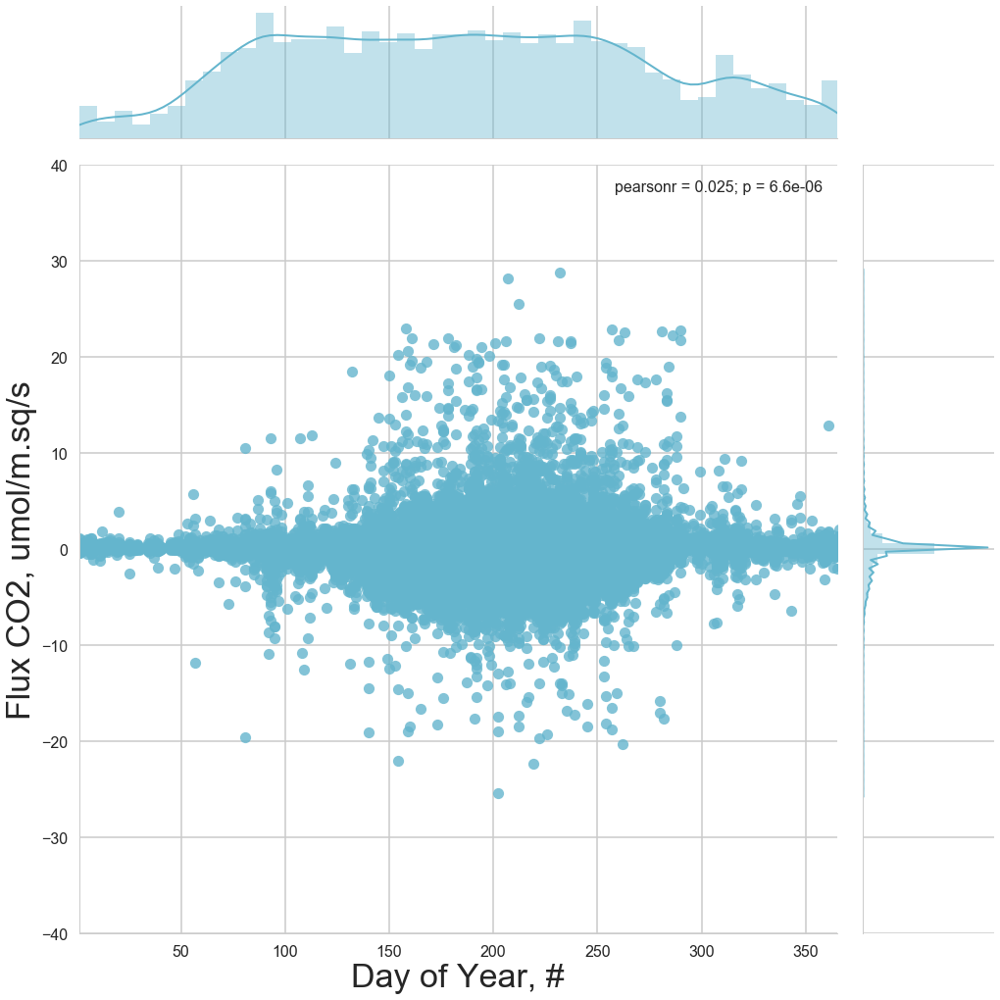

In [25]:
for s,c in zip(sites, sns.color_palette()):
#     plt.scatter(df[df['site']==s]['SWC_1'],df[df['site']==s]['FC'], label=s, color=c)
    g = sns.jointplot(df[df['site']==s]['dayofyear'],df[df['site']==s]['FC'], label=s, color=c, size=15, kind='reg',dropna=1, xlim=(1,365), ylim=(-40,40))
    g.set_axis_labels('Day of Year, #', 'Flux CO2, umol/m.sq/s');
    if save_fig:
        plt.savefig('img/FvsY/{}.png'.format(s), dpi=150)
    plt.show()

In [26]:
df['week_n'] = df.index.to_series().dt.week

/Users/MarkelovIgor/anaconda/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


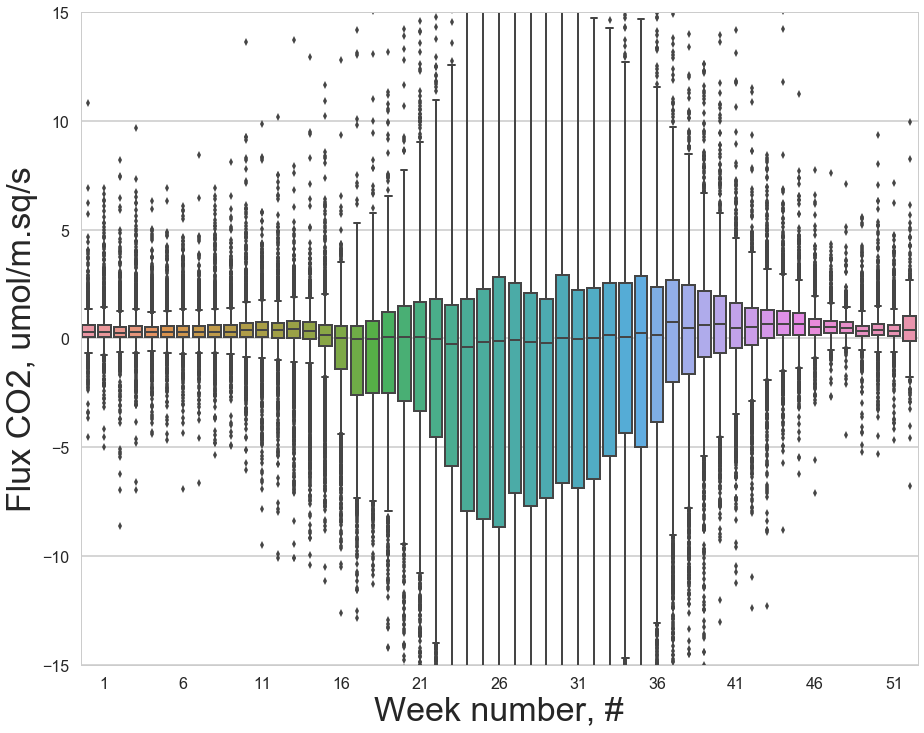

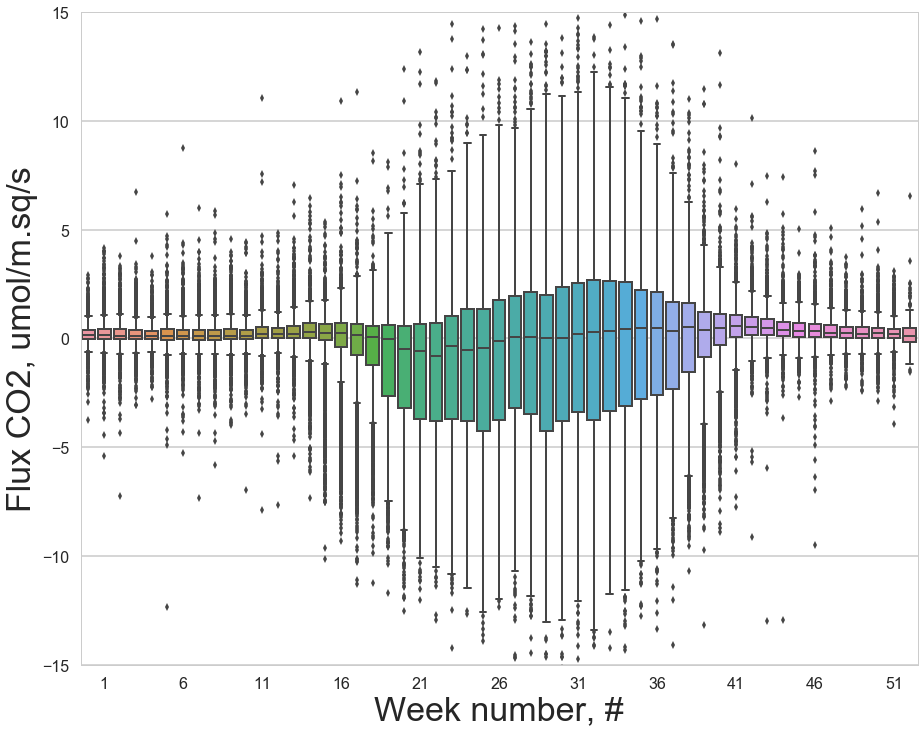

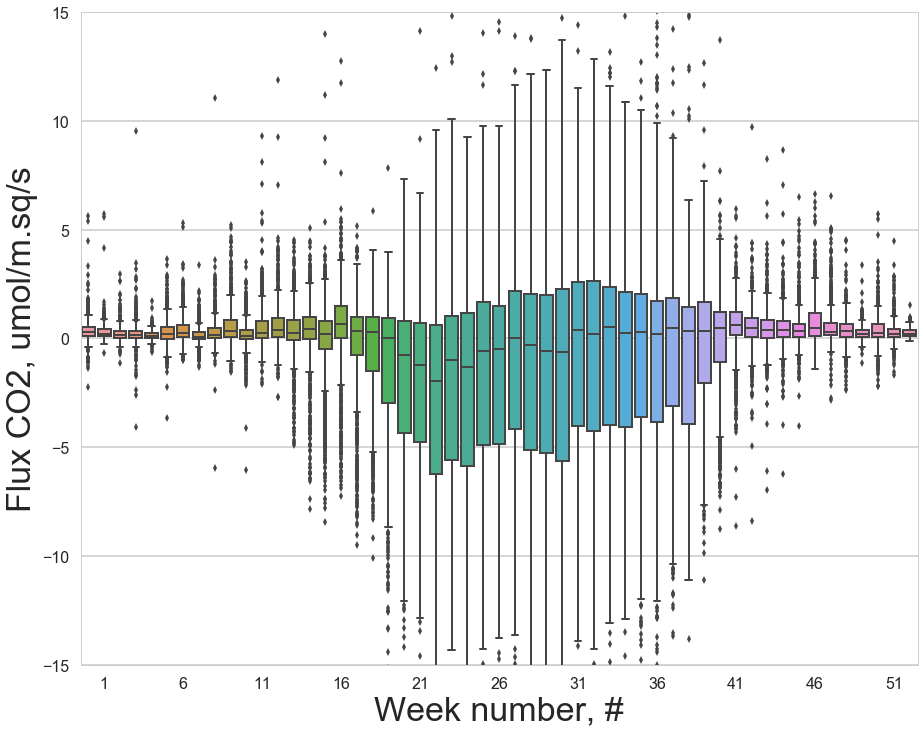

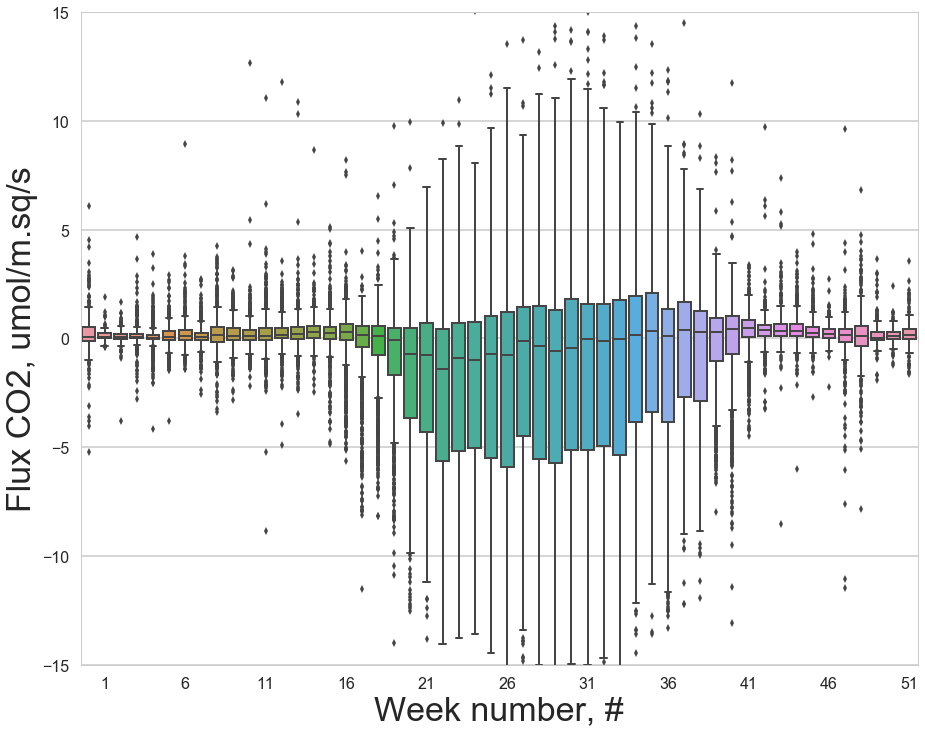

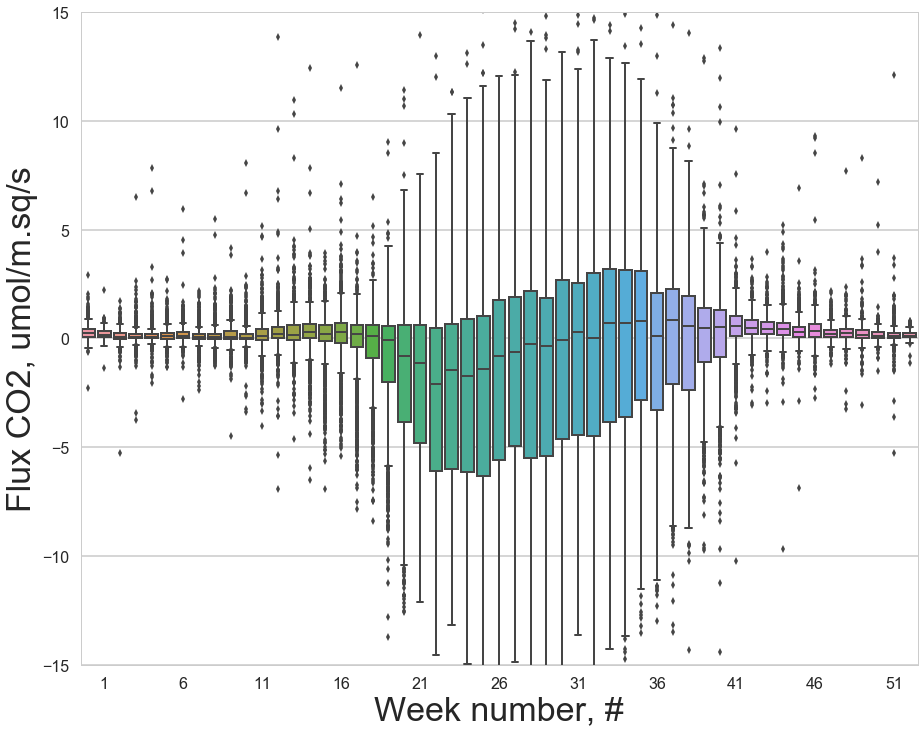

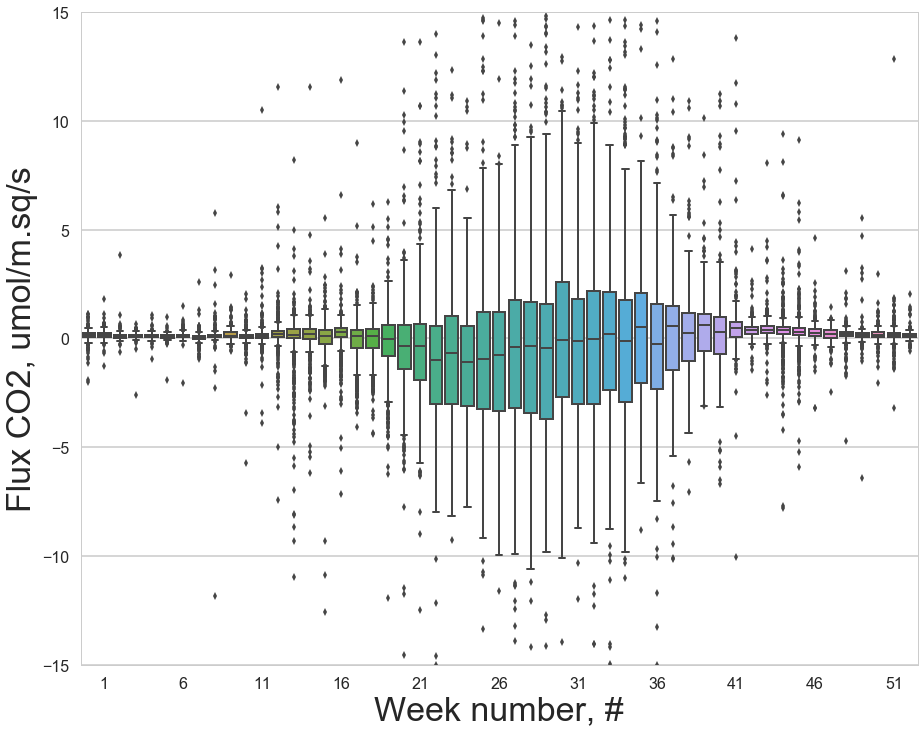

In [27]:
for s,c in zip(sites, sns.color_palette()):
#     plt.scatter(df[df['site']==s]['SWC_1'],df[df['site']==s]['FC'], label=s, color=c)
    g = sns.boxplot(df[df['site']==s]['week_n'],df[df['site']==s]['FC'])
    plt.ylim([-15,15])
    g.set_xticks(np.arange(1,53,5))
    g.set_xticklabels(np.arange(1,53,5))
    plt.ylabel('Flux CO2, umol/m.sq/s')
    plt.xlabel('Week number, #')
    plt.legend(frameon=1)
    if save_fig:
        plt.savefig('img/FvsW/{}.png'.format(s), dpi=150)
    plt.show()

In [28]:
import ephem

def sunrise_and_sunset(lat, lon, d):
    fred      = ephem.Observer()
    d = pd.to_datetime(d)
    fred.date = d.strftime('%Y/%-m/%-d %H:%M:%S')
    fred.lon  = str(lon) #Note that lon should be in string format
    fred.lat  = str(lat)      #Note that lat should be in string format
    sunrise=fred.previous_rising(ephem.Sun()) #Sunrise
    sunset =fred.next_setting   (ephem.Sun()) #Sunset
    return ephem.localtime(sunrise).time(), ephem.localtime(sunset).time()

sunrise_and_sunset = np.vectorize(sunrise_and_sunset)

In [29]:
df['sunrise'], df['sunset'] = sunrise_and_sunset(df['LOCATION_LAT'], df['LOCATION_LONG'], df.index) # 5min

In [30]:
df['day_light_bool'] = (df.index.time >= df['sunrise']) & (df.index.time <= df['sunset'])

In [31]:
df[['sunrise','sunset','day_light_bool']].tail()

,sunrise,sunset,day_light_bool
TIMESTAMP_START,,,
2010-12-31 15:30:00,10:16:51.000004,17:47:01.000004,True
2010-12-31 16:00:00,10:16:51.000004,17:47:01.000004,True
2010-12-31 16:30:00,10:16:51.000004,17:47:01.000004,True
2010-12-31 17:00:00,10:16:51.000004,17:47:01.000004,True
2010-12-31 17:30:00,10:16:51.000004,17:47:01.000004,True


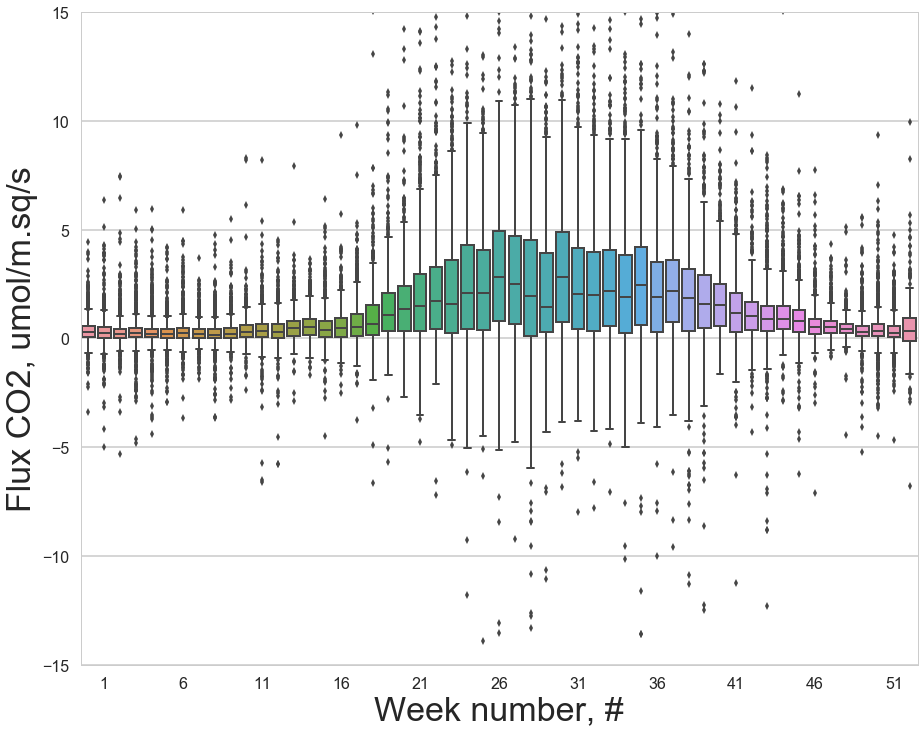

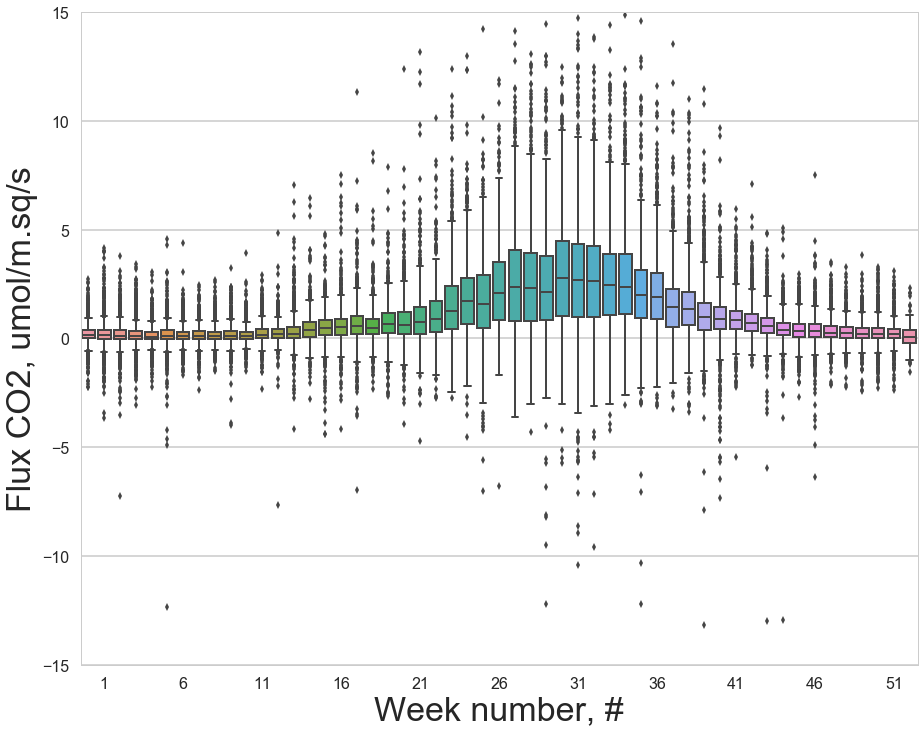

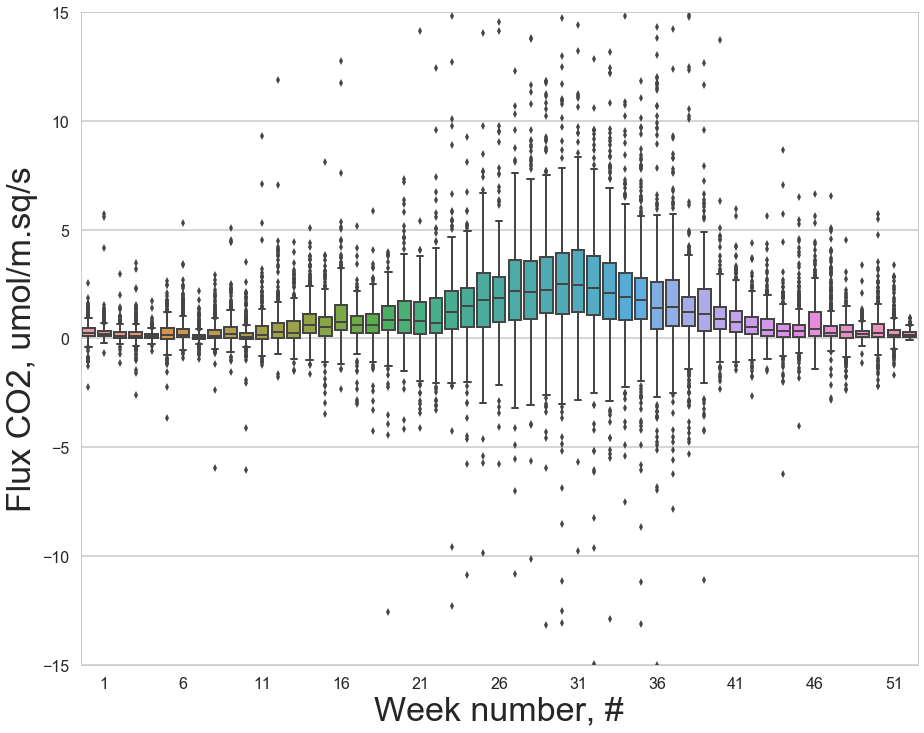

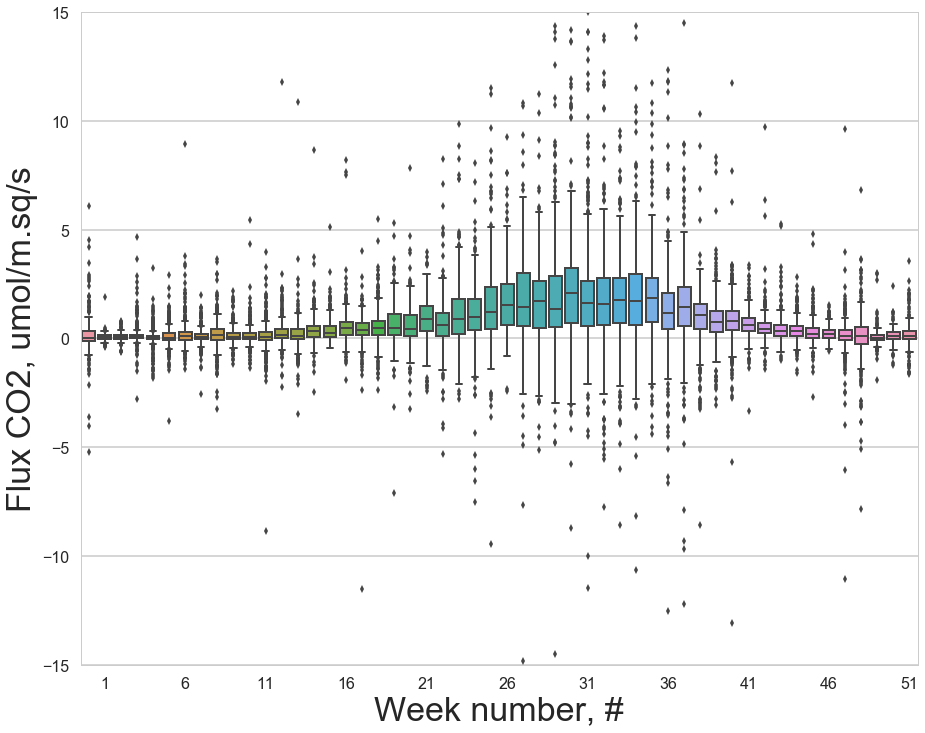

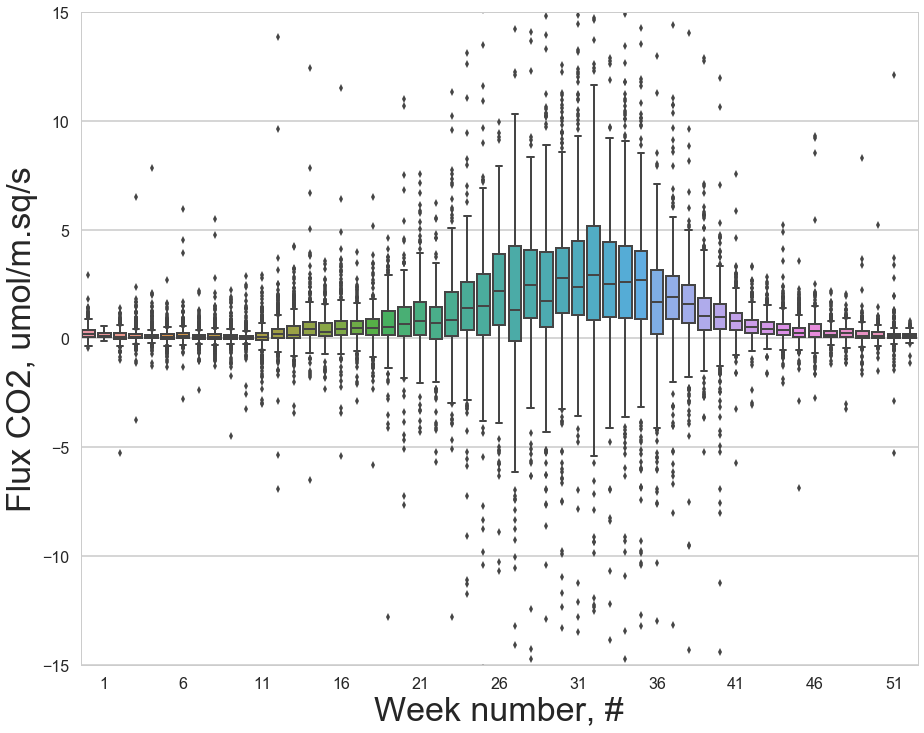

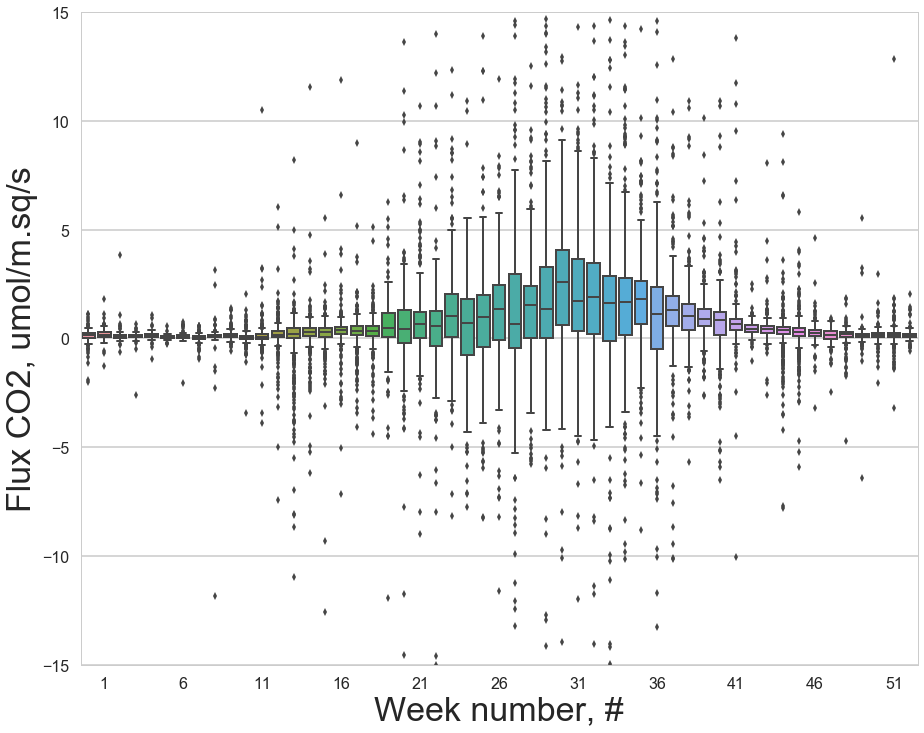

In [32]:
for s,c in zip(sites, sns.color_palette()):
#     plt.scatter(df[df['site']==s]['SWC_1'],df[df['site']==s]['FC'], label=s, color=c)
#     sns.boxplot(df[(df['site']==s) & (df['day_light_bool'])]['week_n'],df[df['site']==s]['FC'])
    g = sns.boxplot(df[(df['site']==s) & (df['day_light_bool']==False)]['week_n'],df[df['site']==s]['FC'])
    g.set_xticks(np.arange(1,53,5))
    g.set_xticklabels(np.arange(1,53,5))
    plt.ylim([-15,15])
    plt.ylabel('Flux CO2, umol/m.sq/s')
    plt.xlabel('Week number, #')
    plt.show()

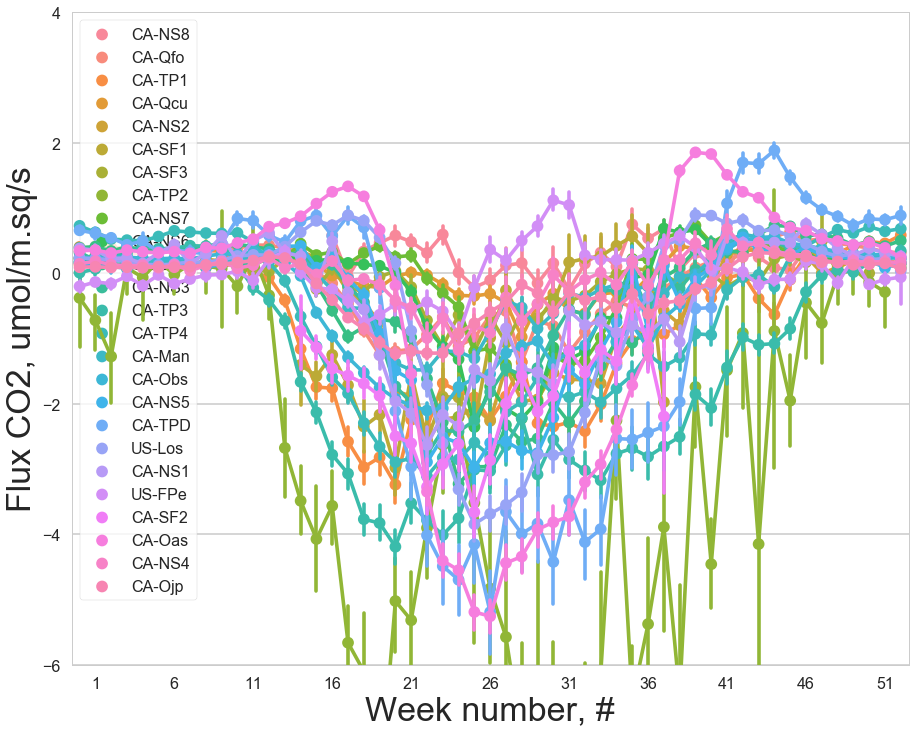

In [33]:
# for s,c in zip(sites, sns.color_palette()):
#     plt.scatter(df[df['site']==s]['SWC_1'],df[df['site']==s]['FC'], label=s, color=c)
g = sns.pointplot(x='week_n', y='FC', data=df, hue='site')
g.set_xticks(np.arange(1,53,5))
g.set_xticklabels(np.arange(1,53,5))
plt.ylim([-6,4])
plt.legend(frameon=1)
plt.ylabel('Flux CO2, umol/m.sq/s')
plt.xlabel('Week number, #')

plt.legend(frameon=1)
if save_fig:
    plt.savefig('img/FvsW-mean/all.png'.format(s), dpi=150)


plt.show()

In [34]:
from pvlib import clearsky, atmosphere
from pvlib.location import Location

def solar_rad(lat, long, d):
    d = pd.to_datetime(d)
    tus = Location(lat, long)
    cs = tus.get_clearsky(d, model='haurwitz')
    return cs

solar_rad = np.vectorize(solar_rad) 

In [35]:
# year/month/day optionally followed by hours:minutes:seconds
#df.index[-1]

In [36]:
#sunrise_and_sunset(df['LOCATION_LAT'][-1], df['LOCATION_LONG'][-1], df.index[-1])

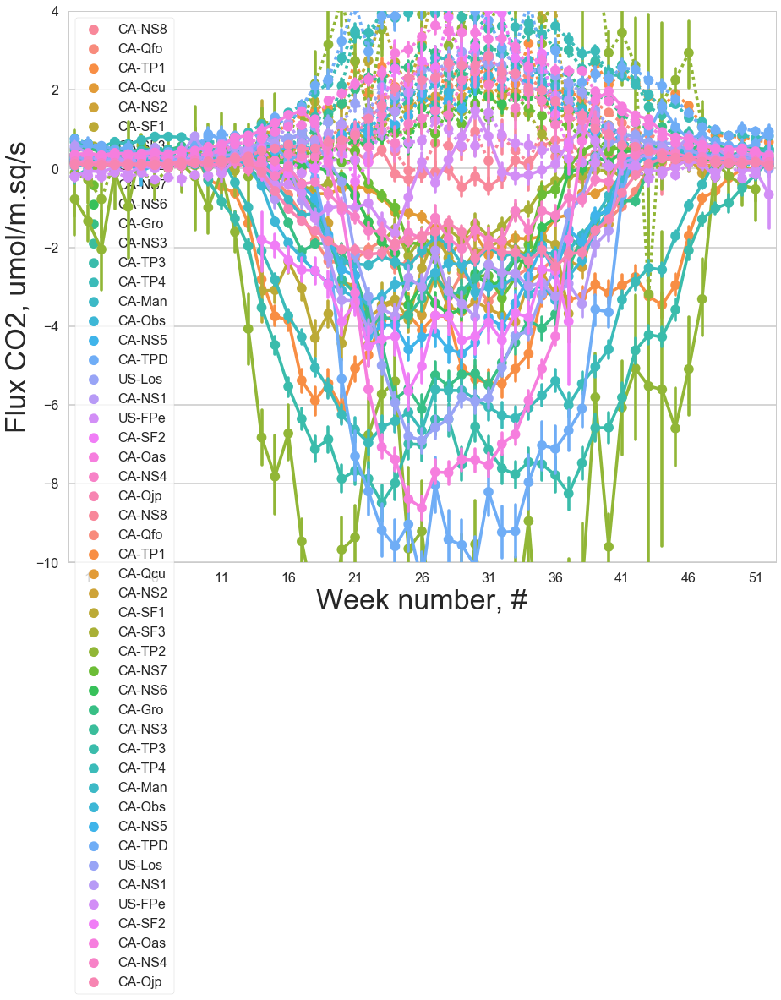

In [37]:
sns.pointplot(x='week_n', y='FC', data=df[df["day_light_bool"] == False], linestyles=[':' for _ in range(len(sites))], hue='site')
g = sns.pointplot(x='week_n', y='FC', data=df[df["day_light_bool"] == True], hue='site')
plt.ylim([-10,4])
plt.ylabel('Flux CO2, umol/m.sq/s')
plt.xlabel('Week number, #')
g.set_xticks(np.arange(1,53,5))
g.set_xticklabels(np.arange(1,53,5))
plt.legend(frameon=1)
if save_fig:
    plt.savefig('img/FvsW_day/all.png'.format(s), dpi=150)

plt.show()

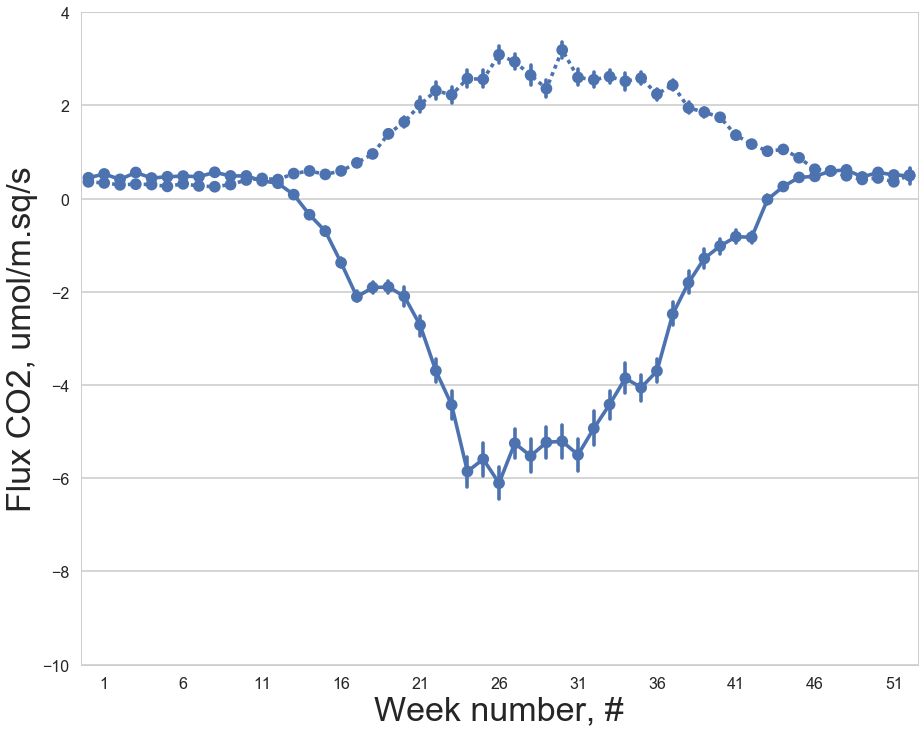

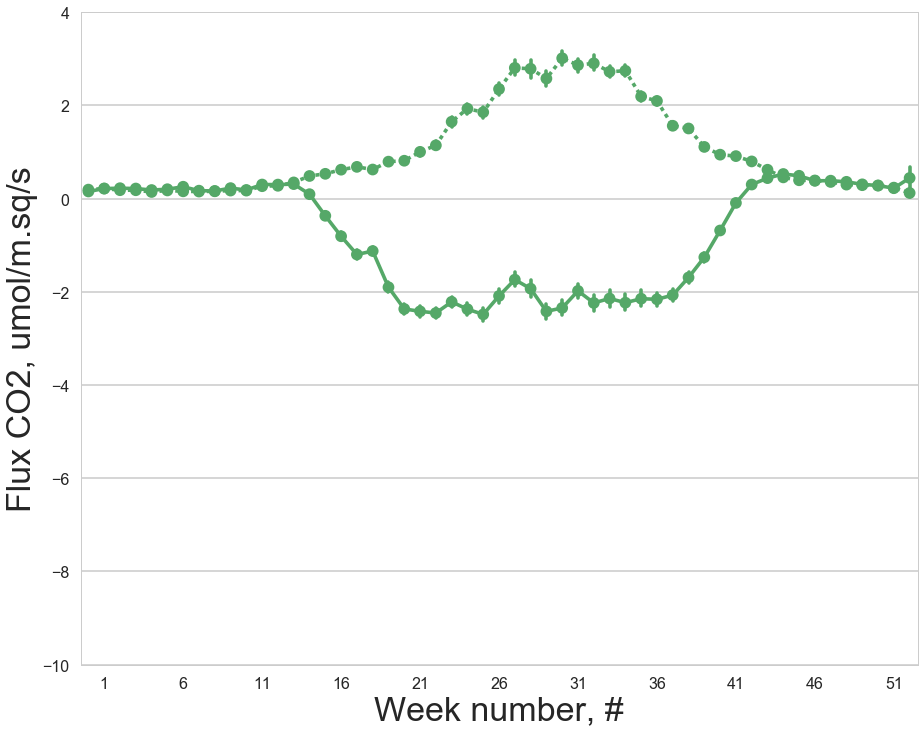

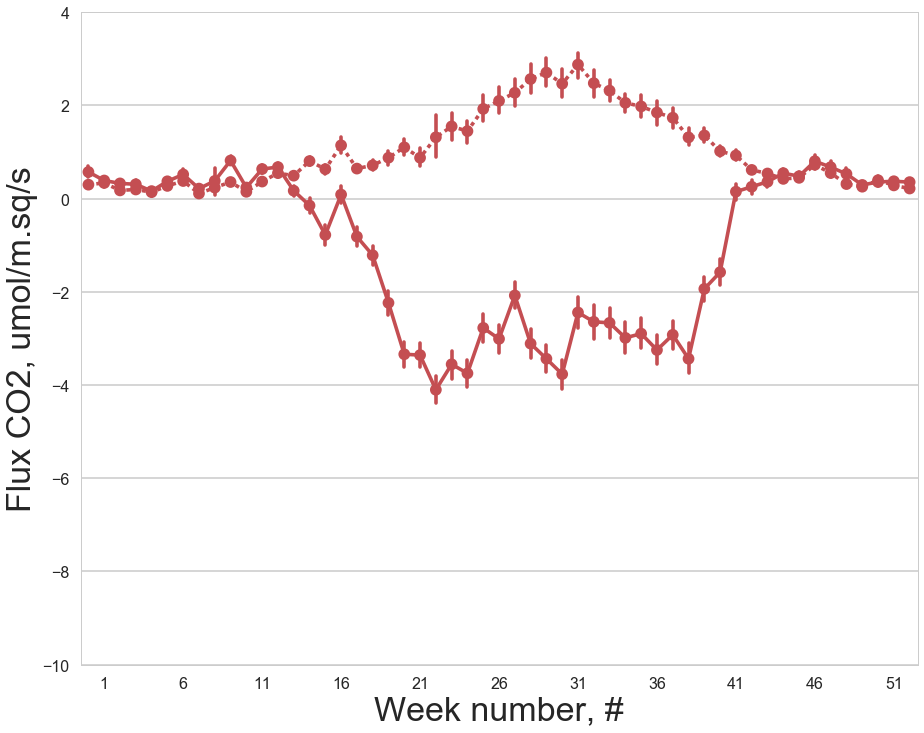

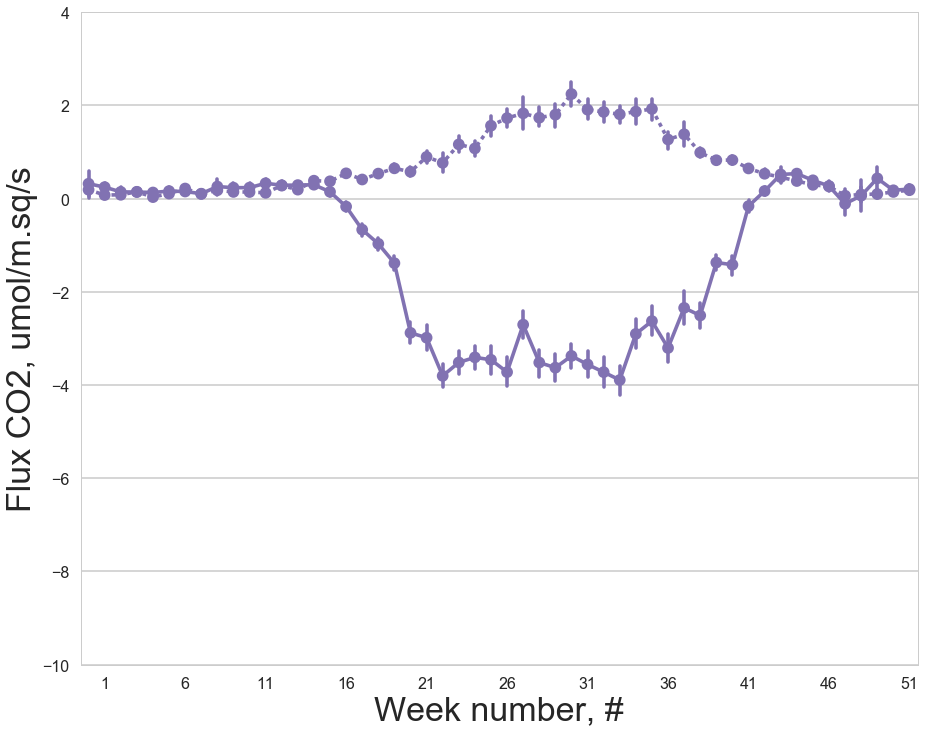

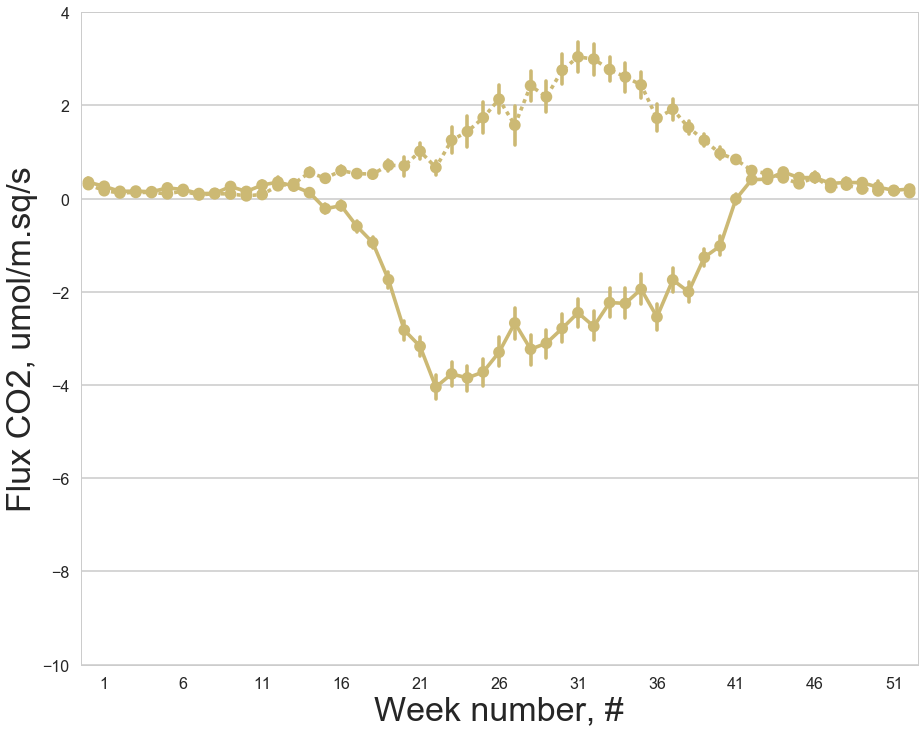

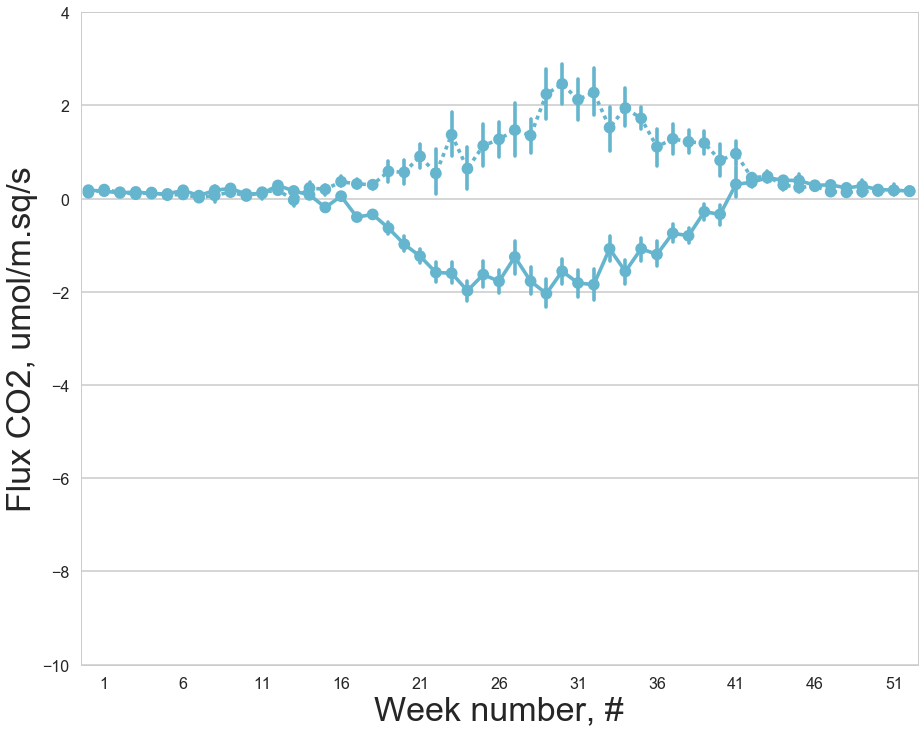

In [38]:
for s,c in zip(sites, sns.color_palette()):
    sns.pointplot(x='week_n', y='FC', data=df[(df["day_light_bool"] == False) & (df["site"]==s)], linestyles=[':'], label=s, color=c, size=15)
    g = sns.pointplot(x='week_n', y='FC', data=df[(df["day_light_bool"] == True) & (df["site"]==s)], color=c)
    g.set_xticks(np.arange(1,53,5))
    g.set_xticklabels(np.arange(1,53,5))
    plt.ylim([-10,4])
    plt.ylabel('Flux CO2, umol/m.sq/s')
    plt.xlabel('Week number, #')
    if save_fig:
        plt.savefig('img/FvsW_day/{}.png'.format(s), dpi=150)
    plt.show()



In [39]:
# sns.pointplot(x='index', y='FC', data=df[df["day_light_bool"] == True], hue='site')

In [40]:
# %timeit df['clear_sky_solar_rad'] = solar_rad(df['LOCATION_LAT'], df['LOCATION_LONG'], df.index)
# %timeit df['clear_sky_solar_rad'] = df.apply(lambda x: solar_rad(df['LOCATION_LAT'].values, df['LOCATION_LONG'].values, df['TIMESTAMP_START'].values), axis=1)

In [41]:
# sns.lmplot(x='index', y='FC',data=df, size=15, hue='day_light_bool')

In [42]:
import statsmodels.formula.api as sm
result = sm.ols(formula="FC ~ index", data=df[df['day_light_bool']]).fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     FC   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     7673.
Date:                Fri, 09 Jun 2017   Prob (F-statistic):               0.00
Time:                        18:14:40   Log-Likelihood:            -3.8860e+06
No. Observations:             1280179   AIC:                         7.772e+06
Df Residuals:                 1280177   BIC:                         7.772e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------
Intercept     -1.4484      0.008   -172.859      0.000        -1.465    -1.432
index      -5.792e-06   6.61e-08    -87.597      0.000     -5.92e-06 -5.66e-06
==============================================================================
Omnibus:                   427032.178   Durbin-Watson:                   0.334
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          2036861.772
Skew:                          -1.560   Prob(JB):                         0.00
Kurtosis:                       8.334   Cond. No.                     2.39e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.39e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [43]:
result = sm.ols(formula="FC ~ index", data=df[df['day_light_bool']==False]).fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     FC   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     4303.
Date:                Fri, 09 Jun 2017   Prob (F-statistic):               0.00
Time:                        18:14:40   Log-Likelihood:            -2.6026e+06
No. Observations:             1123303   AIC:                         5.205e+06
Df Residuals:                 1123301   BIC:                         5.205e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------
Intercept      0.8863      0.004    201.414      0.000         0.878     0.895
index       2.254e-06   3.44e-08     65.599      0.000      2.19e-06  2.32e-06
==============================================================================
Omnibus:                   511136.331   Durbin-Watson:                   1.005
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         93699287.120
Skew:                           1.093   Prob(JB):                         0.00
Kurtosis:                      47.690   Cond. No.                     2.43e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.43e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

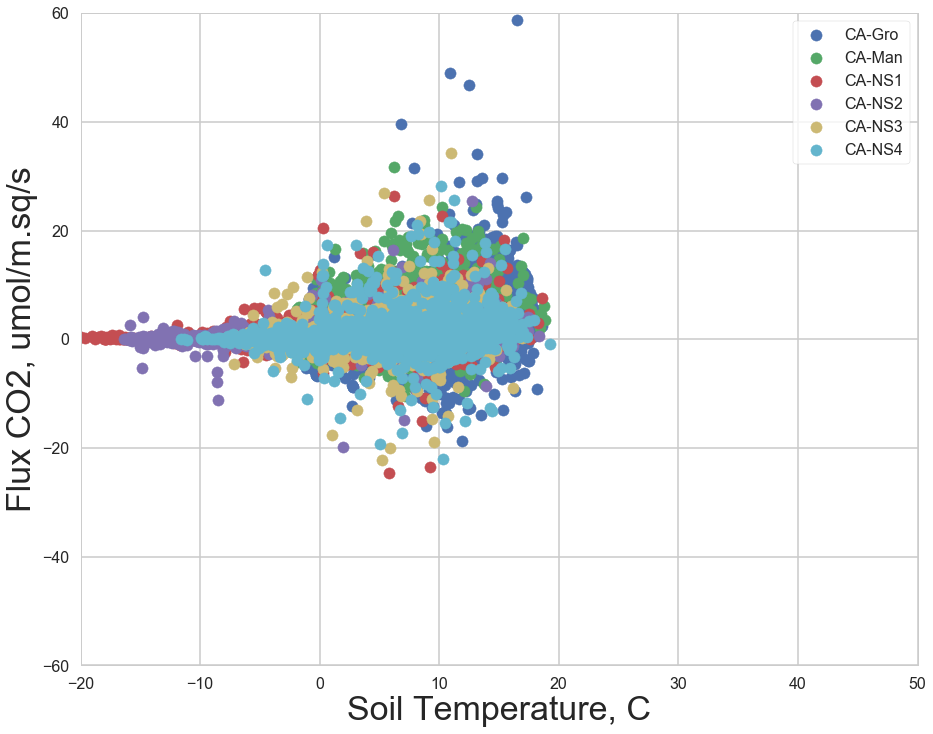

In [44]:
for s,c in zip(sites, sns.color_palette()):
    plt.scatter(df[(df["day_light_bool"] == False) & (df["site"]==s)]['TS_2'],df[(df["day_light_bool"] == False) & (df["site"]==s)]['FC'], label=s, color=c)
    plt.xlabel('Soil Temperature, C')
    plt.ylabel('Flux CO2, umol/m.sq/s')
    plt.xlim([-20,50])
    plt.ylim([-60,60])
plt.legend(frameon=1)
if save_fig:
    plt.savefig('img/FvsT_night/all.png', dpi=150)
plt.show()

/Users/MarkelovIgor/anaconda/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


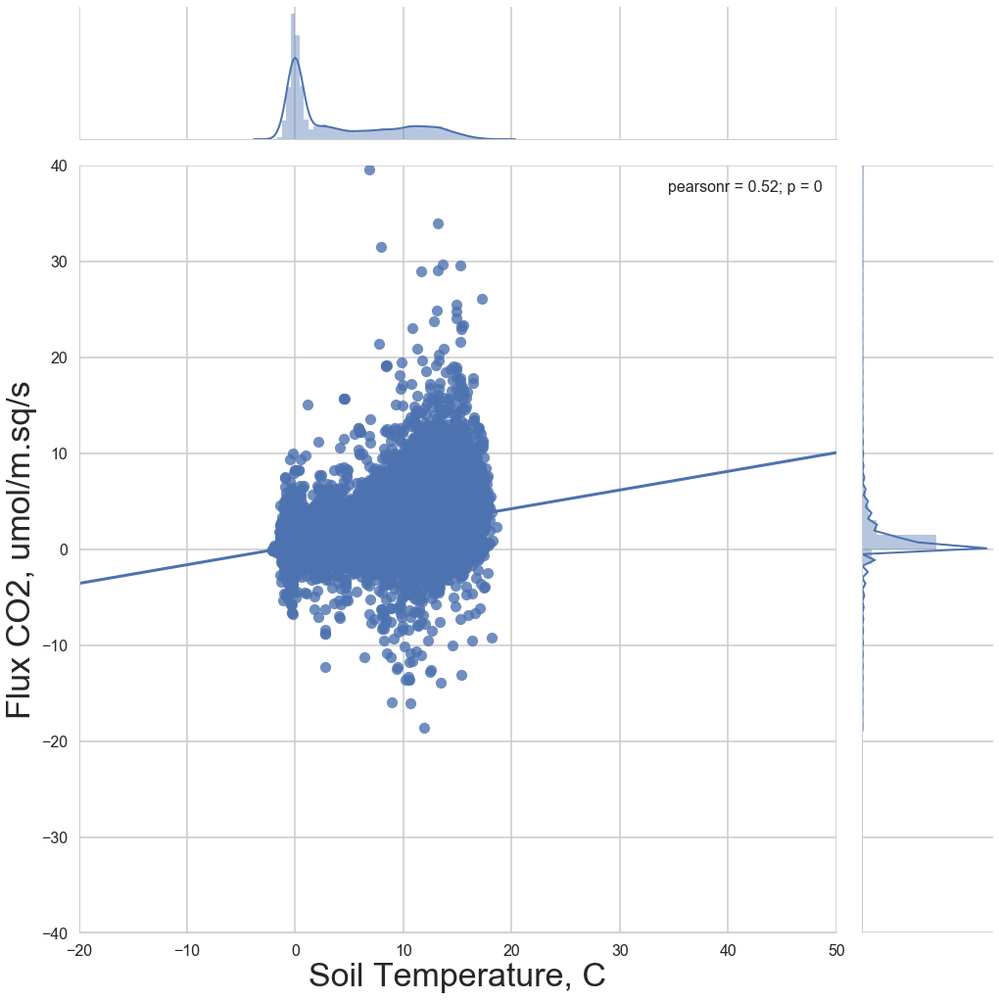

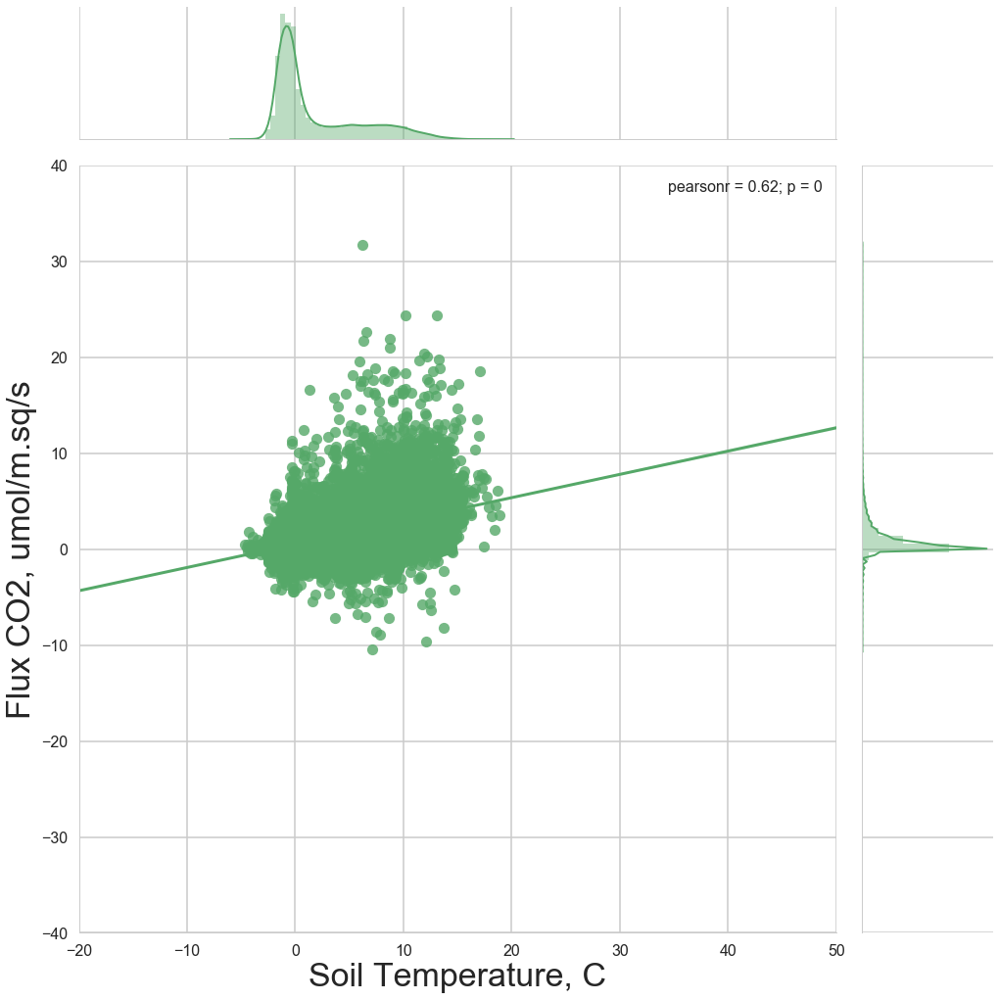

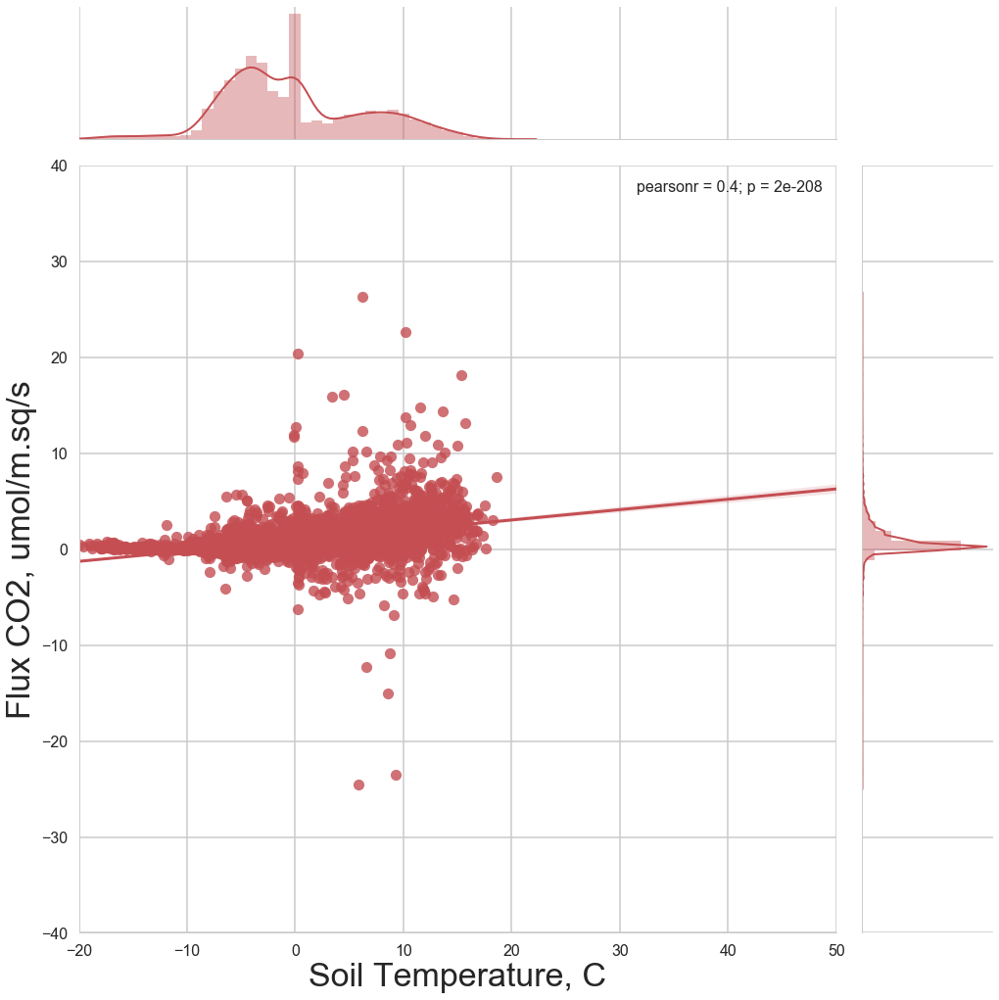

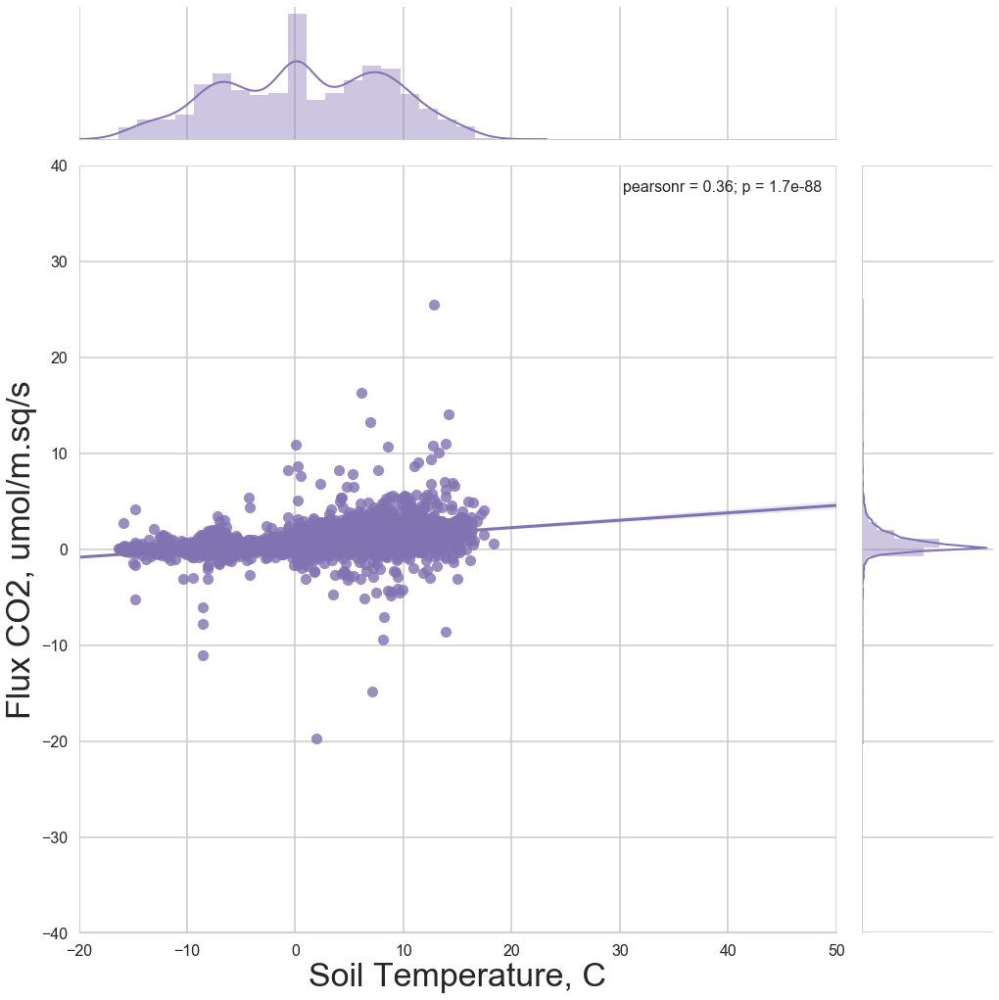

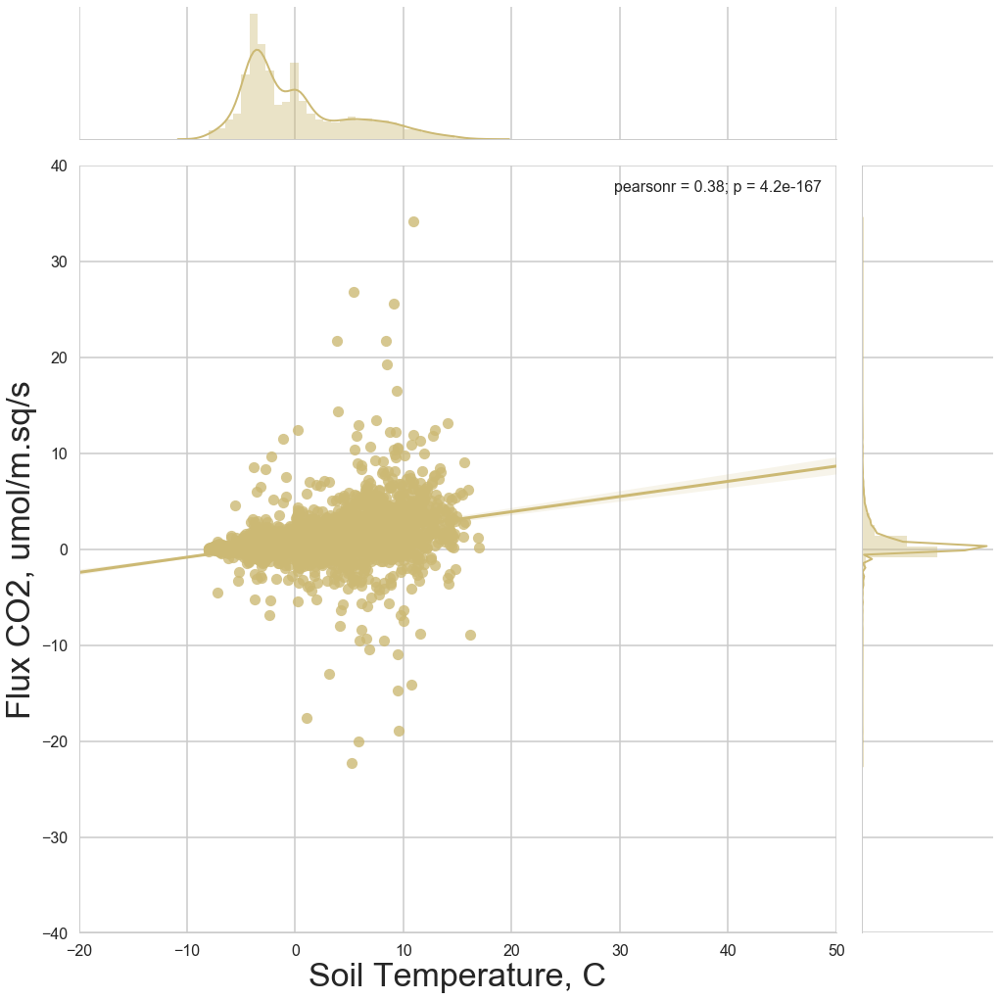

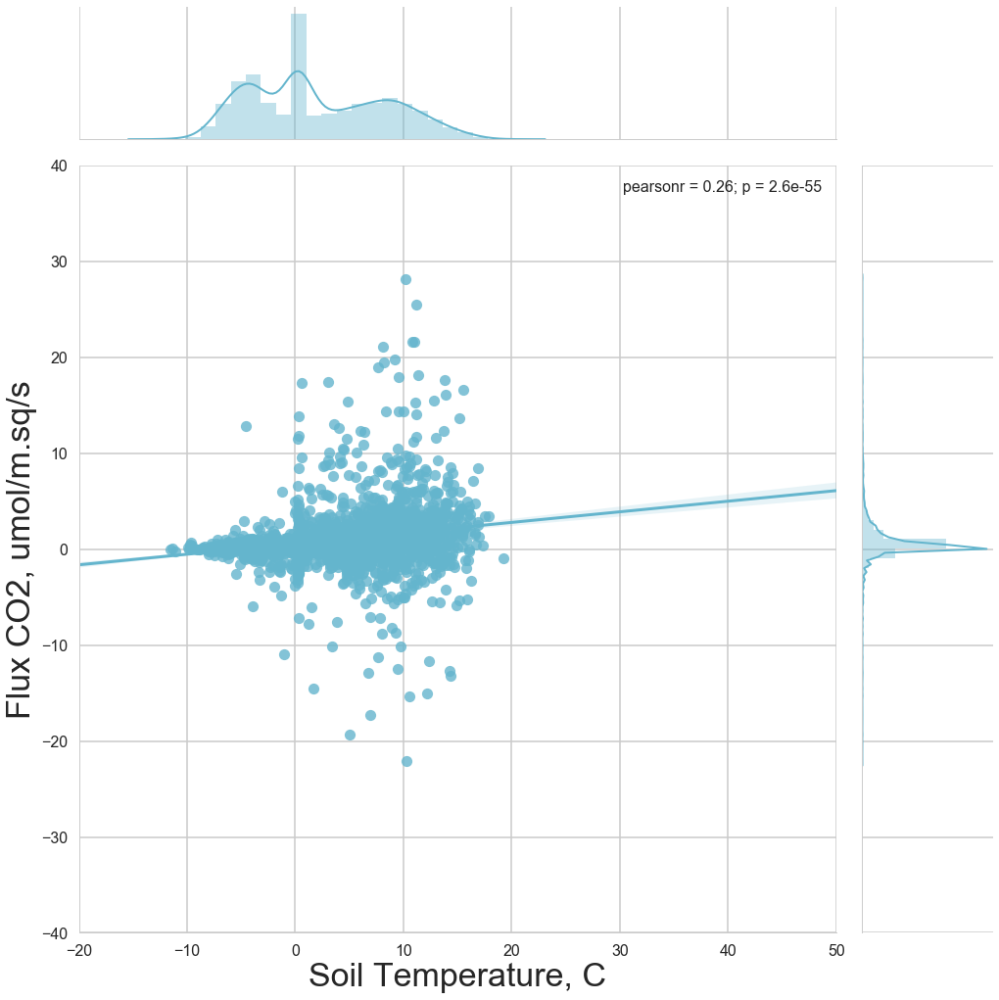

In [45]:
for s,c in zip(sites, sns.color_palette()):
#     plt.scatter(df[df['site']==s]['TS_2'],df[df['site']==s]['FC'], label=s, color=c)
    g = sns.jointplot(x='TS_2', y='FC', data=df[(df["day_light_bool"] == False) & (df["site"]==s)], label=s, color=c, size=15, kind='reg',dropna=1, xlim=(-20,50), ylim=(-40,40))
    g.set_axis_labels('Soil Temperature, C', 'Flux CO2, umol/m.sq/s');
    if save_fig:
        plt.savefig('img/FvsT_night/{}.png'.format(s), dpi=150)
    plt.show()

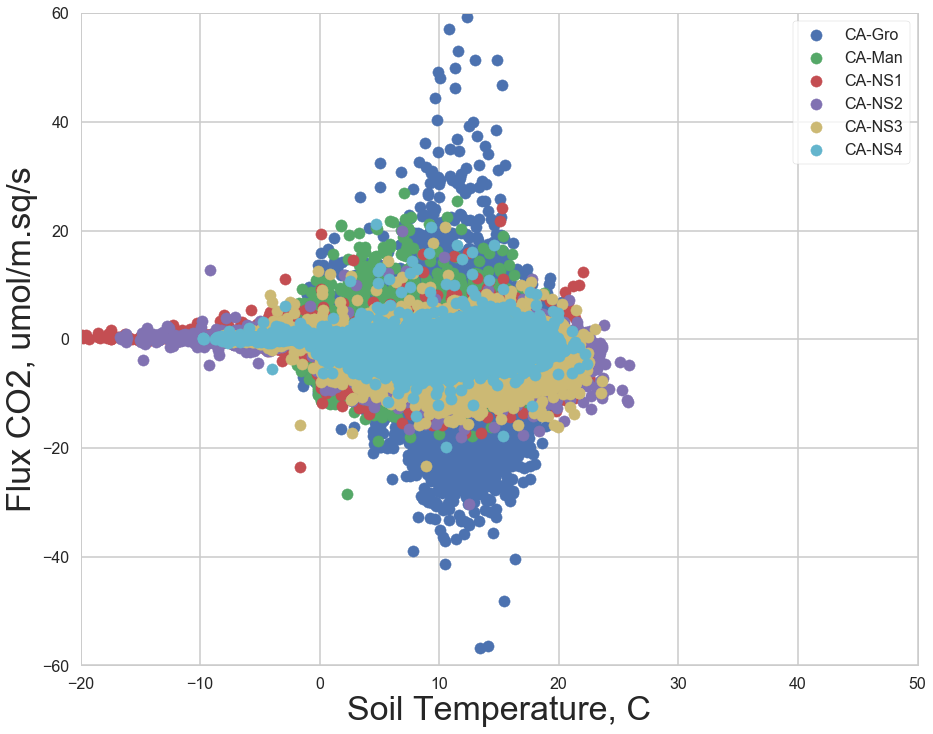

In [46]:
for s,c in zip(sites, sns.color_palette()):
    plt.scatter(df[(df["day_light_bool"] == True) & (df["site"]==s)]['TS_2'],df[(df["day_light_bool"] == True) & (df["site"]==s)]['FC'], label=s, color=c)
    plt.xlabel('Soil Temperature, C')
    plt.ylabel('Flux CO2, umol/m.sq/s')
    plt.xlim([-20,50])
    plt.ylim([-60,60])
plt.legend(frameon=1)
if save_fig:
    plt.savefig('img/FvsT_day/all.png', dpi=150)
plt.show()

/Users/MarkelovIgor/anaconda/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


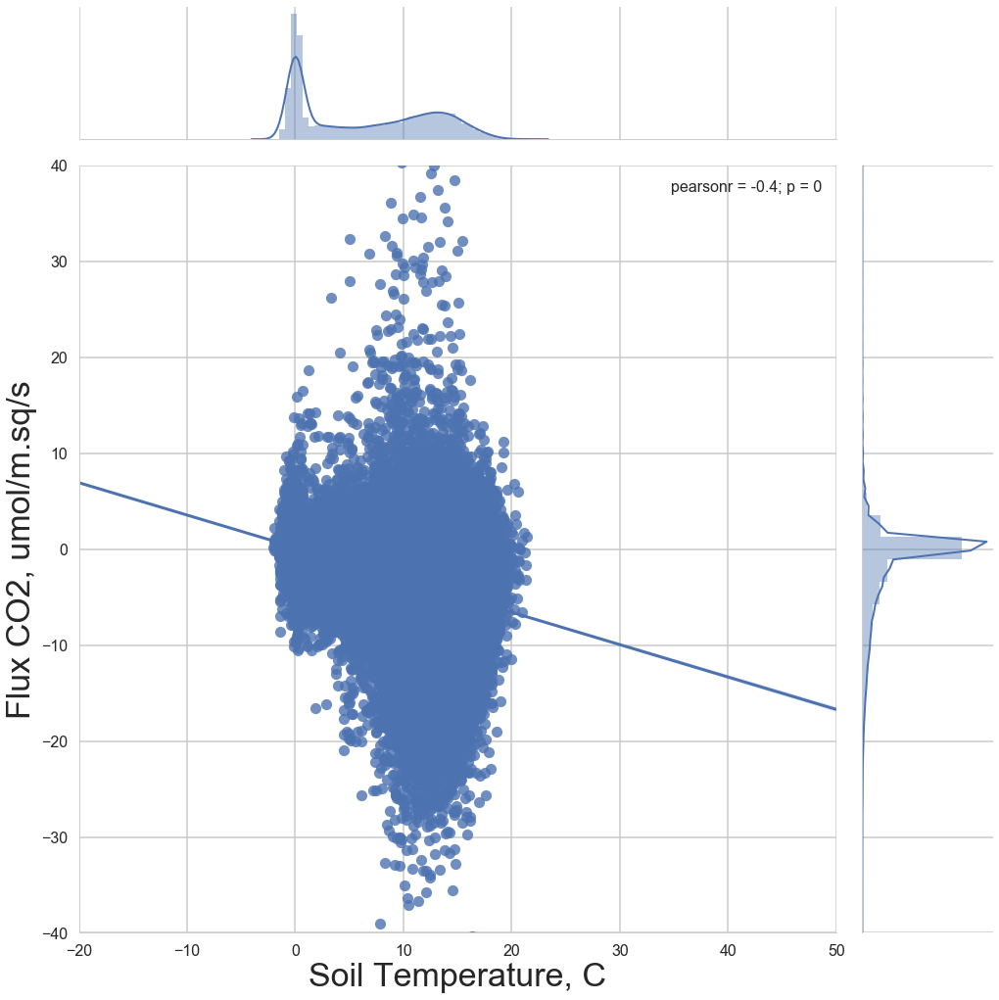

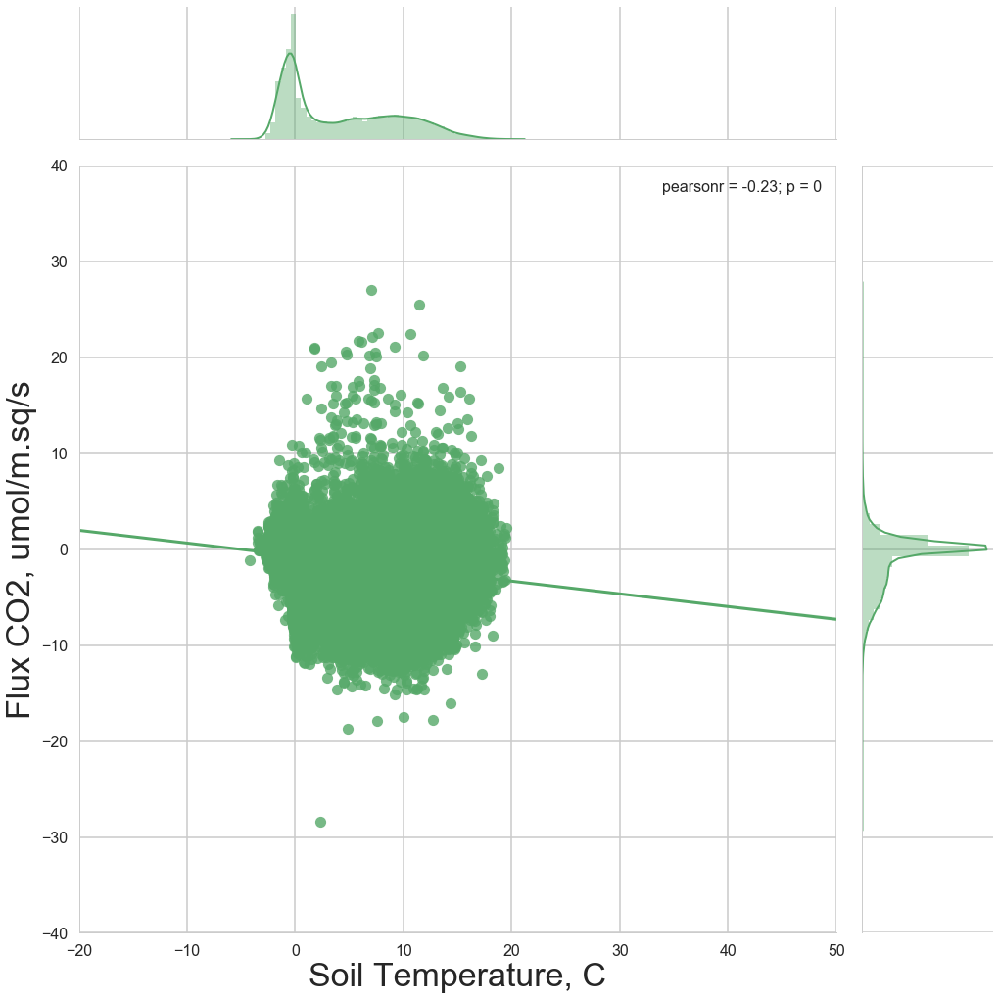

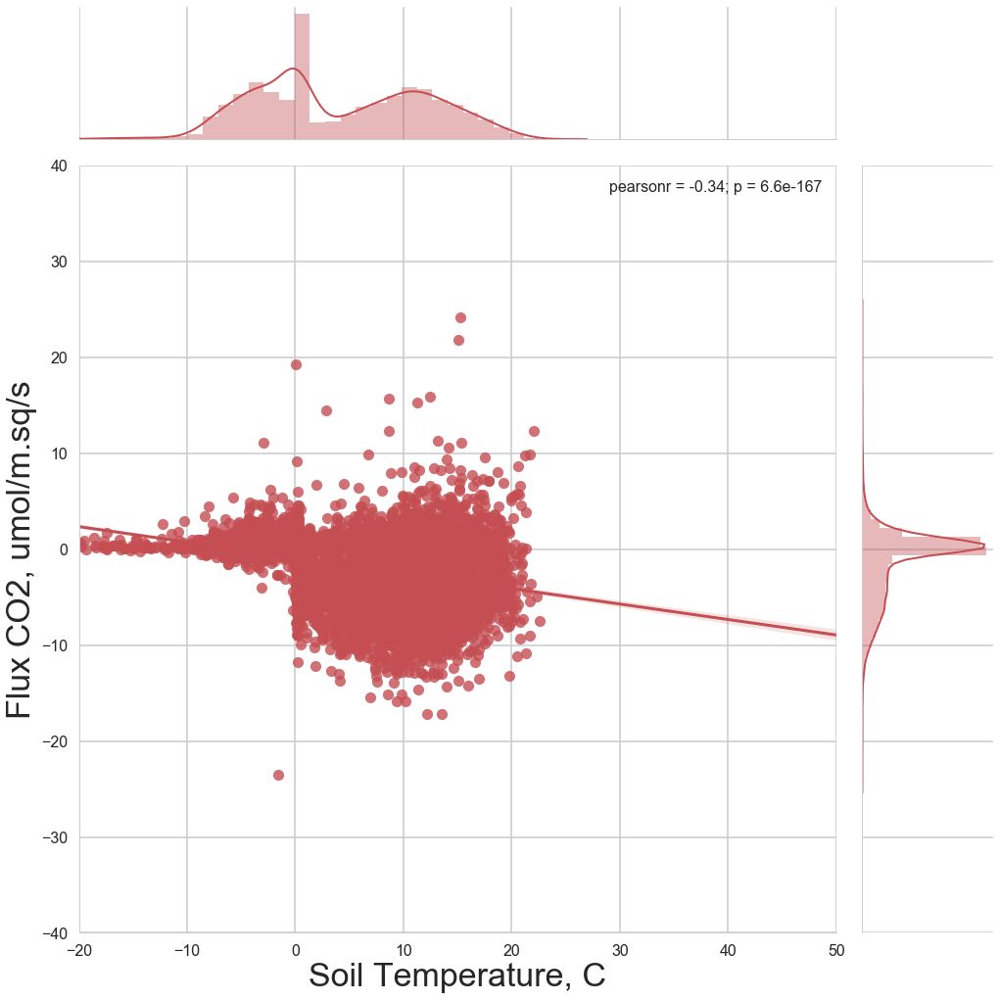

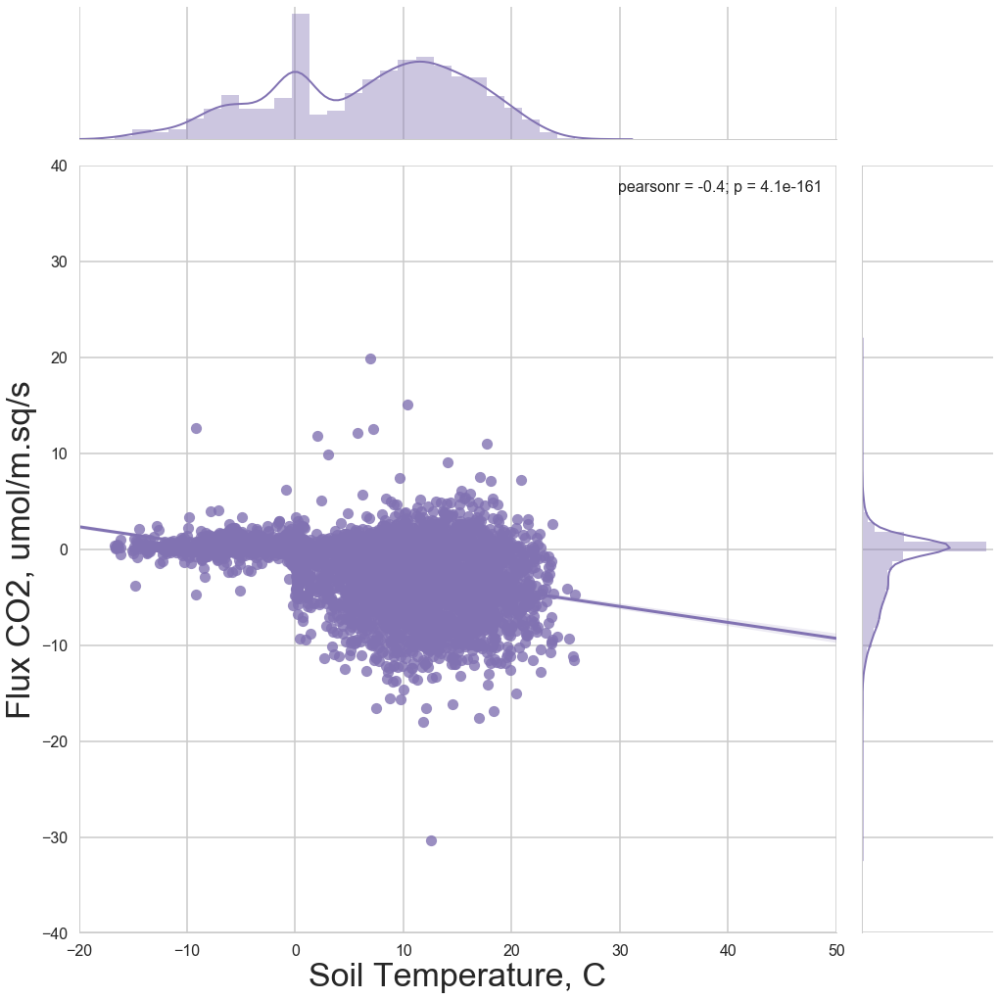

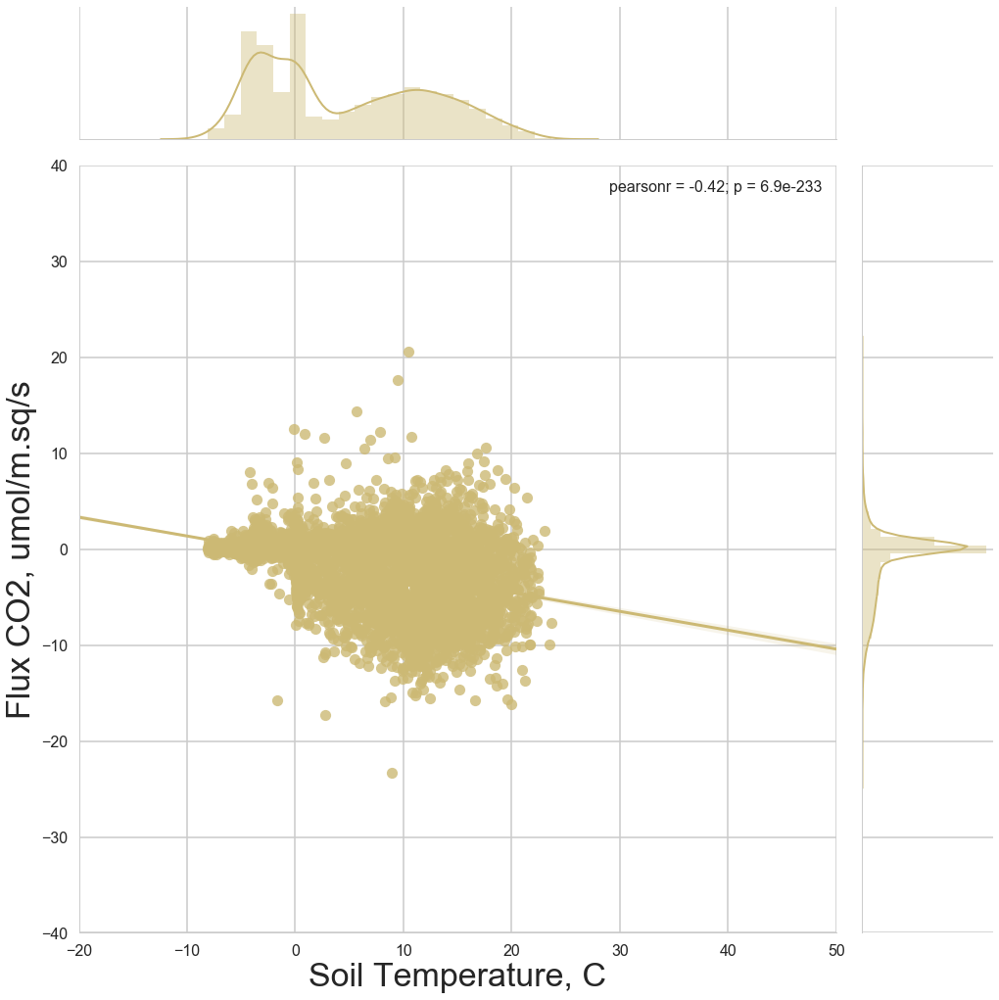

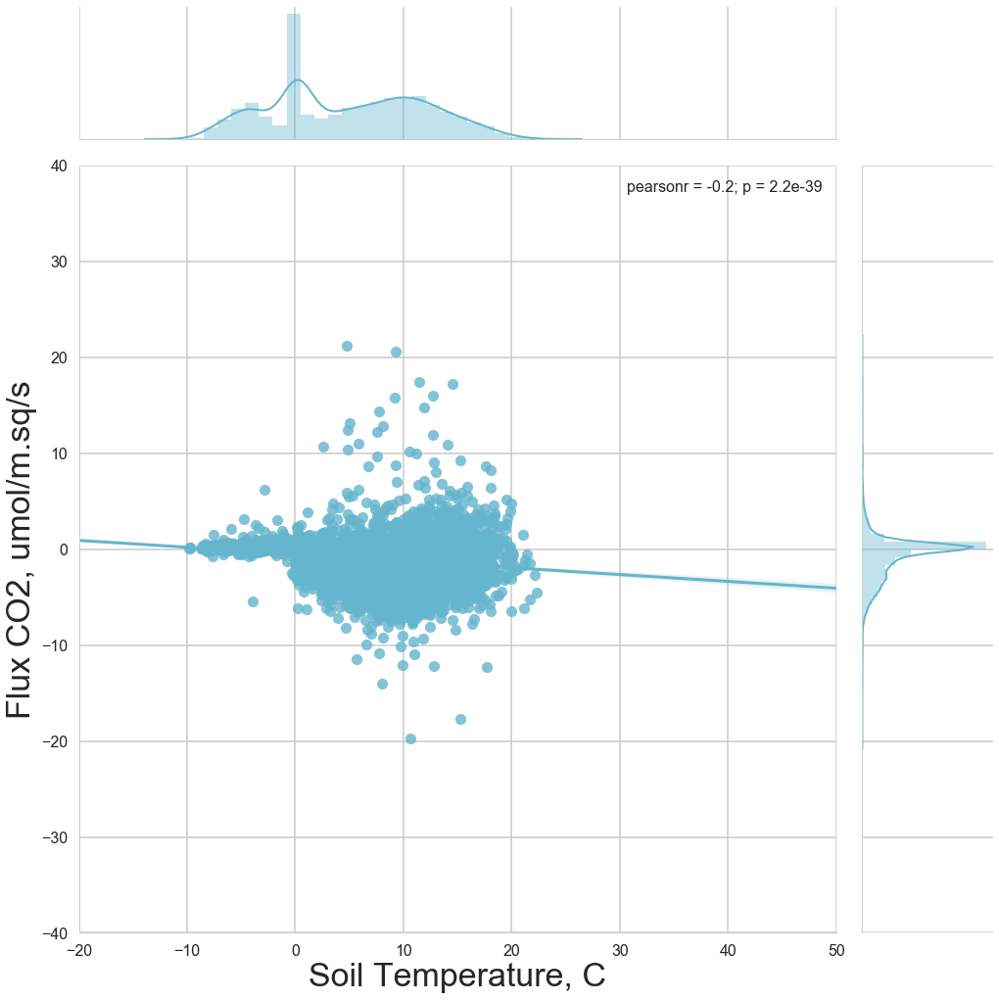

In [47]:
for s,c in zip(sites, sns.color_palette()):
#     plt.scatter(df[df['site']==s]['TS_2'],df[df['site']==s]['FC'], label=s, color=c)
    g = sns.jointplot(x='TS_2', y='FC', data=df[(df["day_light_bool"] == True) & (df["site"]==s)], label=s, color=c, size=15, kind='reg',dropna=1, xlim=(-20,50), ylim=(-40,40))
    g.set_axis_labels('Soil Temperature, C', 'Flux CO2, umol/m.sq/s');
    if save_fig:
        plt.savefig('img/FvsT_day/{}.png'.format(s), dpi=150)
    plt.show()

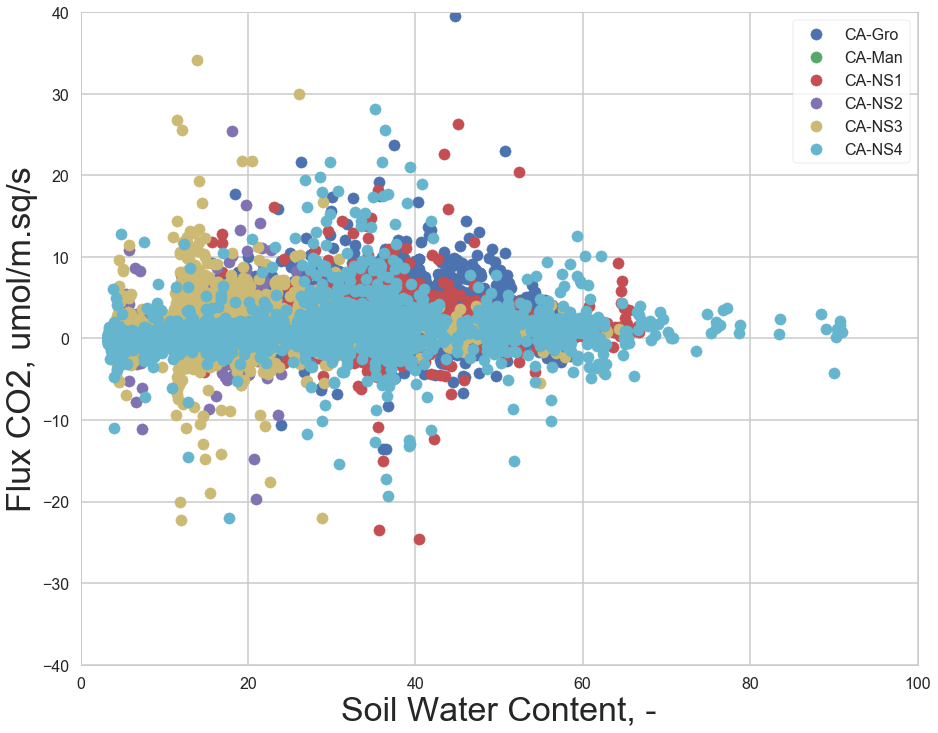

In [48]:
for s,c in zip(sites, sns.color_palette()):
    plt.scatter(df[(df["day_light_bool"] == False) & (df["site"]==s)]['SWC_1'],df[(df["day_light_bool"] == False) & (df["site"]==s)]['FC'], label=s, color=c)
    plt.xlabel('Soil Water Content, -')
    plt.ylabel('Flux CO2, umol/m.sq/s')
    plt.xlim([0,100])
    plt.ylim([-40,40])
plt.legend(frameon=1)
if save_fig:
    plt.savefig('img/FvsSWC_night/all.png', dpi=150)
plt.show()

/Users/MarkelovIgor/anaconda/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


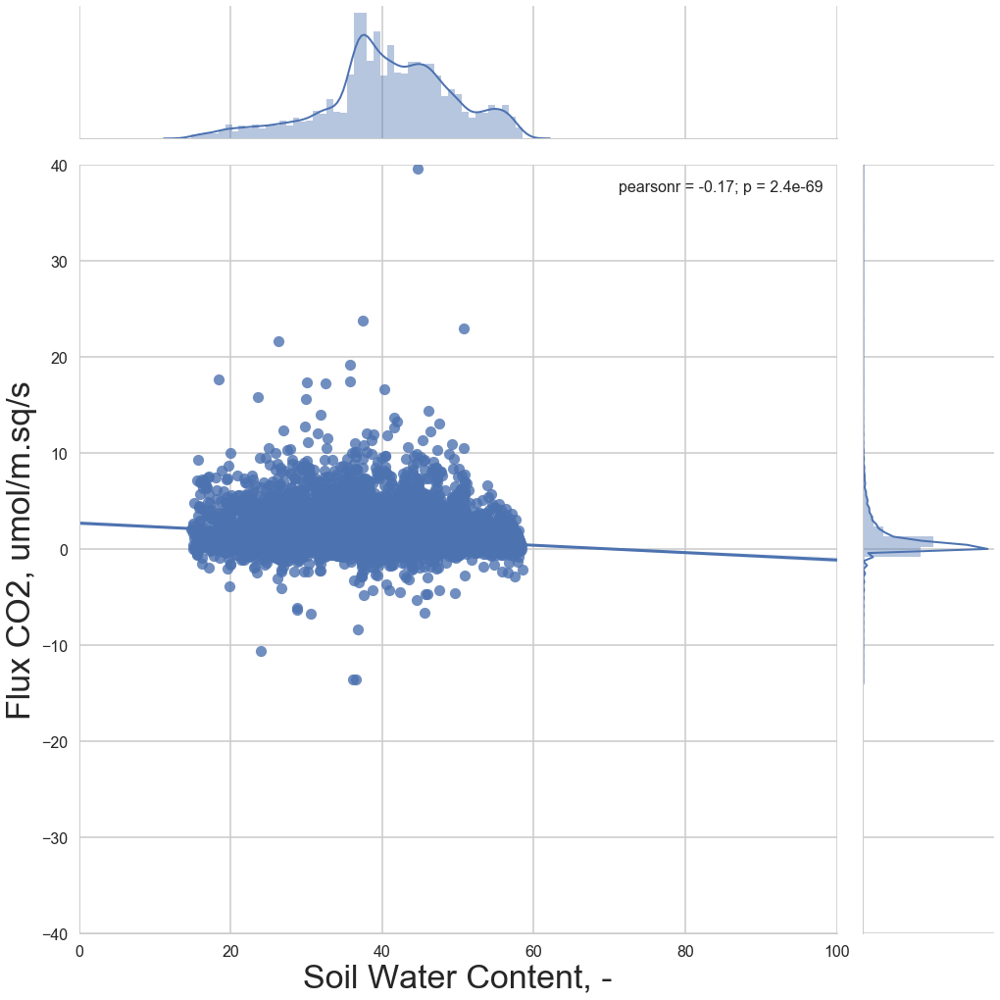

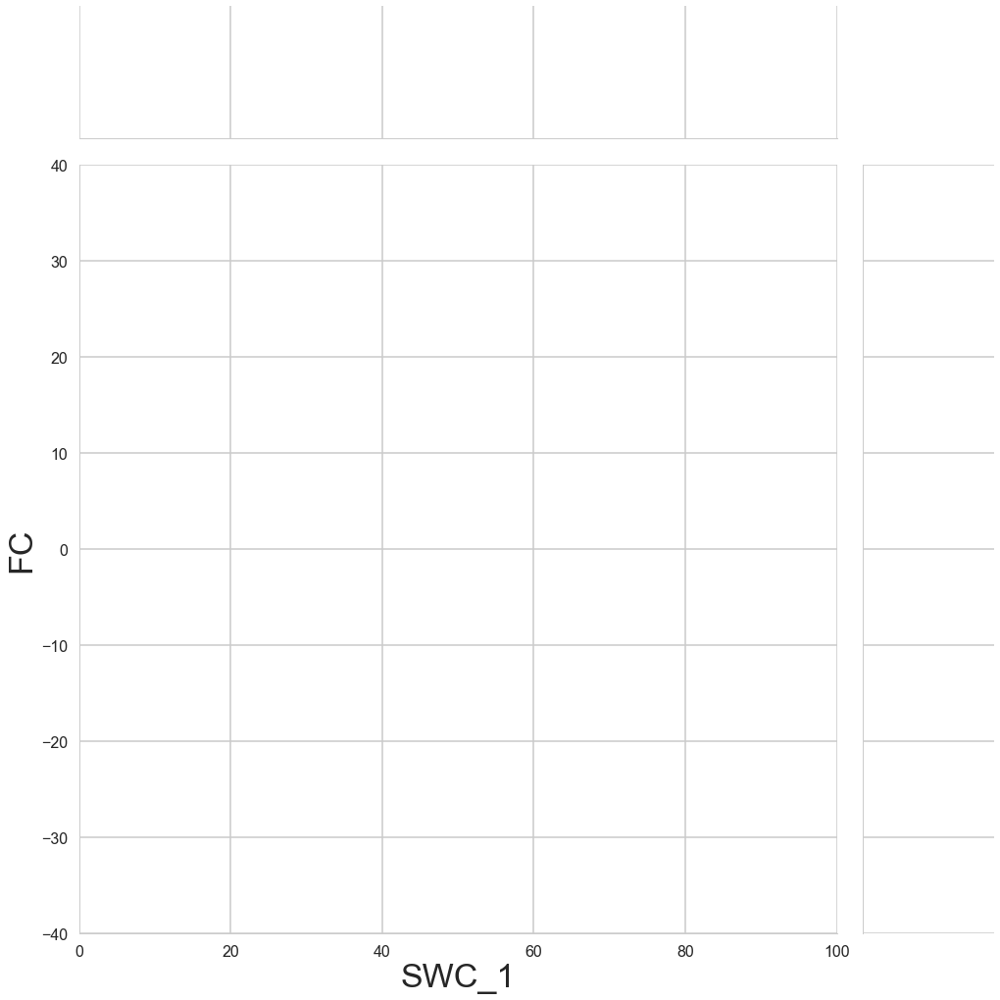

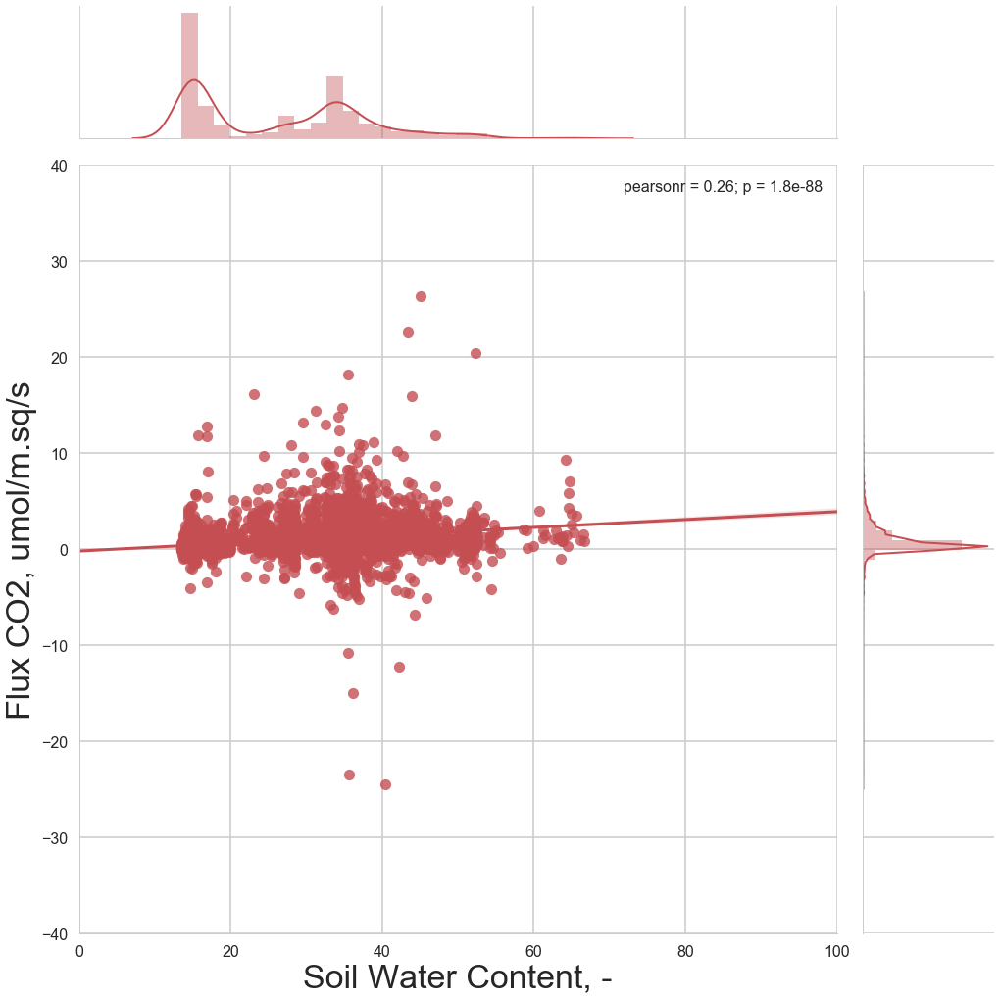

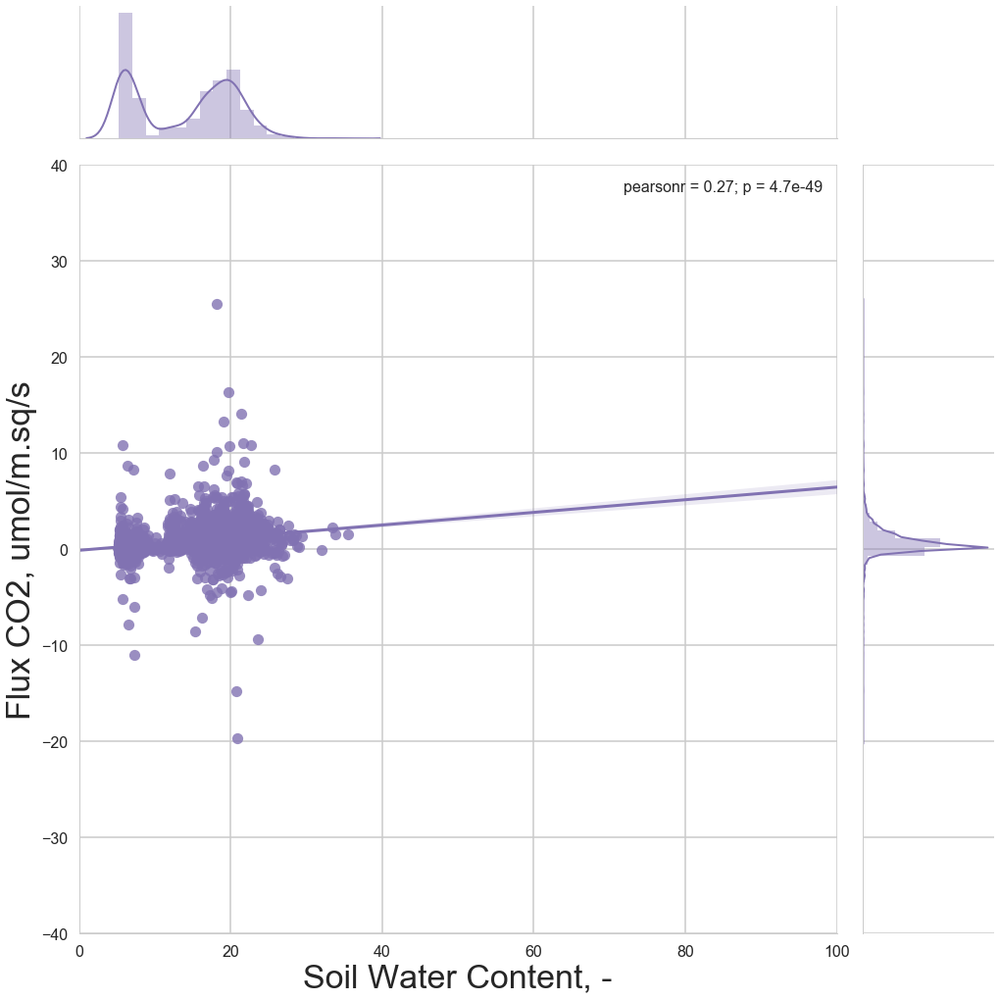

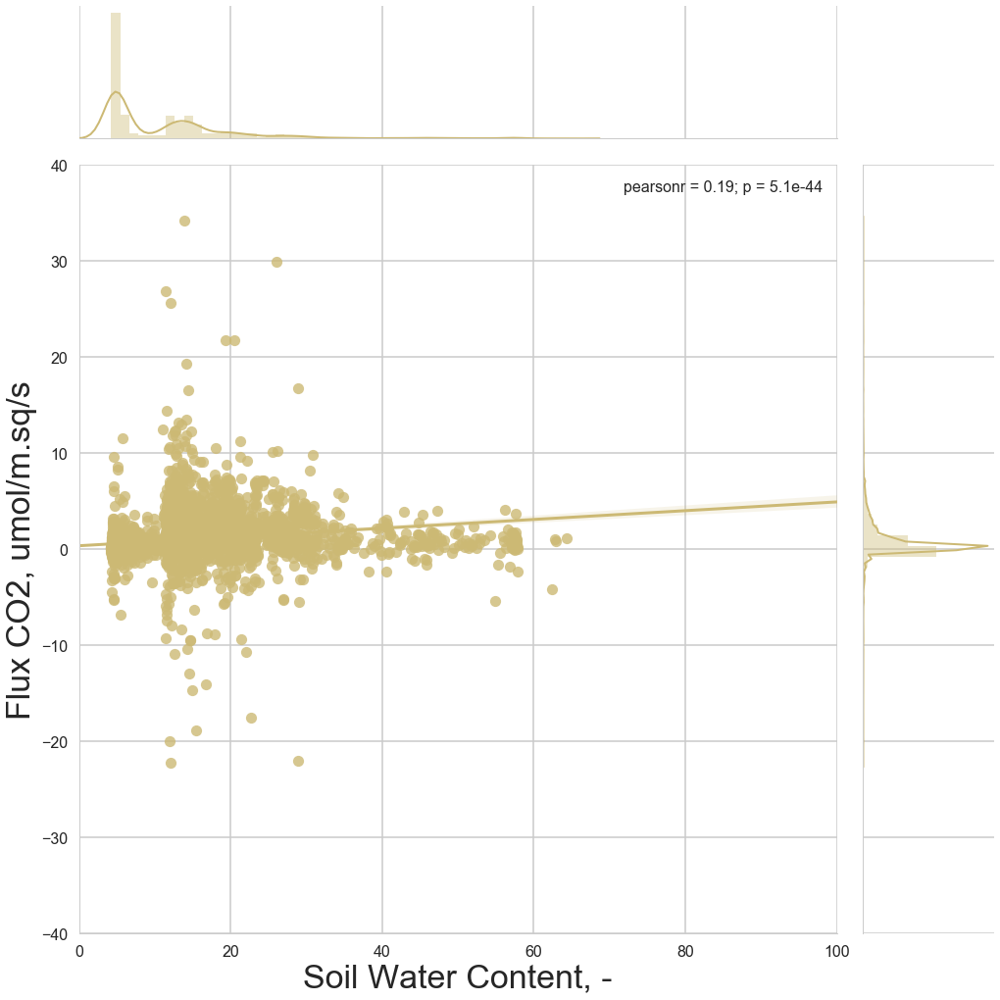

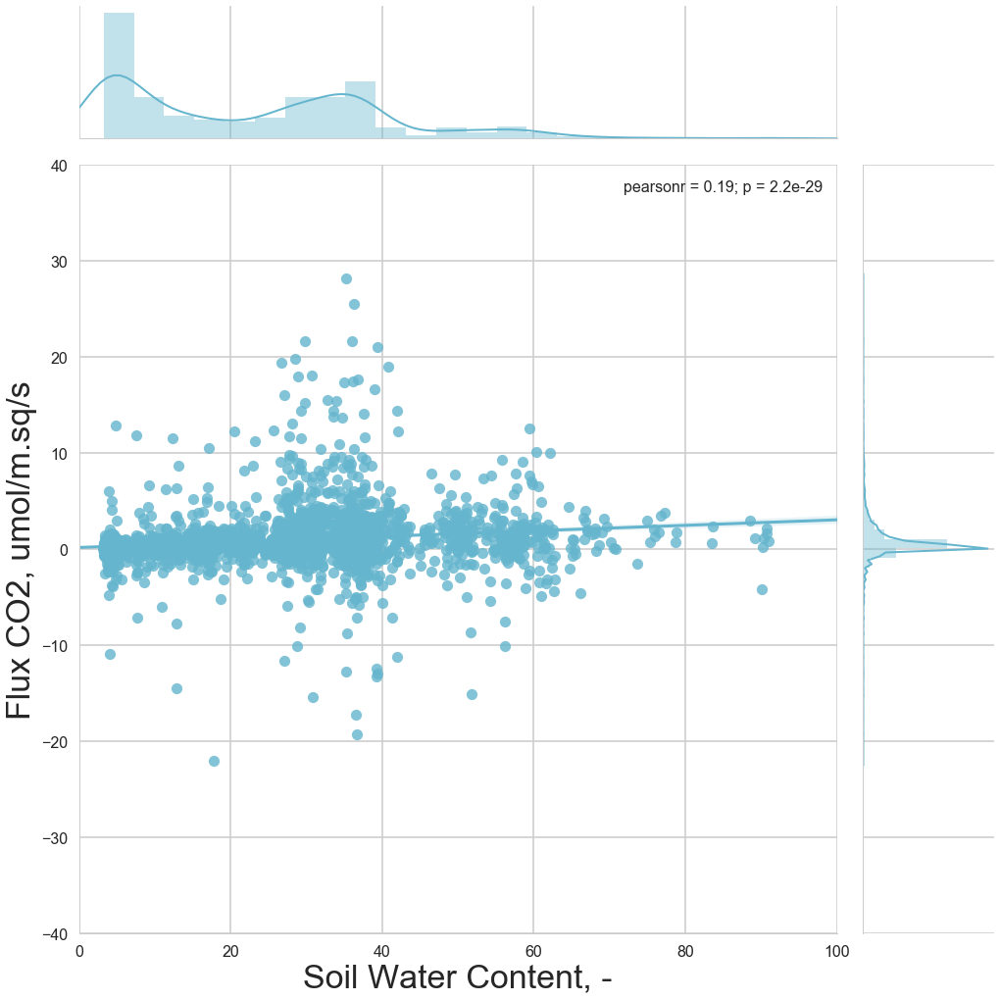

In [49]:
for s,c in zip(sites, sns.color_palette()):
#     plt.scatter(df[df['site']==s]['SWC_1'],df[df['site']==s]['FC'], label=s, color=c)
    try:
        g = sns.jointplot(x='SWC_1', y='FC', data=df[(df["day_light_bool"] == False) & (df["site"]==s)], label=s, color=c, size=15, kind='reg',dropna=1, xlim=(0,100), ylim=(-40,40))
    except:
        pass
    g.set_axis_labels('Soil Water Content, -', 'Flux CO2, umol/m.sq/s');
    if save_fig:
        plt.savefig('img/FvsSWC_night/{}.png'.format(s), dpi=150)
    plt.show()

In [50]:
from sklearn.ensemble import RandomForestRegressor

In [51]:

model = RandomForestRegressor(n_estimators=100, min_samples_leaf=10, random_state=1)

In [52]:
df['site_n'] = -9999
for n, s in enumerate(sites):
    df.loc[df['site'] == s, 'site_n'] = n

In [113]:
columns = ['SWC_1', 'TS_2', 'LOCATION_LONG', 'LOCATION_LAT', 'dayofyear', 'site_n', 'site']
target = ["FC"]

df_train = df[(df["day_light_bool"] == False)][columns+target]
df_train.shape

(1123303, 8)

In [114]:
df_train.dropna(inplace=True)
df_train.shape

(484805, 8)

In [144]:
# Import a convenience function to split the sets.
from sklearn.cross_validation import train_test_split

# Generate the training set.  Set random_state to be able to replicate results.
train = df_train.sample(frac=0.5, random_state=1)
# Select anything not in the training set and put it in the testing set.
test = df_train.loc[~df_train.index.isin(train.index)]
# Print the shapes of both sets.
print(train.shape)
print(test.shape)

(242402, 8)
(38581, 8)


In [145]:
from sklearn.metrics import mean_squared_error

# Initialize the model with some parameters.
model = RandomForestRegressor(n_estimators=200, min_samples_leaf=10, random_state=1)
# Fit the model to the data.
model.fit(train[['SWC_1', 'TS_2']], train[target])
# Make predictions.
predictions = model.predict(test[['SWC_1', 'TS_2']])
# Compute the error.
mean_squared_error(predictions, test[target])

/Users/MarkelovIgor/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


7.0858378703290574

In [146]:
for feature in zip(columns, model.feature_importances_):
    print(feature)

('SWC_1', 0.24869815035255216)
('TS_2', 0.75130184964744817)


In [147]:
train.head()

,SWC_1,TS_2,LOCATION_LONG,LOCATION_LAT,dayofyear,site_n,site,FC
TIMESTAMP_START,,,,,,,,
2005-04-20 21:00:00,19.500,0.276,-74.3421,49.6925,110,14,CA-Qfo,0.339
2013-12-30 22:00:00,18.300,0.648,-80.5577,42.6353,364,22,CA-TPD,0.011
2003-05-20 02:00:00,48.000,4.750,-105.1019,48.3077,140,23,US-FPe,0.000
2004-02-15 08:00:00,3.313,-4.073,-99.9483,56.6358,46,8,CA-NS7,-0.053
2003-08-20 06:00:00,25.000,11.970,-105.8176,54.4850,232,15,CA-SF1,1.430


In [148]:
test['predicted_FC'] = predictions

/Users/MarkelovIgor/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [149]:
site_n = len(df.site.unique())
site_n

25

In [150]:
test.head()

,SWC_1,TS_2,LOCATION_LONG,LOCATION_LAT,dayofyear,site_n,site,FC,predicted_FC
TIMESTAMP_START,,,,,,,,,
2003-09-02 21:30:00,19.8,10.02,-74.3421,49.6925,245,14,CA-Qfo,1.643,1.124435
2003-09-03 05:30:00,19.6,9.80,-74.3421,49.6925,246,14,CA-Qfo,0.146,1.672241
2003-09-03 20:00:00,20.3,10.18,-74.3421,49.6925,246,14,CA-Qfo,2.757,0.853521
2003-09-04 04:30:00,24.0,10.98,-74.3421,49.6925,247,14,CA-Qfo,4.177,1.385815
2003-09-06 20:30:00,19.5,10.73,-74.3421,49.6925,249,14,CA-Qfo,2.808,3.042591


In [151]:
test['week_n'] = test.index.to_series().dt.week
train['week_n'] = train.index.to_series().dt.week

/Users/MarkelovIgor/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


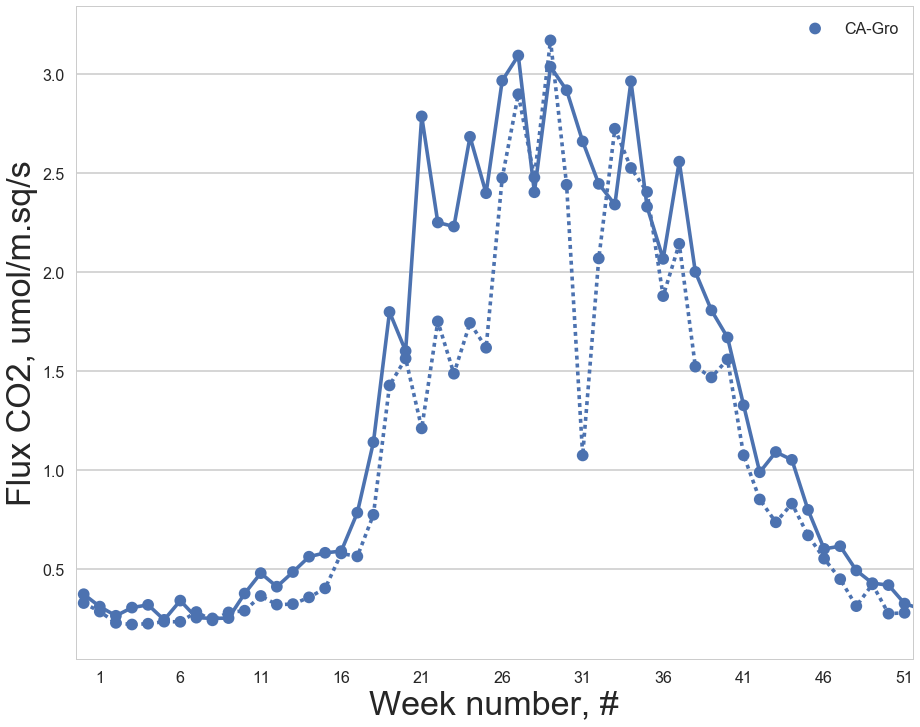

/Users/MarkelovIgor/anaconda/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


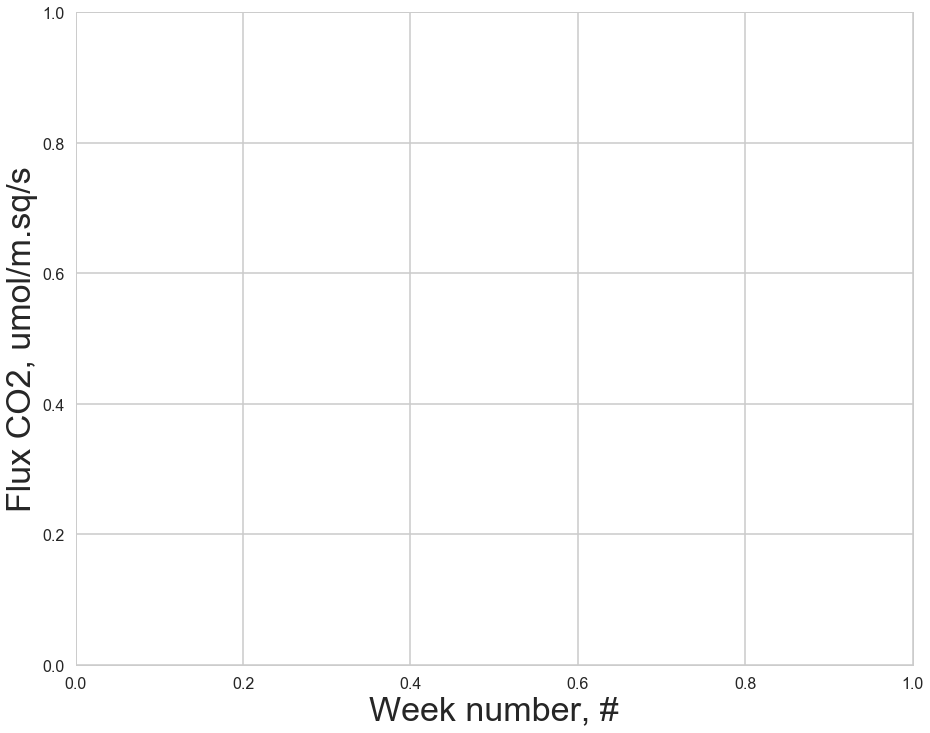

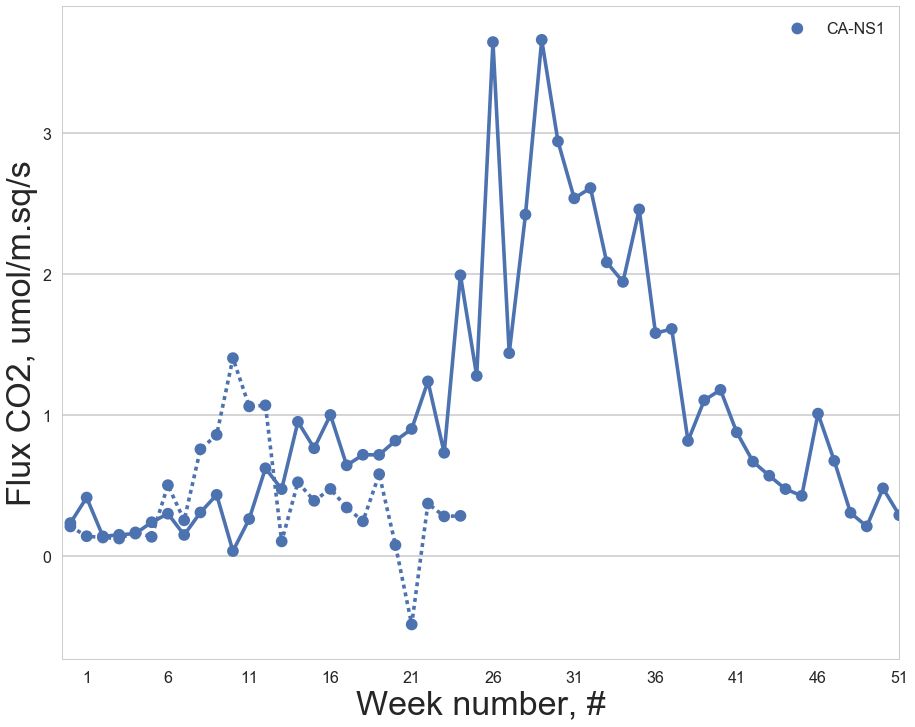

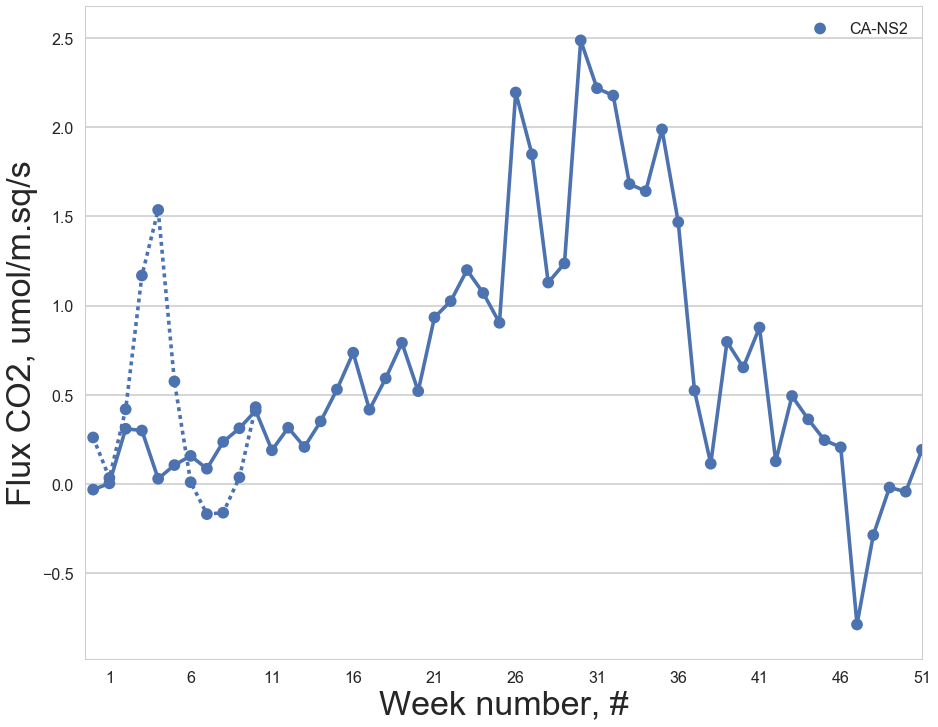

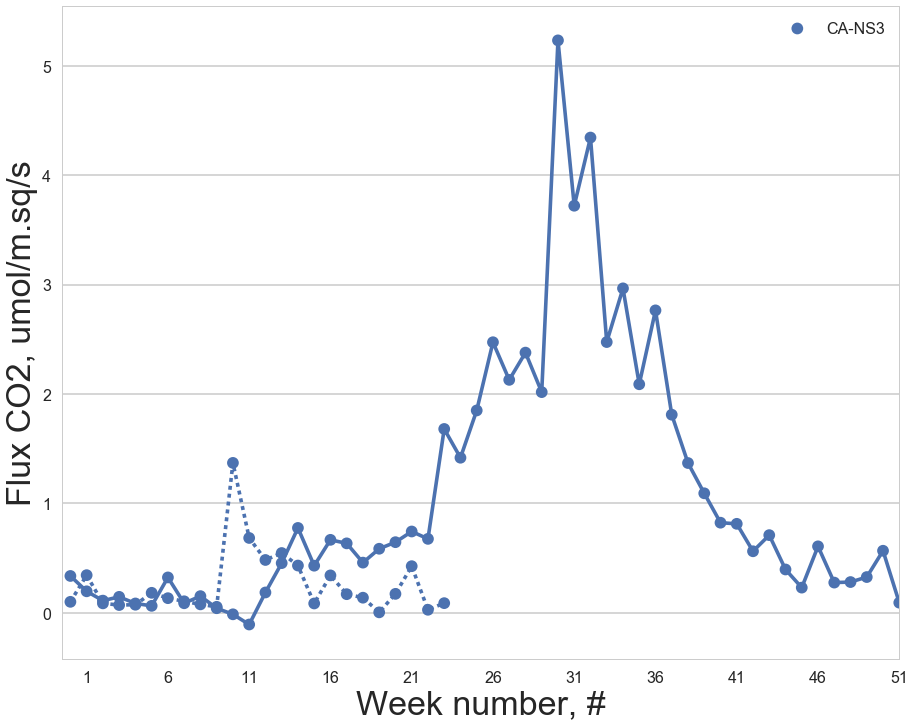

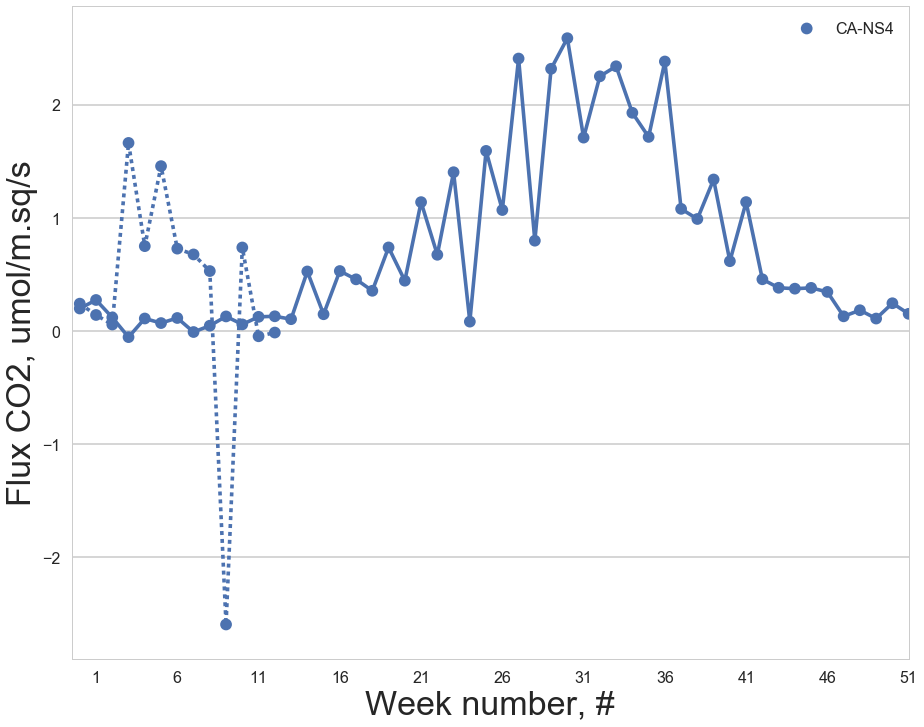

...

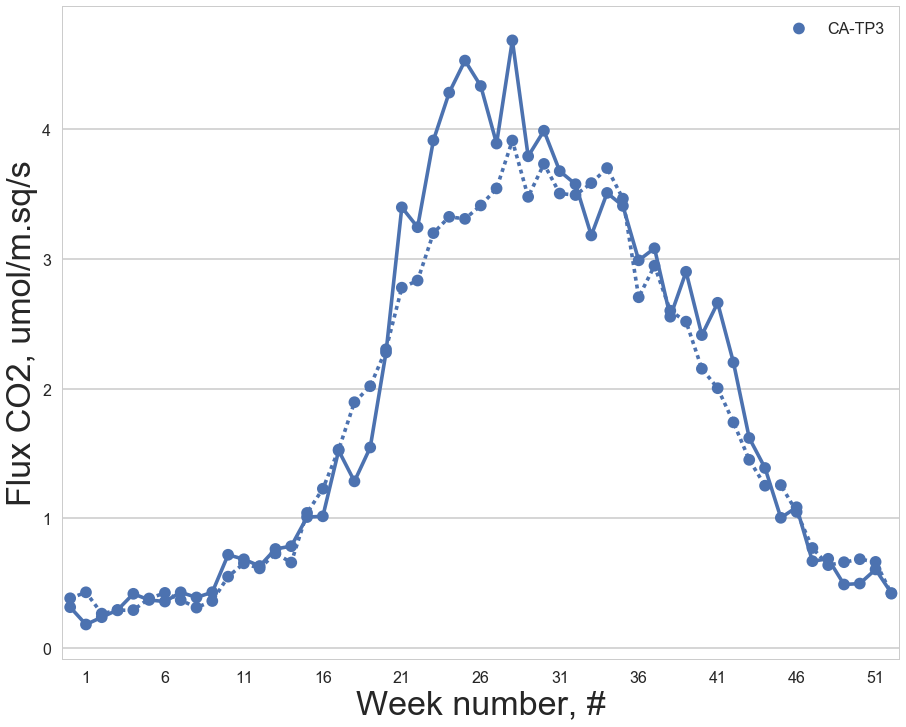

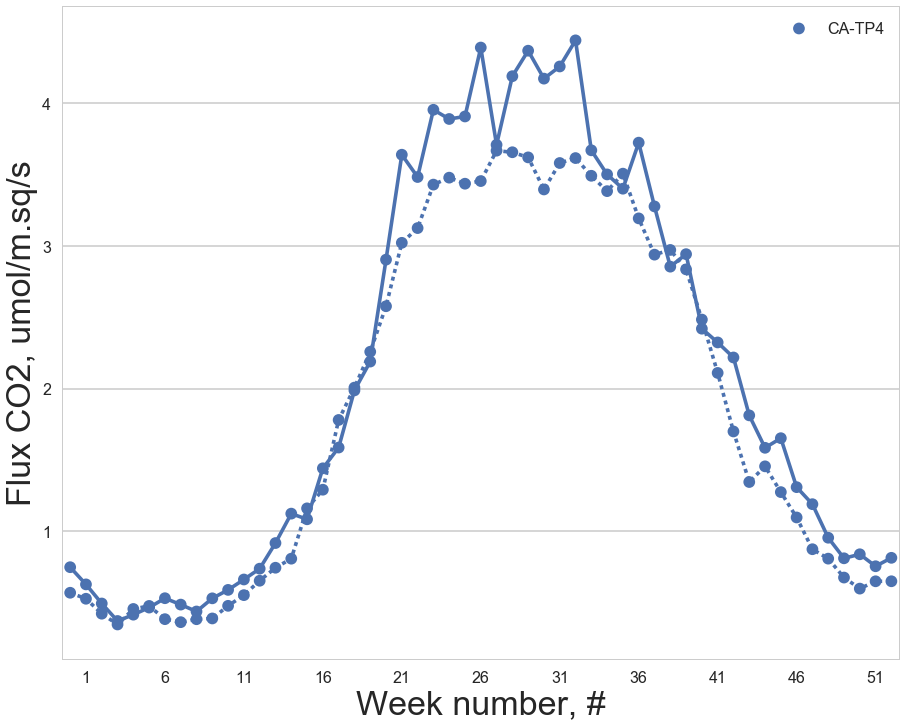

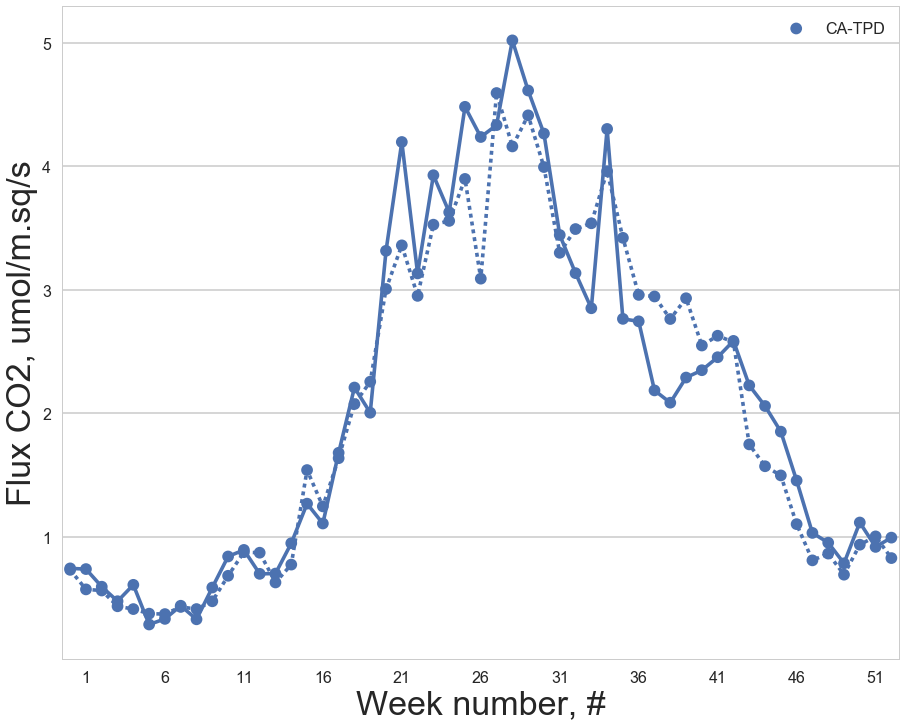

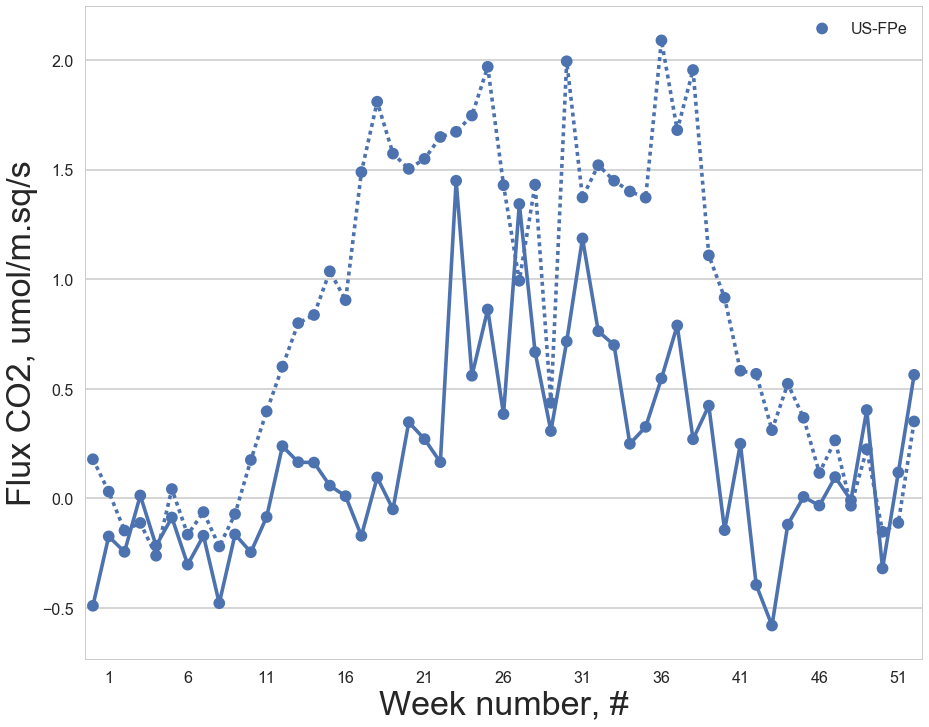

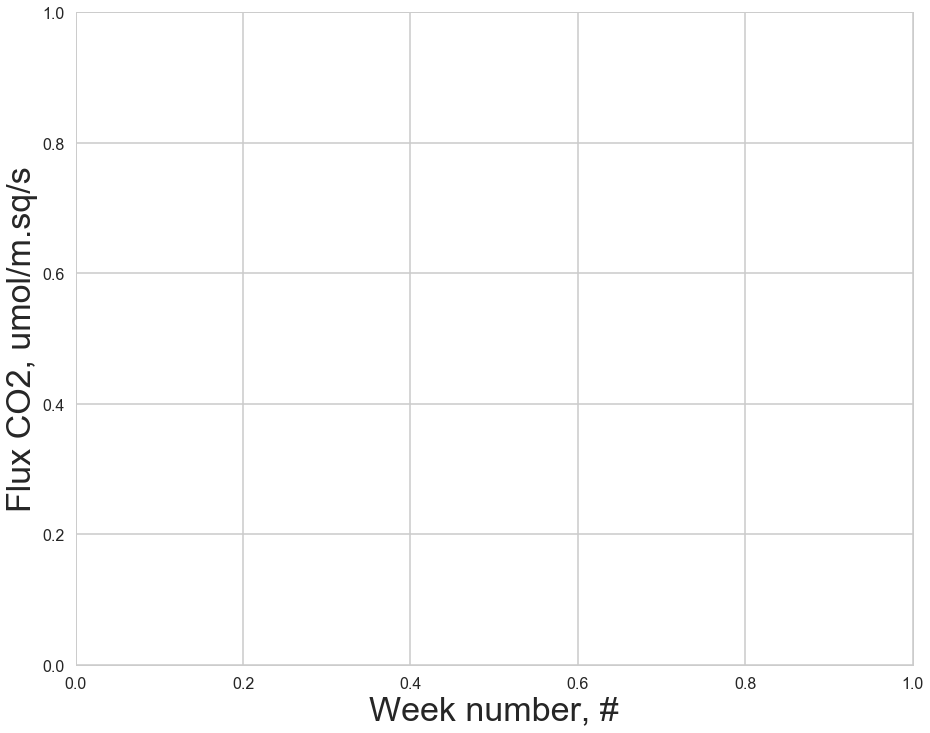

In [163]:
for s in np.arange(0,site_n):
#     plt.plot(test.index, test['FC'], label=s, color=c)
    try:
        g = sns.pointplot(x='week_n', y='FC', data=train[train['site_n']==s], ci=0, hue='site', label=s)
        g = sns.pointplot(x='week_n', y='predicted_FC', linestyles=':', data=test[test['site_n']==s], ci=0)
        g.set_xticks(np.arange(1,53,5))
        g.set_xticklabels(np.arange(1,53,5))
    except:
        pass
    plt.ylabel('Flux CO2, umol/m.sq/s')
    plt.xlabel('Week number, #')
    plt.legend()

#     if save_fig:
    if True:
        plt.savefig('img/F_ML_train_all/{}.png'.format(s), dpi=150)


    plt.show()

In [153]:
train[['SWC_1', 'TS_2']].corr()

,SWC_1,TS_2
SWC_1,1.000000,-0.078289
TS_2,-0.078289,1.000000


In [154]:
train.columns

Index(['SWC_1', 'TS_2', 'LOCATION_LONG', 'LOCATION_LAT', 'dayofyear', 'site_n',
       'site', 'FC', 'week_n'],
      dtype='object')

In [155]:
col_ren = ['SWC', 'TS']

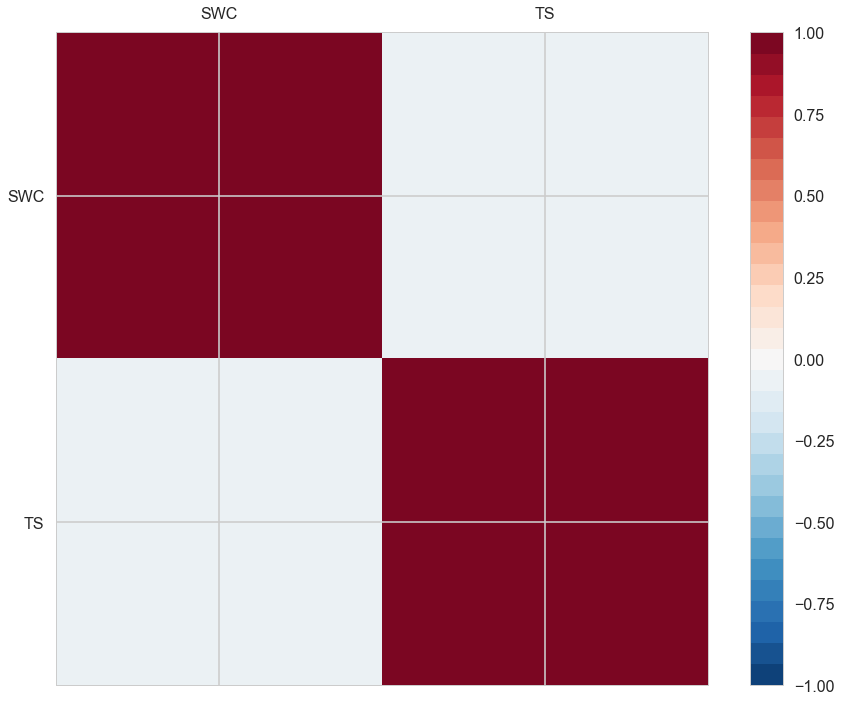

In [156]:
from matplotlib.colors import ListedColormap
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(train[['SWC_1', 'TS_2']].corr(), vmin=-1, vmax=1, cmap=ListedColormap(sns.color_palette(
        "RdBu_r", 31)))
fig.colorbar(cax)
ticks = np.arange(0,2,1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_xticklabels(col_ren)
ax.set_yticklabels(col_ren)
if save_fig:
    plt.savefig('img/corr_2.png'.format(s), dpi=150)
plt.show()

In [157]:

features = {f:v for f,v in zip(col_ren, model.feature_importances_)}
D = features
# import operator
# D = sorted(D.items(), key=operator.itemgetter(1))

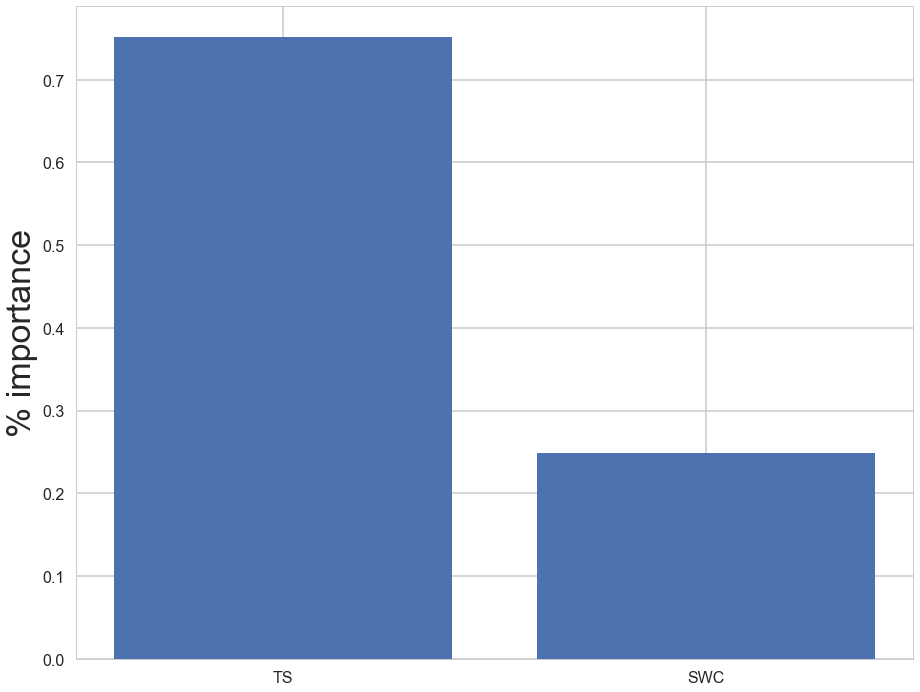

In [158]:
plt.bar(range(len(D)), D.values(), align='center')
plt.xticks(range(len(D)), D.keys())
plt.ylabel('% importance')
if True:
    plt.savefig('img/importance_3.png'.format(s), dpi=150)
plt.show()
plt.show()

In [159]:
# import matplotlib.pyplot as plt
# import numpy as np
# import pandas as pd
# from scipy.cluster.vq import kmeans, vq
# from statsmodels.sandbox.tools.tools_pca import pcasvd


# data = df_train
# data = (data - data.mean()) / data.std()
# pca = pcasvd(data, keepdim=0, demean=False)

# values = data.values
# centroids, _ = kmeans(values, 3)
# idx, _ = vq(values, centroids)

# colors = ['gby'[i] for i in idx]

# plt.figure(1)
# biplot(plt, pca, labels=data.index, colors=colors,
#        xpc=1, ypc=2)
# plt.show()

In [160]:
df[columns+target].dropna().describe()

,SWC_1,TS_2,LOCATION_LONG,LOCATION_LAT,dayofyear,site_n,FC
count,1.029690e+06,1.029690e+06,1.029690e+06,1.029690e+06,1.029690e+06,1.029690e+06,1.029690e+06
mean,1.630391e+01,7.844070e+00,-8.524110e+01,4.651157e+01,1.836035e+02,1.708799e+01,-7.841495e-01
std,1.252346e+01,8.029019e+00,1.108315e+01,4.718043e+00,1.012784e+02,5.228325e+00,5.118933e+00
min,0.000000e+00,-2.097000e+01,-1.061978e+02,4.263530e+01,1.000000e+00,0.000000e+00,-5.902000e+01
25%,8.800000e+00,3.200000e-01,-8.215560e+01,4.270680e+01,1.010000e+02,1.400000e+01,-1.099000e+00
50%,1.230000e+01,7.310000e+00,-8.035740e+01,4.271020e+01,1.840000e+02,1.800000e+01,2.530000e-01
75%,1.860000e+01,1.411500e+01,-8.034830e+01,4.969250e+01,2.670000e+02,2.100000e+01,1.160000e+00
max,1.000000e+02,4.738000e+01,-7.403650e+01,5.663580e+01,3.660000e+02,2.300000e+01,5.823000e+01


In [161]:
columns

['SWC_1',
 'TS_2',
 'LOCATION_LONG',
 'LOCATION_LAT',
 'dayofyear',
 'site_n',
 'site']

In [162]:
sites

['CA-Gro',
 'CA-Man',
 'CA-NS1',
 'CA-NS2',
 'CA-NS3',
 'CA-NS4',
 'CA-NS5',
 'CA-NS6',
 'CA-NS7',
 'CA-NS8',
 'CA-Oas',
 'CA-Obs',
 'CA-Ojp',
 'CA-Qcu',
 'CA-Qfo',
 'CA-SF1',
 'CA-SF2',
 'CA-SF3',
 'CA-TP1',
 'CA-TP2',
 'CA-TP3',
 'CA-TP4',
 'CA-TPD',
 'US-FPe',
 'US-Los']

In [1097]:
T_test = np.linspace(-20.0, 30.0, num=1001)

In [1098]:
SWC_test = np.linspace(0.0, 100.0, num=1001)

In [1099]:
t_arr = []; # np.zeros((1,1))
s_arr = []; # np.zeros((1,1))
for i, t in enumerate(T_test):
    for j, s in enumerate(SWC_test):
        t_arr.append(t); s_arr.append(s); 

In [1100]:
fun_arr = pd.DataFrame({"TS_2":t_arr, "SWC_1":s_arr})

In [1101]:
fun_arr['FC'] = model.predict(fun_arr[['SWC_1', 'TS_2']])

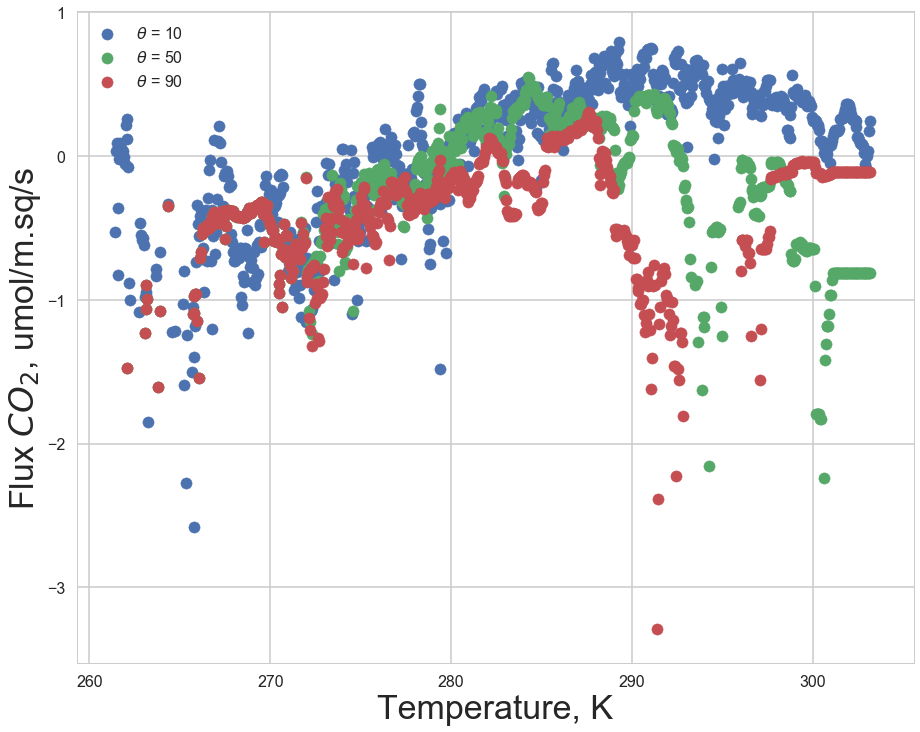

In [1102]:
cond =90
for i in np.arange(0,3):
    cond = (i)*40 + 10
    plt.scatter(fun_arr[fun_arr['SWC_1']==cond]['TS_2']+273.15, np.log10(fun_arr[fun_arr['SWC_1']==cond]['FC']), label=r'$\theta$ = '+str(cond))
    plt.xlabel('Temperature, K')
    plt.ylabel(r'Flux $CO_2$, umol/m.sq/s')
plt.legend()
if save_fig:
# if True:
    plt.savefig('img/T_dependence.png', dpi=150)


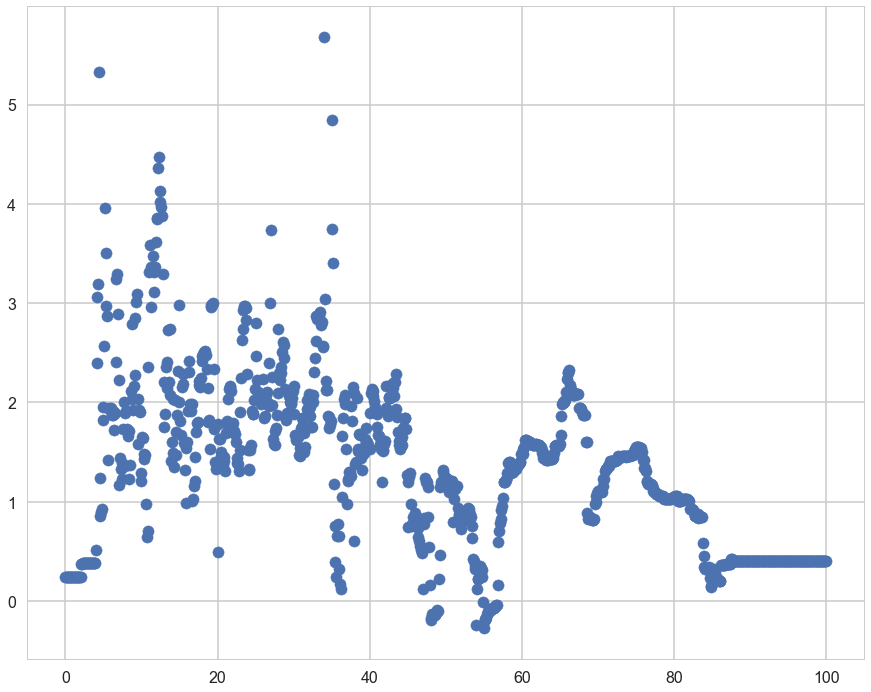

In [1105]:
cond =10
plt.scatter(fun_arr[fun_arr['TS_2']==cond]['SWC_1'],fun_arr[fun_arr['TS_2']==cond]['FC'])

In [347]:
def temp_dep_fun(Tk, Fmax, Ea, dS, Hd):
    R = 8.314
    opt_T = 290
    a = np.exp(Ea*(Tk-opt_T)/opt_T/R/Tk)
    b = 1+np.exp((opt_T*dS-Hd)/opt_T/R)
    c = 1+np.exp((Tk*dS-Hd)/Tk/R)
    return Fmax * a * b / c

In [361]:
def temp_dep_fun_2(Tk, Fmax, Ea, dS, Hd):
    R = 8.314
    opt_T = 290
    a = np.exp(-Ea/R/Tk)
    c = 1+np.exp((Tk*dS-Hd)/Tk/R)
    return Fmax * a / c

In [798]:
def temp_dep_fun_3(Tk, T0=284.05718055, Ea=-67549.55123981, dS=543.64843782, Hd=155944.4165113):
    R = 8.314
    a = np.exp((-Ea/R/T0)*(1-T0/Tk))
    b = 1+np.exp((Tk*dS-Hd)/Tk/R)
    return a / b

In [796]:
import scipy as sp
cond =10

xdata = fun_arr[fun_arr['SWC_1']==cond]['TS_2'] + 273.15
ydata = fun_arr[fun_arr['SWC_1']==cond]['FC'] 
popt, pcov = sp.optimize.curve_fit(temp_dep_fun_3, xdata, ydata, p0=[290,  -1.09357077e+05,7.00896111e+02,   2.03652714e+05])

In [482]:
popt

array([  2.90000000e+02,   6.51017673e+00,  -1.09357077e+05,
         7.00896111e+02,   2.03652714e+05])

[    295.87243716  -45014.04745829     619.84913358  184025.18695381]
[  2.92813610e+02  -5.03660603e+04   1.07724902e+03   3.16076068e+05]


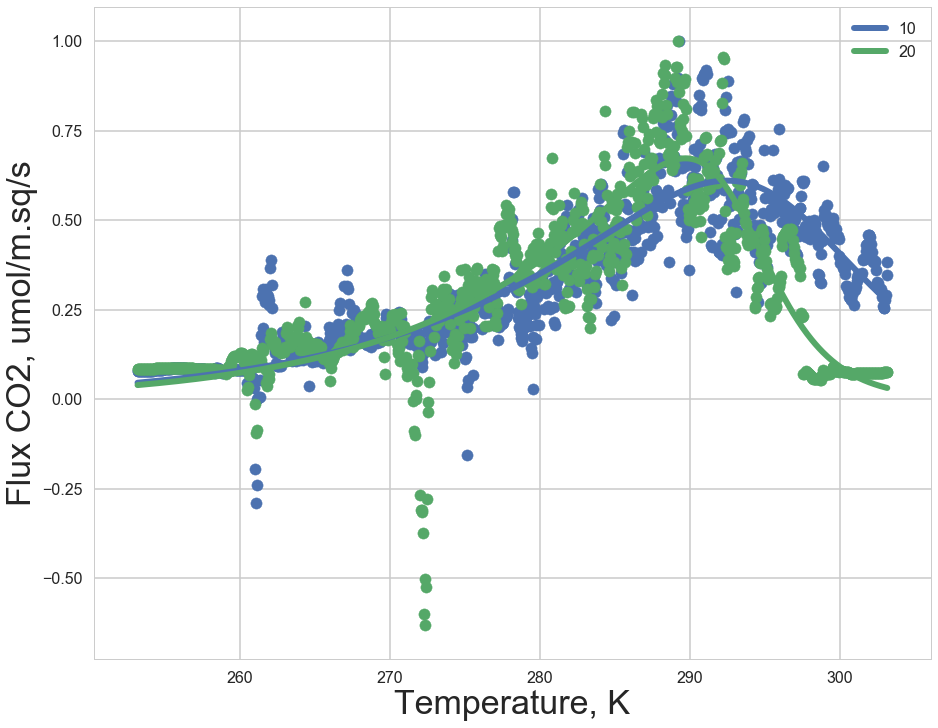

In [1106]:
cond =10
for i in np.arange(1,3):
    cond = i*10
    p0=[2.90000000e+02,  -1.09357077e+05,  7.00896111e+02,   2.03652714e+05]
    xdata = fun_arr[fun_arr['SWC_1']==cond]['TS_2'] + 273.15
    ydata = (fun_arr[fun_arr['SWC_1']==cond]['FC'] + 1)/max(fun_arr[fun_arr['SWC_1']==cond]['FC'] + 1)
    try:
        popt, pcov = sp.optimize.curve_fit(temp_dep_fun_3, xdata, ydata, p0)
        plt.plot(xdata, temp_dep_fun_3(xdata, *popt ), label=cond, lw=6)
        print(popt)
    except:
        pass
    plt.scatter(xdata, ydata, label=None)
    plt.legend()
    plt.xlabel('Temperature, K')
    plt.ylabel('Flux CO2, umol/m.sq/s')
# plt.ylim(-1,1)

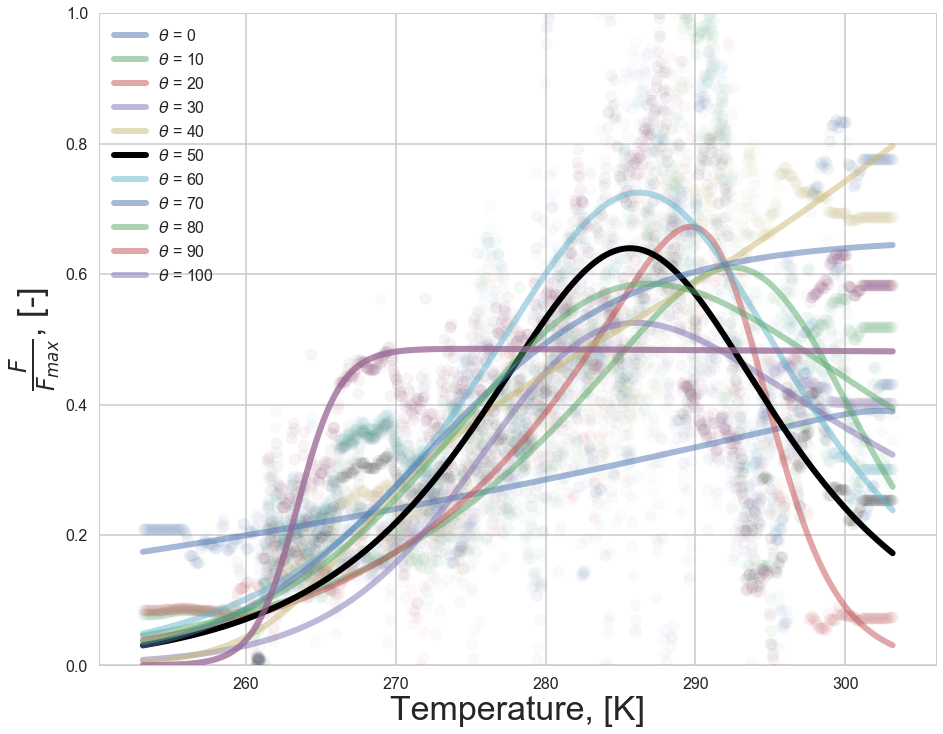

In [1120]:
cond =10
for i in np.arange(0,11):
    cond = i*10
    p0=[2.90000000e+02,  -1.09357077e+05,  7.00896111e+02,   2.03652714e+05]
    xdata = fun_arr[fun_arr['SWC_1']==cond]['TS_2'] + 273.15
    ydata = (fun_arr[fun_arr['SWC_1']==cond]['FC'] + 1)/max(fun_arr[fun_arr['SWC_1']==cond]['FC'] + 1)
    try:
        popt, pcov = sp.optimize.curve_fit(temp_dep_fun_3, xdata, ydata, p0)
        if cond == 50:
            a=1.; c='k'
        else:
            a=0.5; c=None
        plt.plot(xdata, temp_dep_fun_3(xdata, *popt ), label=r'$\theta$ = '+ str(cond), lw=6, alpha=a, color=c)
    except:
        pass
    plt.scatter(xdata, ydata, label=None, alpha=0.03, color=c)
    plt.legend()
    plt.xlabel('Temperature, [K]')
    plt.ylabel(r'$\frac{F}{F_{max}}$, [-]')

plt.ylim(0,1)
if save_fig:
# if True:
    plt.savefig('img/T_dependence_all.png', dpi=150)

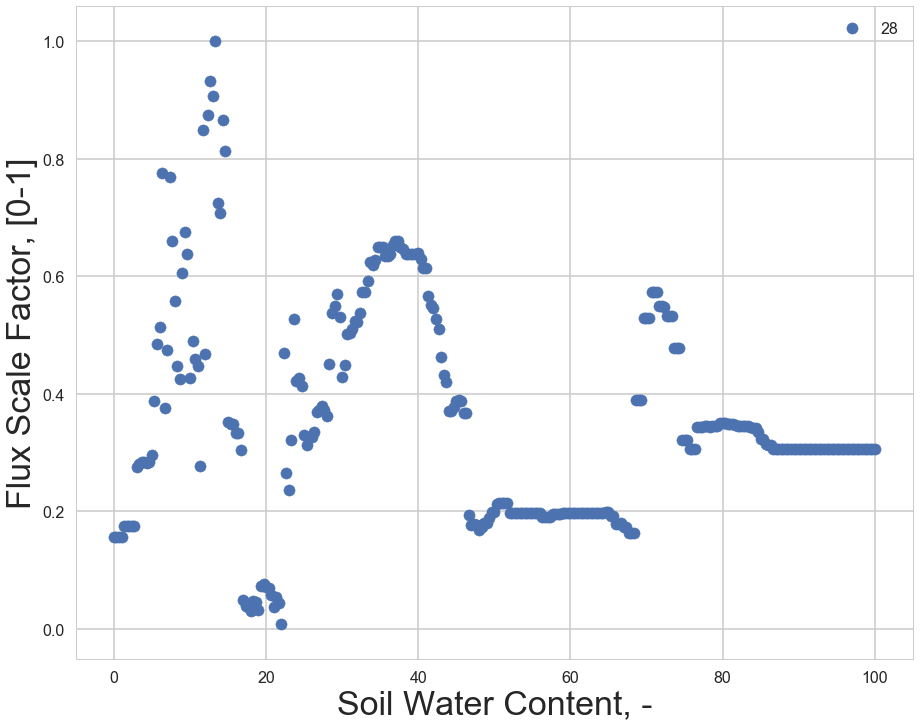

In [547]:
for i in np.arange(0,1):
    cond = 2*i + 28
    xdata = fun_arr[fun_arr['TS_2']==cond]['SWC_1']
    ydata = fun_arr[fun_arr['TS_2']==cond]['FC'] + 1
#     try:
#         popt, pcov = sp.optimize.curve_fit(temp_dep_fun_3, xdata, ydata)
#         plt.plot(xdata, temp_dep_fun_3(xdata, *popt ), label=cond, lw=6)
#     except: 
#         pass
    plt.scatter(xdata, ydata/max(ydata), label=cond)
    plt.legend()
    plt.xlabel('Soil Water Content, -')
    plt.ylabel('Flux Scale Factor, [0-1]')

In [576]:
import math
def norm_dist(x, mu=0, sig=0.2):
    return 1/np.sqrt(2*math.pi*sig**2) * np.exp(-(x-mu)**2/(2*sig**2))

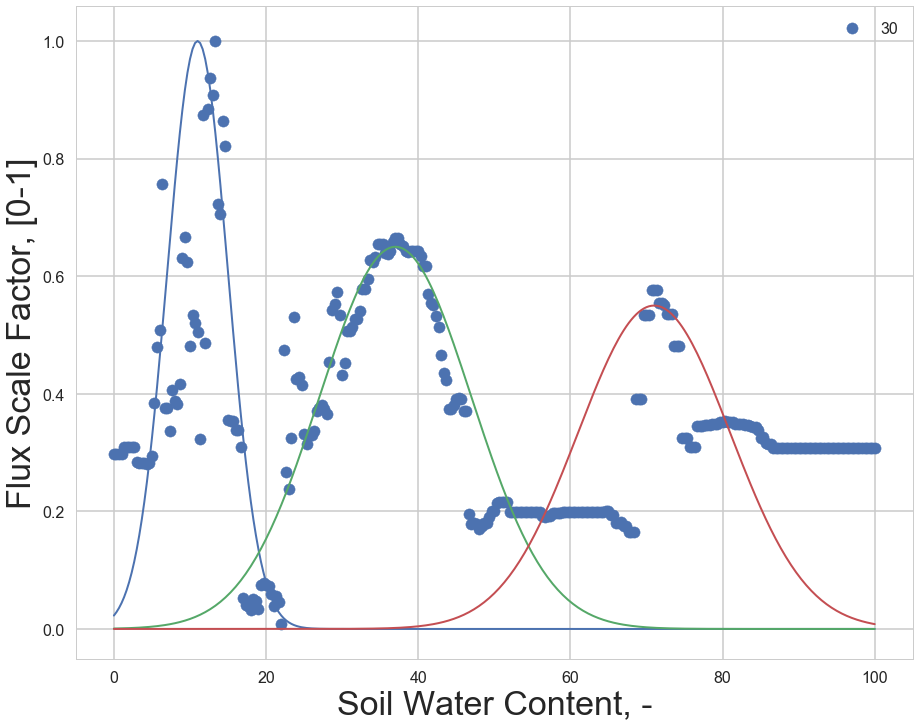

In [973]:
cond = 30
xdata = fun_arr[fun_arr['TS_2']==cond]['SWC_1']
ydata = fun_arr[fun_arr['TS_2']==cond]['FC'] + 1
#     try:
#         popt, pcov = sp.optimize.curve_fit(temp_dep_fun_3, xdata, ydata)
#         plt.plot(xdata, temp_dep_fun_3(xdata, *popt ), label=cond, lw=6)
#     except: 
#         pass
plt.scatter(xdata, ydata/max(ydata), label=cond)
plt.legend()
plt.xlabel('Soil Water Content, -')
plt.ylabel('Flux Scale Factor, [0-1]')

x = SWC_test/100
mu=0.11
sig=0.04
plt.plot(x*100, norm_dist(x, mu, sig)/max(norm_dist(x, mu, sig)))
mu=0.37
sig=0.1
plt.plot(x*100, 0.65*norm_dist(x, mu, sig)/max(norm_dist(x, mu, sig)))
mu=0.71
sig=0.1
plt.plot(x*100, 0.55*norm_dist(x, mu, sig)/max(norm_dist(x, mu, sig)))


In [741]:
def sin_dumped(x, A, B, k, omega, phi):
    return A*np.exp(-k*x)*(np.cos(omega*x+phi)+np.sin(omega*x+phi))+ B

[0.400815231, 0.402400094, 0.01254152307, 0.190869194, 37.398385]


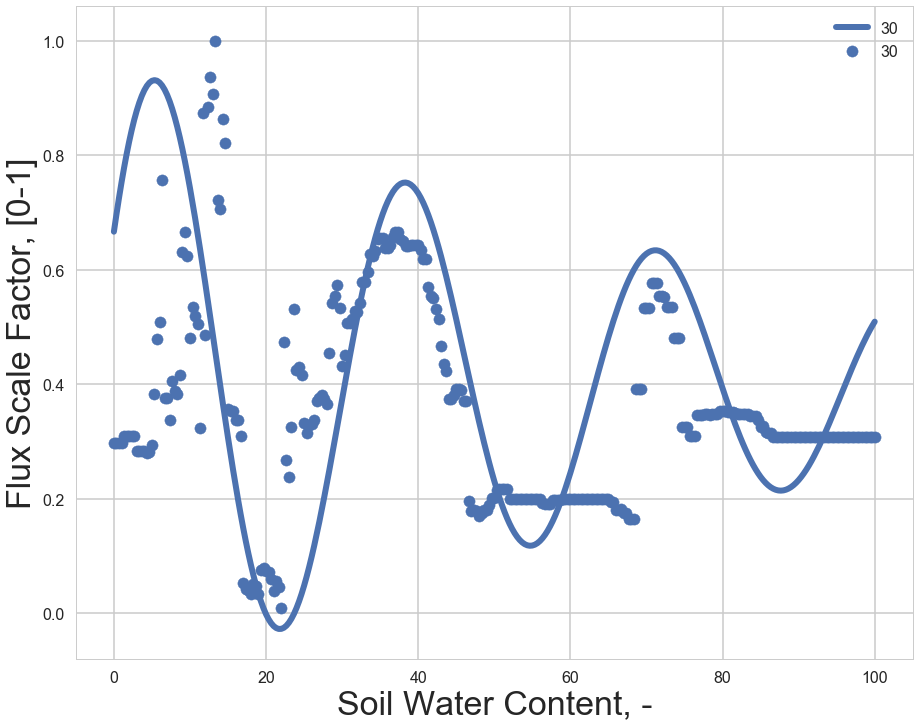

In [909]:
cond = 30
xdata = fun_arr[fun_arr['TS_2']==cond]['SWC_1']
ydata = fun_arr[fun_arr['TS_2']==cond]['FC'] + 1
#     try:
#         popt, pcov = sp.optimize.curve_fit(temp_dep_fun_3, xdata, ydata)
#         plt.plot(xdata, temp_dep_fun_3(xdata, *popt ), label=cond, lw=6)
#     except: 
#         pass
plt.scatter(xdata, ydata/max(ydata), label=cond)
# x = SWC_test/100
# p0=[1,0.3, 0.1, 0.3, 35]
# p0 = [  3.79189144e-01,   5.30584737e-01,   3.17511477e-02,   2.32875997e-01,   3.60664036e+01]
# popt, pcov = sp.optimize.curve_fit(sin_dumped, SWC_test, ydata/max(ydata), p0, method='trf')
# popt = [  2.79189144e-01,   3.90584737e-01,   3.17511477e-02,   2.32875997e-01,   3.60664036e+01,   8.59899365e-04]
# popt = [  3.79189144e-01,   5.30584737e-01,   3.17511477e-02,   2.32875997e-01,   3.60664036e+01,   1.59899365e-03]

popt = [4.00815231e-01, 4.02400094e-01, 1.254152307e-02, 1.90869194e-01, 3.73983850e+01]
plt.plot(SWC_test, sin_dumped(SWC_test, *popt), label=cond, lw=6)
print(popt)

# plt.plot(SWC_test, sin_dumped(SWC_test,*p0))




plt.legend()
plt.xlabel('Soil Water Content, -')
plt.ylabel('Flux Scale Factor, [0-1]')



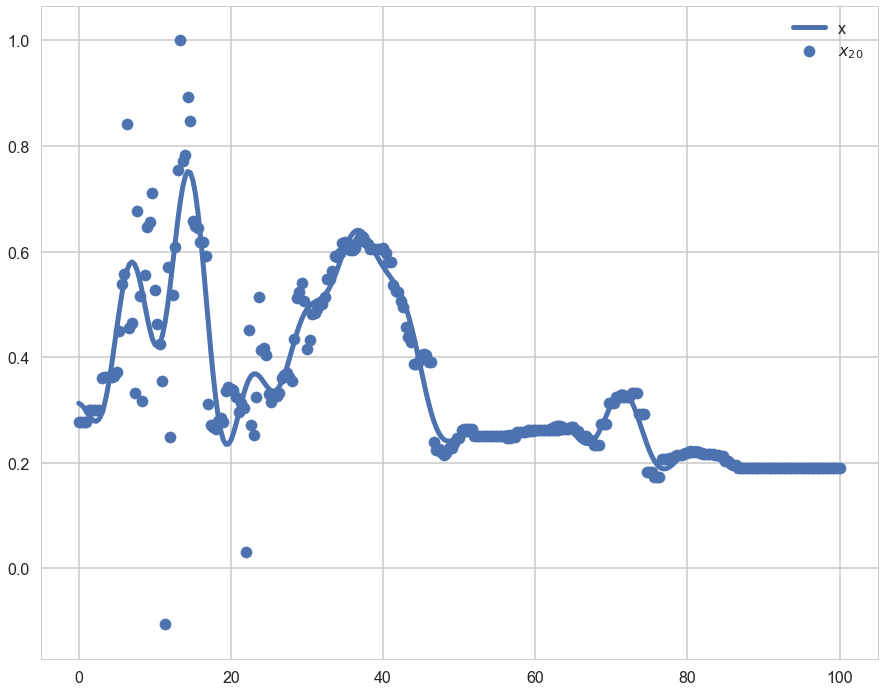

In [717]:
from scipy.fftpack import dct, idct
import matplotlib.pyplot as plt
N = 301
t = SWC_test
x = ydata/max(ydata)
y = dct(x, norm='ortho')
window = np.zeros(N)
window[:30] = 1
yr = idct(y*window, norm='ortho')
sum(abs(x-yr)**2) / sum(abs(x)**2)

plt.scatter(t, x)
plt.plot(t, yr, lw=5)

plt.legend(['x', '$x_{20}$', '$x_{15}$'])
plt.show()

In [1089]:
def theta_dep(x, mu1=0.11, sig1=0.04, mu2=0.37, sig2=0.1, mu3=0.71, sig3=0.1, mu4=1.1, sig4=0.2):
    a = 0.85*norm_dist(x, mu1, sig1)/max(norm_dist(x, mu1, sig1))
    b = 0.5*norm_dist(x, mu2, sig2)/max(norm_dist(x, mu2, sig2))
    c = 0.3*norm_dist(x, mu3, sig3)/max(norm_dist(x, mu3, sig3))
    d = 0.3*norm_dist(x, mu4, sig4)/max(norm_dist(x, mu4, sig4))
    return a + b + c + d

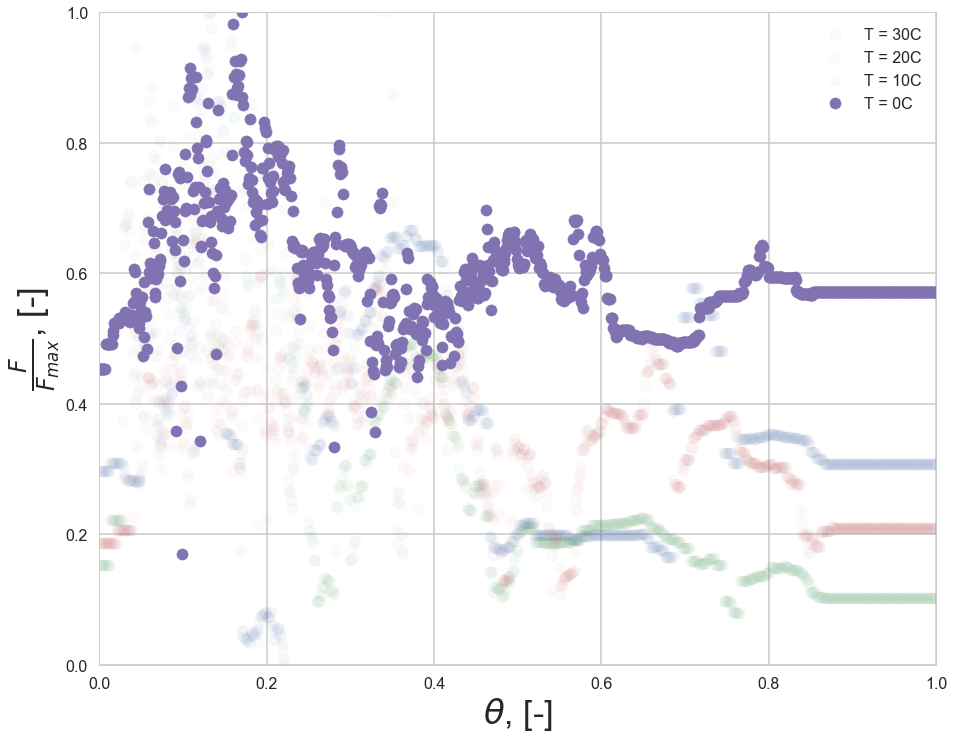

In [1129]:
cond = 30
# for cond in [30,20,10, 0]:
xdata = fun_arr[fun_arr['TS_2']==cond]['SWC_1']
ydata = fun_arr[fun_arr['TS_2']==cond]['FC'] + 1
    #     try:
    #         popt, pcov = sp.optimize.curve_fit(temp_dep_fun_3, xdata, ydata)
    #         plt.plot(xdata, temp_dep_fun_3(xdata, *popt ), label=cond, lw=6)
    #     except: 
    #         pass
plt.scatter(xdata/100, ydata/max(ydata), label='T = '+str(cond)+'C', alpha = .03)


cond = 20
# for cond in [30,20,10]:
xdata = fun_arr[fun_arr['TS_2']==cond]['SWC_1']
ydata = fun_arr[fun_arr['TS_2']==cond]['FC'] + 1
    #     try:
    #         popt, pcov = sp.optimize.curve_fit(temp_dep_fun_3, xdata, ydata)
    #         plt.plot(xdata, temp_dep_fun_3(xdata, *popt ), label=cond, lw=6)
    #     except: 
    #         pass
plt.scatter(xdata/100, ydata/max(ydata), label='T = '+str(cond)+'C', alpha = .03)

cond = 10
# for cond in [30,20,10]:
xdata = fun_arr[fun_arr['TS_2']==cond]['SWC_1']
ydata = fun_arr[fun_arr['TS_2']==cond]['FC'] + 1
    #     try:
    #         popt, pcov = sp.optimize.curve_fit(temp_dep_fun_3, xdata, ydata)
    #         plt.plot(xdata, temp_dep_fun_3(xdata, *popt ), label=cond, lw=6)
    #     except: 
    #         pass
plt.scatter(xdata/100, ydata/max(ydata), label='T = '+str(cond)+'C', alpha = .03)

cond = 0
# for cond in [30,20,10]:
xdata = fun_arr[fun_arr['TS_2']==cond]['SWC_1']
ydata = fun_arr[fun_arr['TS_2']==cond]['FC'] + 1
    #     try:
    #         popt, pcov = sp.optimize.curve_fit(temp_dep_fun_3, xdata, ydata)
    #         plt.plot(xdata, temp_dep_fun_3(xdata, *popt ), label=cond, lw=6)
    #     except: 
    #         pass
plt.scatter(xdata/100, ydata/max(ydata), label='T = '+str(cond)+'C', alpha = 1)

plt.ylabel(r'$\frac{F}{F_{max}}$, [-]')
plt.legend()
plt.xlabel(r'$\theta$, [-]')

plt.ylim(0,1)
plt.xlim(0,1)
if save_fig:
# if True:
    plt.savefig('img/Theta_dependence_0.png', dpi=150)


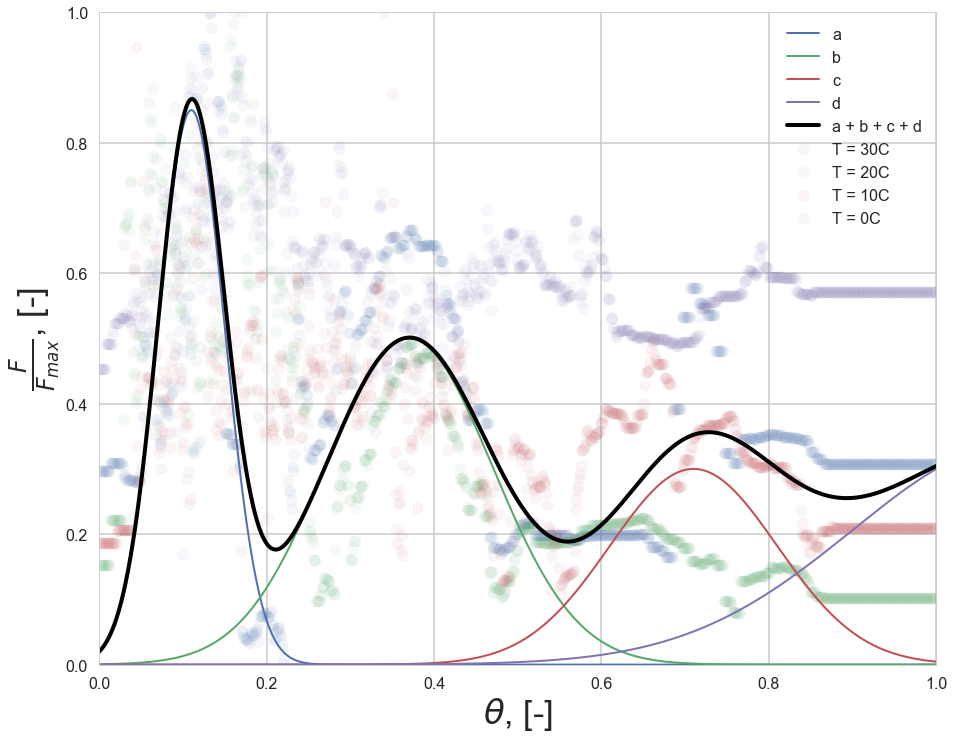

In [1128]:
for cond in [30,20,10,0]:
    xdata = fun_arr[fun_arr['TS_2']==cond]['SWC_1']
    ydata = fun_arr[fun_arr['TS_2']==cond]['FC'] + 1
    #     try:
    #         popt, pcov = sp.optimize.curve_fit(temp_dep_fun_3, xdata, ydata)
    #         plt.plot(xdata, temp_dep_fun_3(xdata, *popt ), label=cond, lw=6)
    #     except: 
    #         pass
    plt.scatter(xdata/100, ydata/max(ydata), label='T = '+str(cond)+'C', alpha=.05)
plt.legend()
plt.xlabel(r'$\theta$, [-]')

x = SWC_test/100
mu=0.11
sig=0.04
a = 0.85*norm_dist(x, mu, sig)/max(norm_dist(x, mu, sig))
plt.plot(x, a, label='a', lw=2)
mu=0.37
sig=0.1
b = 0.5*norm_dist(x, mu, sig)/max(norm_dist(x, mu, sig))
plt.plot(x, b, label='b',lw=2)
mu=0.71
sig=0.1
c = 0.3*norm_dist(x, mu, sig)/max(norm_dist(x, mu, sig))
plt.plot(x, c, label='c',lw=2)
mu=1.1
sig=0.2
d = 0.3*norm_dist(x, mu, sig)/max(norm_dist(x, mu, sig))
plt.plot(x, d, label='d',lw=2)
plt.plot(x, theta_dep(x, mu1=0.11, sig1=0.04, mu2=0.37, sig2=0.1, mu3=0.71, sig3=0.1, mu4=1.1, sig4=0.2), lw=4, label='a + b + c + d', color='k')
plt.ylabel(r'$\frac{F}{F_{max}}$, [-]')
plt.legend()
plt.ylim(0,1)
plt.xlim(0,1)
if save_fig:
# if True:
    plt.savefig('img/Theta_dependence_fit.png', dpi=150)

In [786]:
swc = fun_arr[fun_arr['TS_2']==cond]['SWC_1']
ts = fun_arr[fun_arr['TS_2']==cond]['TS_2']



/Users/MarkelovIgor/anaconda/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


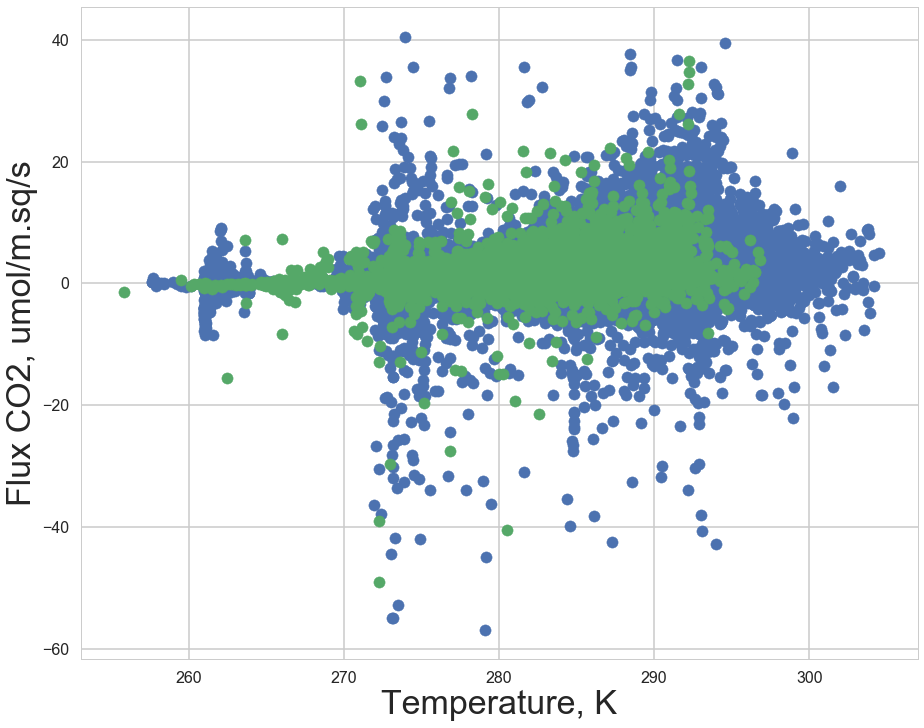

In [433]:
cond =10
for i in np.arange(1,3):
    cond = i*10
    xdata = df[(df['SWC_1']>cond-1) & (df['SWC_1']<cond+1) & (df['day_light_bool']==False)]['TS_2'] + 273.15
    ydata = df[(df['SWC_1']>cond-1) & (df['SWC_1']<cond+1) & (df['day_light_bool']==False)]['FC'] 
#     popt, pcov = sp.optimize.curve_fit(temp_dep_fun_3, xdata, ydata)
#     plt.plot(xdata, temp_dep_fun_3(xdata, *popt ), label=cond, lw=6)
    plt.scatter(xdata, ydata, label=None)
    plt.legend()
    plt.xlabel('Temperature, K')
    plt.ylabel('Flux CO2, umol/m.sq/s')

In [805]:
train.columns

Index(['SWC_1', 'TS_2', 'LOCATION_LONG', 'LOCATION_LAT', 'dayofyear', 'site_n',
       'site', 'FC', 'week_n'],
      dtype='object')

In [806]:
train['estimated_FC']=0

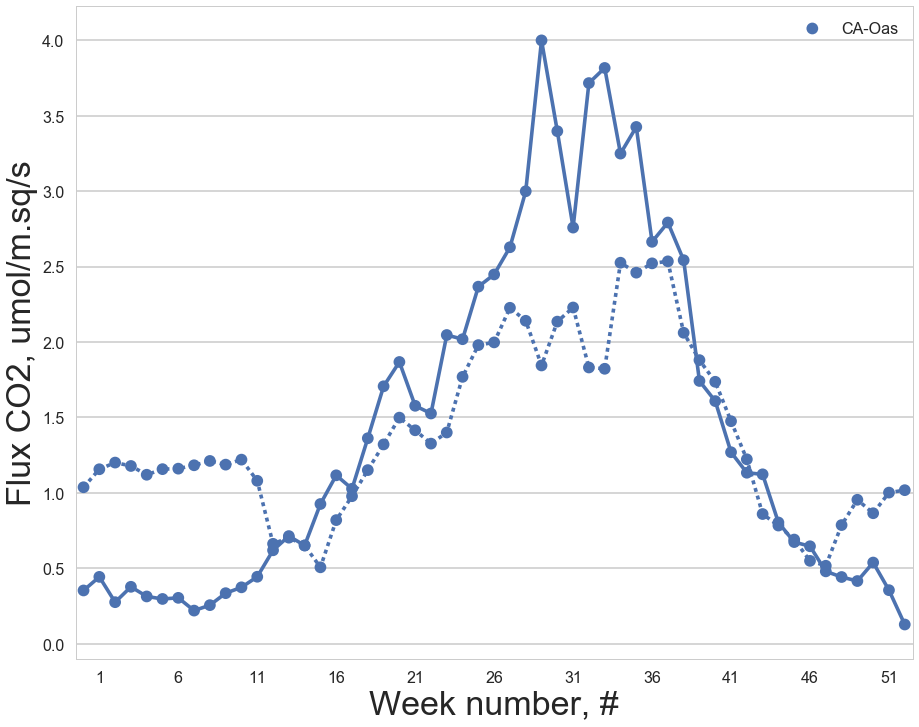

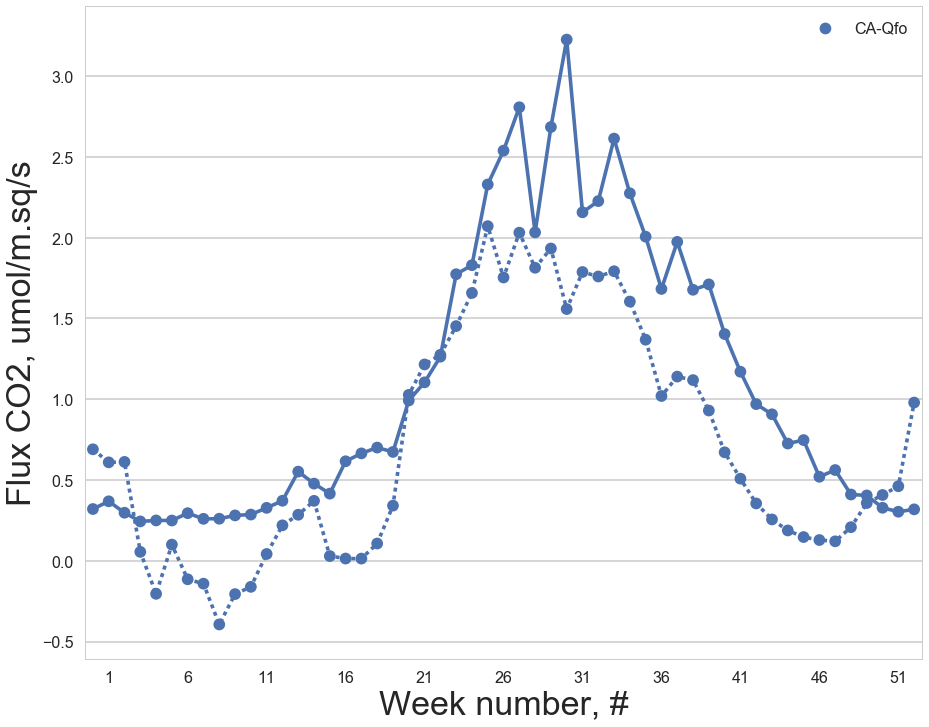

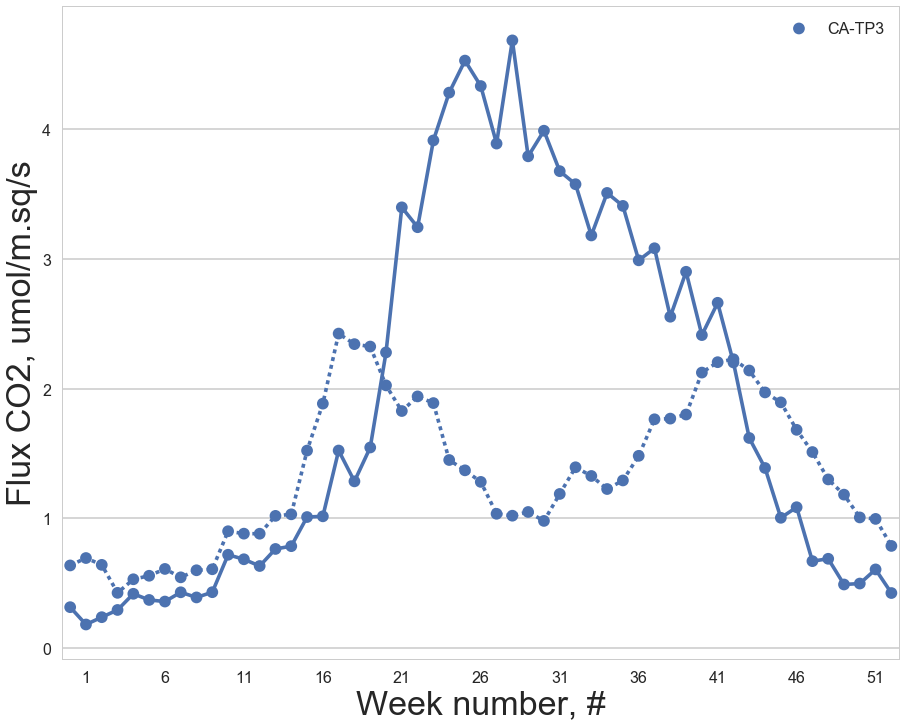

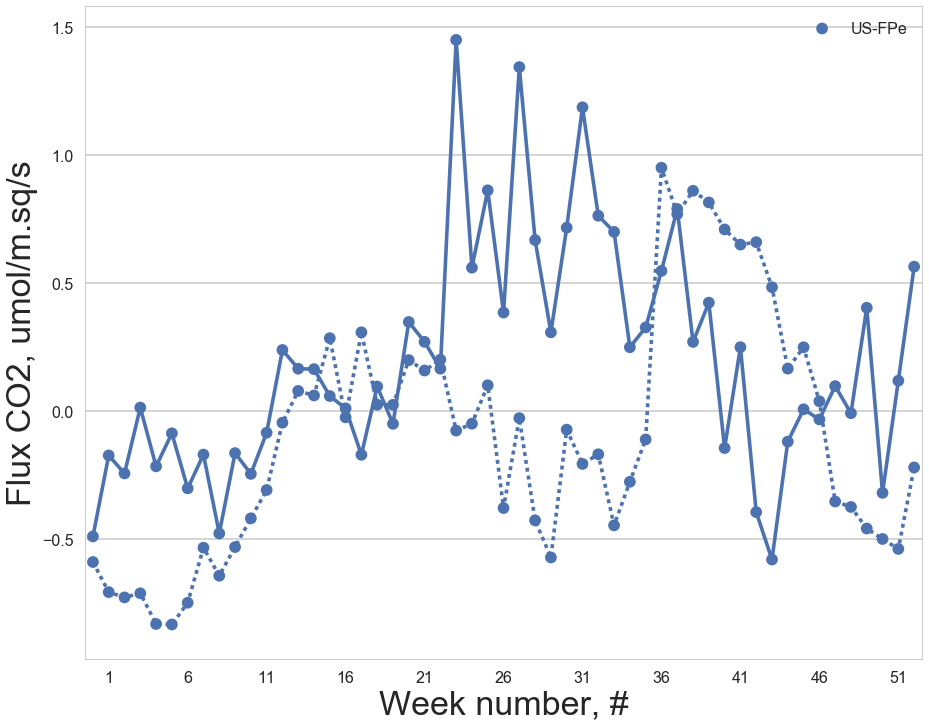

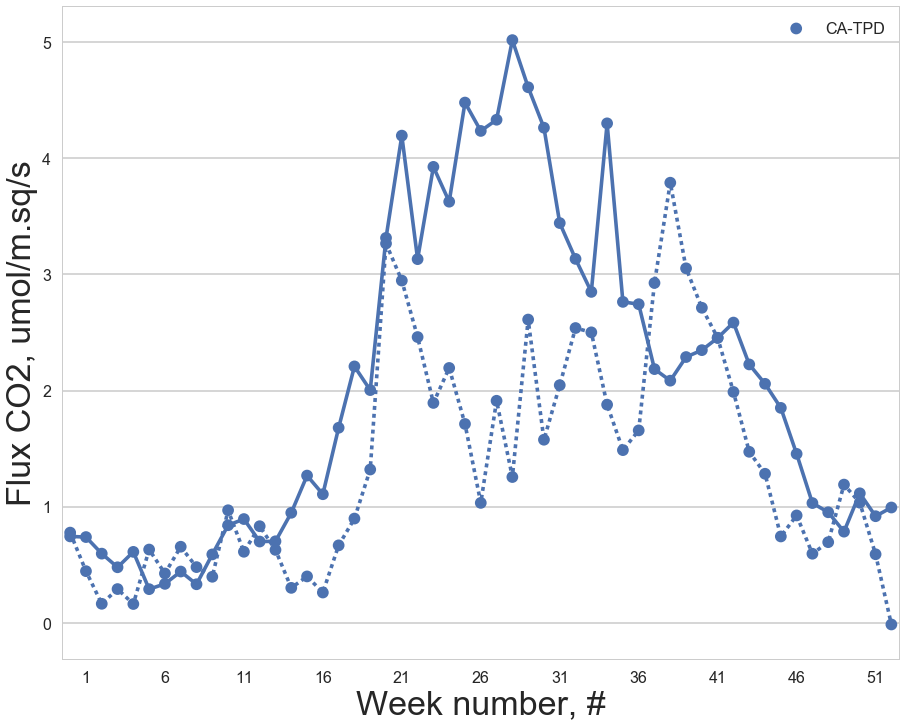

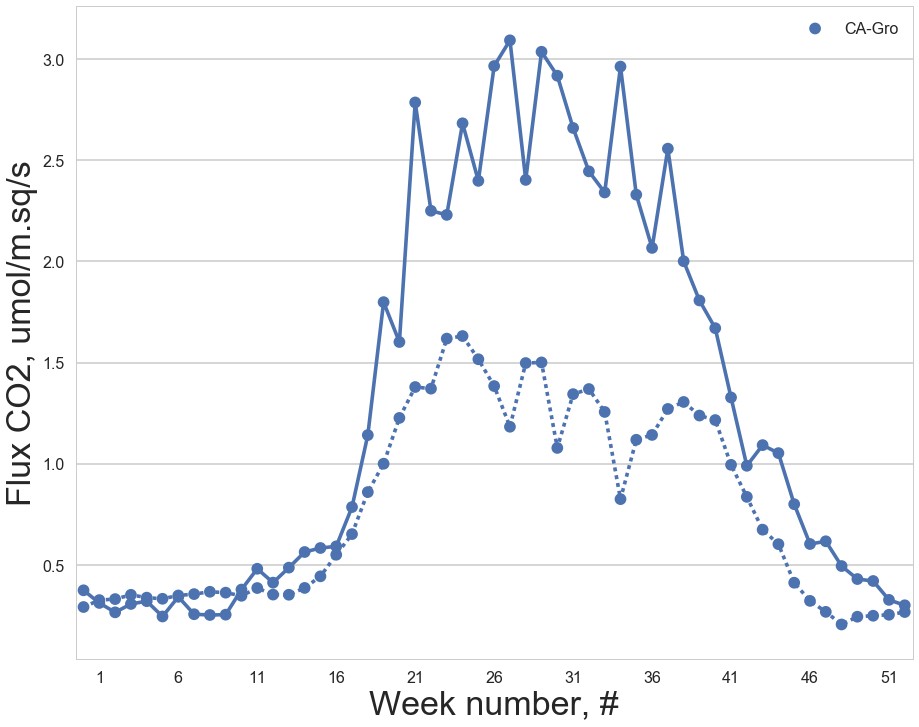

In [1090]:
max_Fx=[12,7,7,6,11,9]
for i,s in enumerate([10,14,20,23,22,0]):
#     train.loc[train['site_n']==s, 'max_Fx'] = max(train[train['site_n']==s]['FC'])
#     max_Fx = np.max(train[train['site_n']==s]['FC'])
    train.loc[train['site_n']==s, 'estimated_FC'] = max_Fx[i]*temp_dep_fun_3(train[train['site_n']==s]['TS_2']+273.15)*theta_dep(train[train['site_n']==s]['SWC_1']/100) - 1.0 # 
#     train[train['site_n']==s]['estimated_FC'] = max_Fx*theta_dep(train[train['site_n']==s]['SWC_1']/100)*temp_dep_fun_3(train[train['site_n']==s]['TS_2']+273.15)
for i,s in enumerate([10,14,20,23,22,0]): #10,14,20,23,22,0]):
#     plt.plot(test.index, test['FC'], label=s, color=c)
    try:
        g = sns.pointplot(x='week_n', y='FC', data=train[train['site_n']==s], ci=0, hue='site', label=s)
        g = sns.pointplot(x='week_n', y='estimated_FC', linestyles=':', data=train[train['site_n']==s], ci=0)
        g.set_xticks(np.arange(1,53,5))
        g.set_xticklabels(np.arange(1,53,5))
    except:
        pass
    plt.ylabel('Flux CO2, umol/m.sq/s')
    plt.xlabel('Week number, #')
    plt.legend()

    if save_fig:
#     if True:
        plt.savefig('img/Reverse_engin/{}.png'.format(s), dpi=150)


    plt.show()

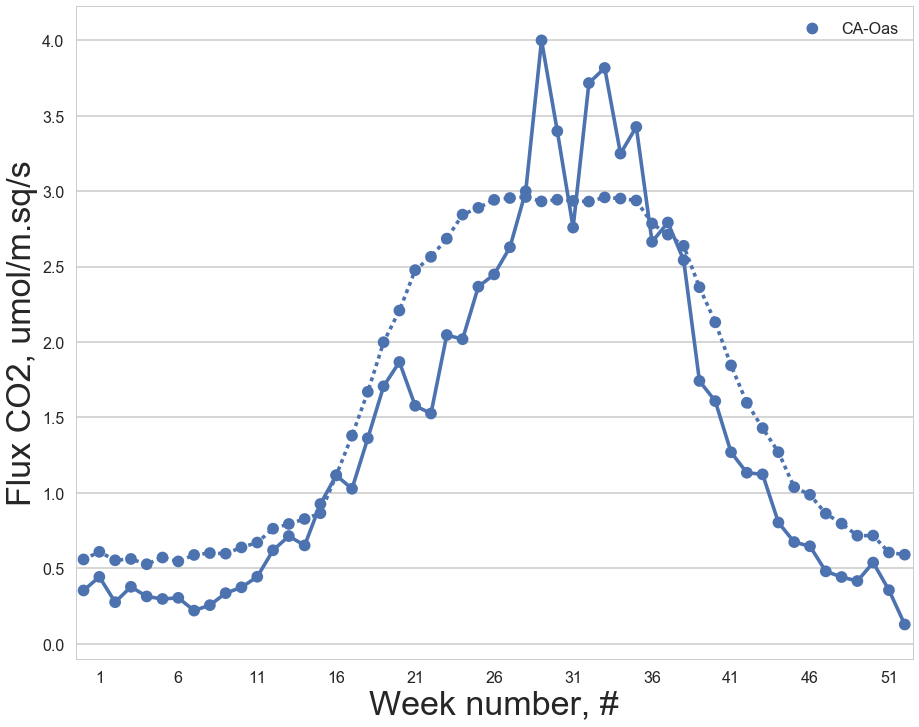

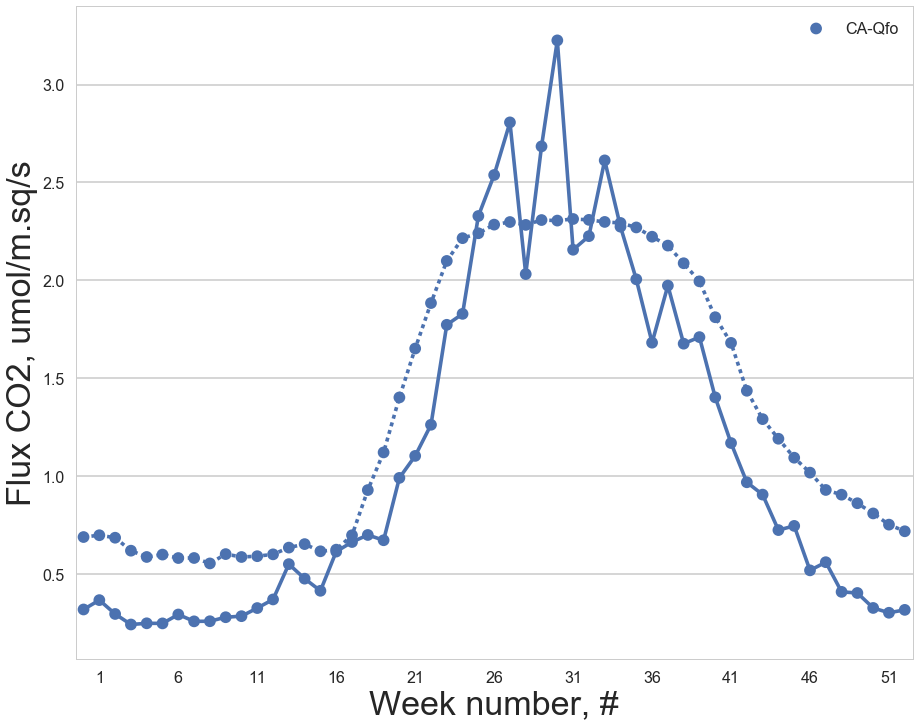

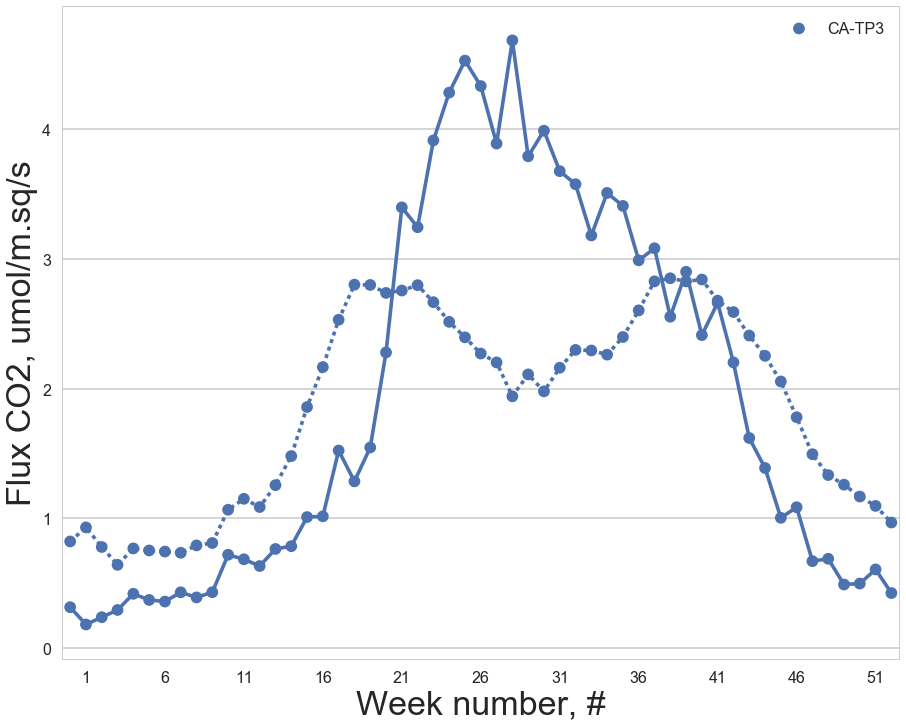

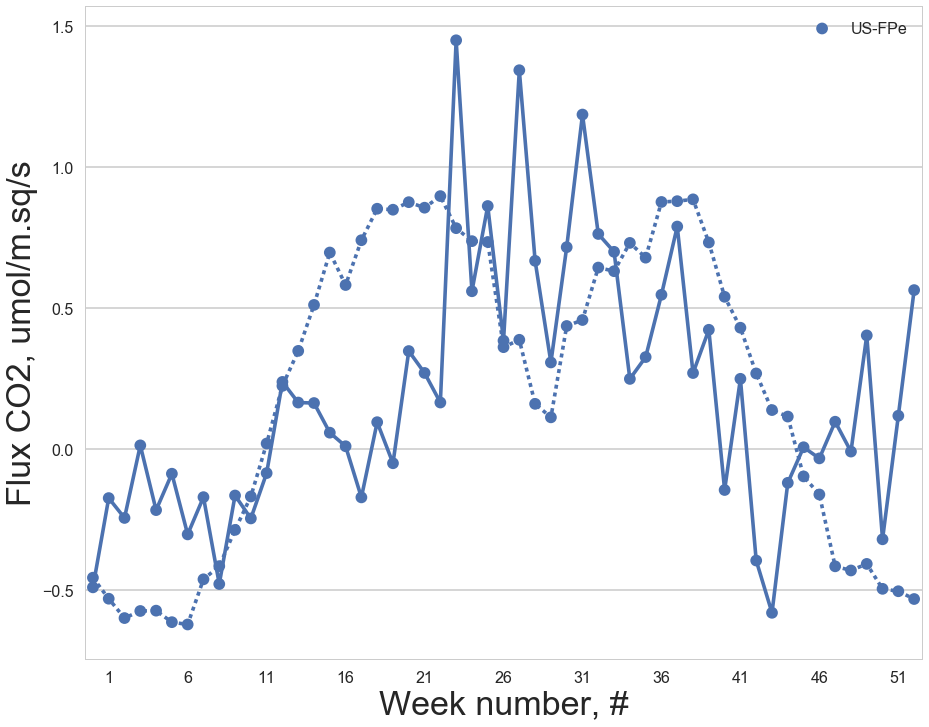

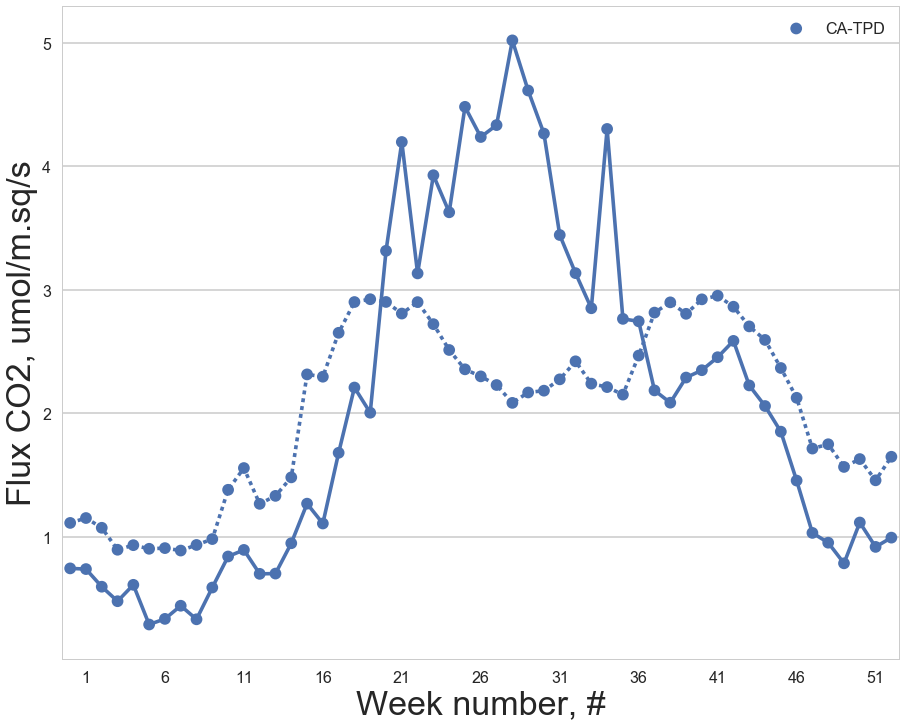

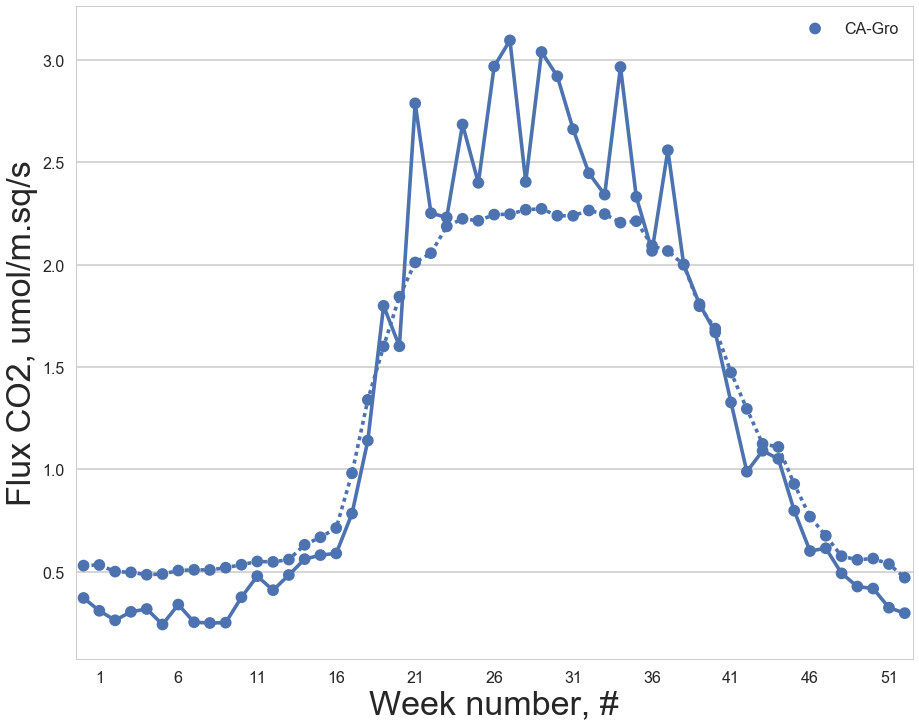

In [906]:
max_Fx=[6,5,6,3,6,5]
for i,s in enumerate([10,14,20,23,22,0]):
#     train.loc[train['site_n']==s, 'max_Fx'] = max(train[train['site_n']==s]['FC'])
#     max_Fx = np.max(train[train['site_n']==s]['FC'])
    train.loc[train['site_n']==s, 'estimated_FC'] = max_Fx[i]*temp_dep_fun_3(train[train['site_n']==s]['TS_2']+273.15) - 1.0 # *theta_dep(train[train['site_n']==s]['SWC_1']/100)
#     train[train['site_n']==s]['estimated_FC'] = max_Fx*theta_dep(train[train['site_n']==s]['SWC_1']/100)*temp_dep_fun_3(train[train['site_n']==s]['TS_2']+273.15)
for i,s in enumerate([10,14,20,23,22,0]): #10,14,20,23,22,0]):
#     plt.plot(test.index, test['FC'], label=s, color=c)
    try:
        g = sns.pointplot(x='week_n', y='FC', data=train[train['site_n']==s], ci=0, hue='site', label=s)
        g = sns.pointplot(x='week_n', y='estimated_FC', linestyles=':', data=train[train['site_n']==s], ci=0)
        g.set_xticks(np.arange(1,53,5))
        g.set_xticklabels(np.arange(1,53,5))
    except:
        pass
    plt.ylabel('Flux CO2, umol/m.sq/s')
    plt.xlabel('Week number, #')
    plt.legend()

    if save_fig:
#     if True:
        plt.savefig('img/Reverse_engin_only_T/{}.png'.format(s), dpi=150)


    plt.show()